Input Sensitivity and Transferability of Performance Prediction Models of Configurable Systems
--
Case study: x264 video encoder 

Note: the following Python script should be located in x264-inputsensitivity to have a relative access to data.  
Between operating systems, videos datasets are not imported in the same order, hence an explicit and exhaustive ordered list of data in the beginning of the import 

In [1]:
import os
import pandas as pd
import numpy as np
from sklearn import preprocessing

## We are studying two quantitative/performance properties: 
# elapsed time
# and size of the output 
# we have two distinct datasets for both

predDimension = "size" # "elapsedtime" # 
    
### It is simple/convenient to fix the "order" of dataset once and for all 
# (listing can be sensitive to eg an operating system)
### if you want you can use this method
#dataFolder="./datay4m" 
#listeAdresse = []
#adresseIni = os.listdir(dataFolder)
#for video in adresseIni: 
#    listeRep = os.listdir(dataFolder + "/" + video)
#    for rep in listeRep:
#        listeAdresse.append(dataFolder + "/" + video + "/" + rep)

# dataFolder="./datacalda" 
# all processing using the same exact cluster on IGRIDA (calda) and video format (y4m)
# (experiments suggest that hardware or video format does influence execution time)

dataTimeFolder = './datacalda2/'
dataSizeFolder = './datay4m2/'

def mkDataTime(): 
    return [dataTimeFolder + 'x264-1908-bridgefar-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-1908-ice-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-1908-flower-wasm/x264-results1.csv',
# './datacalda/x264-0408-tos3k-wasm/x264-results1.csv', # can't retrieve the original video
 dataTimeFolder + 'x264-1908-caire-wasm/x264-results1.csv',
# './datacalda/x264-0308-sintel-wasm/x264-results1.csv', # same as calda for time
 dataTimeFolder + 'x264-0208-sintel-calda-wasm/x264-results1.csv', # representative video, right? 
 dataTimeFolder + 'x264-1908-footballcif-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-0308-crowd_run-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-0608-blue-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-0608-people-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-1908-sunflowers-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-0408-deadline-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-2108-bridgeclose-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-1908-husky-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-1908-tennis-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-1908-riverbed-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-0608-park-wasm/x264-results1.csv',
 dataTimeFolder + 'x264-0508-soccer-wasm/x264-results1.csv']

# dataFolder="./datay4m"
# all processing using the same video format (y4m) 
# (experiments confirm that hardware/cluster does not change anything about the size)
def mkDataSize(): 
    return [dataSizeFolder + 'x264-1908-akiyo-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-bridgefar-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-football15-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0608-tractor-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-ice-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-students-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-flower-wasm/x264-results1.csv',
# './datay4m/x264-0408-tos3k-wasm/x264-results1.csv', # can't retrieve the original video
 dataSizeFolder + 'x264-1908-caire-wasm/x264-results1.csv',
# './datay4m/x264-0308-sintel-wasm/x264-results1.csv', # same as calda for size
 dataSizeFolder + 'x264-0208-sintel-calda-wasm/x264-results1.csv', # representative video, right? 
 dataSizeFolder + 'x264-0308-ducks-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-footballcif-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0308-crowd_run-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0608-blue-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0608-people-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-sunflowers-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-2108-netflix-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0408-deadline-wasm/x264-results1.csv',
# './datay4m/x264-0208-crowd_run-bermuda-wasm/x264-results1.csv', # same as crowd above
 dataSizeFolder + 'x264-2108-bridgeclose-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-husky-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-waterfall-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0308-mobilesif-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-1908-tennis-wasm/x264-results1.csv',
 # './datay4m/x264-0408-football-wasm/x264-results1.csv', # same as football15
 dataSizeFolder + 'x264-1908-riverbed-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0608-park-wasm/x264-results1.csv',
 dataSizeFolder + 'x264-0508-soccer-wasm/x264-results1.csv']
 
# the key idea is to have in the *same order* video (for the size dataset or the time dataset)
# ie each "common" video will have the same "identifier"
def mkData(): 
    
    sizeAlignment = [x.replace(dataSizeFolder, '') for x in mkDataSize()]
    timeAlignment = [x.replace(dataTimeFolder, '') for x in mkDataTime()]
    common = []
    for s in sizeAlignment: 
        if s in timeAlignment:
            common.append(s)    
            
    common = np.sort(common)

    specificSize = []
    for s in sizeAlignment: 
        if s not in timeAlignment:
            specificSize.append(s)

    specificSize = np.sort(specificSize)
            
    # unnecessary 
    specificTime = []
    for t in timeAlignment: 
        if t not in sizeAlignment:
            specificTime.append(t)

    # time datas are subsets of size datas
    assert(len(specificSize) + len(common) == len(sizeAlignment))
    assert (len(specificTime) == 0)
    
    if predDimension == "size":     # mkDataSize()
        return list(map(lambda s: dataSizeFolder + s, np.append(common, specificSize)))
    elif predDimension == "elapsedtime":     #mkDataTime() 
        return list(map(lambda s: dataTimeFolder + s, np.append(common, specificTime)))
    else: 
        print("Error (pred dimension unknown)")

listeAdresse = mkData() # mkDataTime() #
if predDimension == "size":
    assert(len(listeAdresse) == len(mkDataSize()))
elif predDimension == "elapsedtime":
    assert(len(listeAdresse) == len(mkDataTime()))
#print(np.sort(mkDataSize()))
#print(np.sort(mkDataTime()))

#print(np.intersect1d(mkDataSize(), mkDataTime()))


        
# creation of the list of videos (for each video: x264 configurations + measurements)
listeVideo = []
for adresse in listeAdresse:
    listeVideo.append(pd.read_csv(open(adresse,"r")))
# test
print("There are " + str(len(listeVideo)) + " videos")
assert (len(listeAdresse) == len(listeVideo))
listeAdresse
#vidEx = listeVideo[0][0:5]
#vidEx.drop(['usertime', 'systemtime'], axis=1)
#pd.DataFrame(listeVideo[2])#['elapsedtime']


##### NORMALIZATION 
#X = []
#for i in range(len(listeVideo)):
#    X.append(listeVideo[i][predDimension])

#norms = pd.DataFrame(preprocessing.normalize(X, norm='max')).transpose()
#for i in range(len(listeVideo)):
#    listeVideo[i][predDimension] = norms[i]
    
## example
#listeVideo[1].drop(['size', 'usertime', 'systemtime', 'H264', 'no_asm', 'configurationID'], axis=1)


# categorical variables (pointless), scikit facilities should be used!
#for lv in listeVideo:
#    lv['ref'] = lv['ref'].astype('category')
#    lv['rc_lookahead'] = lv['rc_lookahead'].astype('category')

listeVideo[7].drop(['no_8x8dct', 'no_deblock', 'no_mixed_refs', 'no_weightb', 'size', 'usertime', 'systemtime', 'H264', 'no_asm', 'configurationID'], axis=1)[:10]
#pd.get_dummies(listeVideo[1])

There are 25 videos


,no_cabac,no_fast_pskip,no_mbtree,rc_lookahead,ref,elapsedtime
0,False,True,False,20,9,3.444
1,True,True,False,40,9,4.744
2,False,False,True,40,1,2.427
3,True,True,True,40,9,3.447
4,False,False,False,60,5,2.957
5,True,True,False,60,5,3.876
6,False,False,False,60,1,2.628
7,True,True,False,60,1,2.563
8,False,True,False,60,1,2.279
9,False,True,False,60,9,5.034


In [2]:
import pandas as pd
# excerpt of data 
# works for predDimension = elapsedtime 
def mkPredColumnName(eVideo):
    return predDimension + " (video " + str(eVideo) + ")" 
    
print("Running example: used for measure-example.tex (elapsedtime, good correlation)")
### elapsedtime 
eVideo1 = 7
eVideo2 = 9
df_short_example = pd.concat([pd.DataFrame(listeVideo[eVideo1]).rename(columns={predDimension: mkPredColumnName(eVideo1)})
           
           , pd.DataFrame(listeVideo[eVideo2][predDimension]).rename(columns={predDimension: mkPredColumnName(eVideo2)})], axis=1).filter(['configurationID', 'no_cabac', 'no_mixed_refs', 'no_deblock', 'no_mbtree', 'ref', 'rc_lookahead', mkPredColumnName(eVideo1), mkPredColumnName(eVideo2)]).sort_values(by=['configurationID'])[:10].reset_index(drop = True)
print(df_short_example.to_latex(index=False))

# pearson coefficient on this very limited sample (10)
np.corrcoef(df_short_example[mkPredColumnName(eVideo1)], df_short_example[mkPredColumnName(eVideo2)])[0,1] 


Running example: used for measure-example.tex (elapsedtime, good correlation)
\begin{tabular}{rllllrrrr}
\toprule
 configurationID &  no\_cabac &  no\_mixed\_refs &  no\_deblock &  no\_mbtree &  ref &  rc\_lookahead &  size (video 7) &  size (video 9) \\
\midrule
               1 &     False &           True &        True &      False &    9 &            20 &       1718492.0 &        845930.0 \\
               2 &     False &           True &        True &      False &    5 &            20 &       1742359.0 &        847328.0 \\
               3 &      True &           True &       False &       True &    5 &            60 &       3840421.0 &        746470.0 \\
               4 &      True &           True &       False &       True &    1 &            60 &       4503471.0 &        755325.0 \\
               5 &      True &          False &        True &       True &    9 &            40 &       3925695.0 &        725608.0 \\
               6 &     False &          False &        True &

-0.90158370596655

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('default')
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16) 
plt.rc('figure', titlesize=16) 

#plt.style.use('seaborn-notebook') 
#SMALL_SIZE = 8
#MEDIUM_SIZE = 10
#BIGGER_SIZE = 12

#plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
#plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
#plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
#plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
#plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


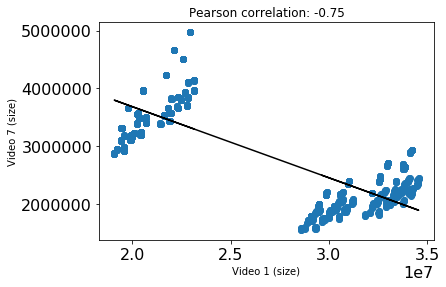

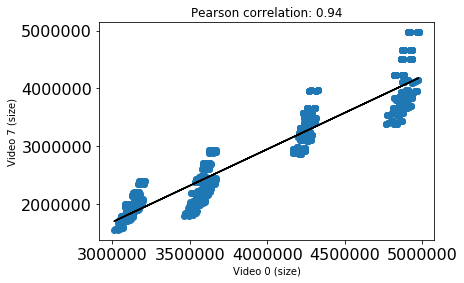

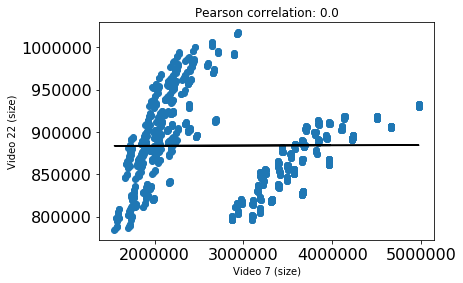

In [4]:
from scipy import stats


def plotCorrelationVideo(v1ID, v2ID,plot=True, filename=None):
    video1 = listeVideo[v1ID][:]
    video2 = listeVideo[v2ID][:]
    v1 = video1[predDimension]
    v2 = video2[predDimension]
    corr_pear_c = np.corrcoef(v1,v2)[0,1]
    
    if plot:
        fig = plt.figure()
        plt.scatter(v1,v2)   
        slope, intercept, r_value, p_value, std_err = stats.linregress(v1, v2)
        plt.plot(v1,slope*v1+intercept,color="black")   
        plt.xlabel("Video %d (%s)" % (v1ID, predDimension))
        plt.ylabel("Video %d (%s)" % (v2ID, predDimension))
        plt.title("Pearson correlation: " + str(round(corr_pear_c, 2)))
        if (filename is None): # default
            filename = "correlation-v" + str(v1ID) + "v" + str(v2ID) + ".pdf"
        fig.savefig(filename, format="pdf", bbox_inches='tight')
    return corr_pear_c

if (predDimension == "elapsedtime"):
    # example (worst)
    v1ID = 7
    v2ID = 9
    # example (good)
    v1goodID = 7
    v2goodID = 16
    
    plotCorrelationVideo(v1ID, v2ID, plot=True)
    plotCorrelationVideo(v1goodID, v2goodID, plot=True)
elif (predDimension == "size"):
    # example (one of the worst wrt negative)
    v1ID = 1
    v2ID = 7
    # example (worst and closed to 0)
    v1worstID = 7
    v2worstID = 22
    # good 
    v1goodID = 0
    v2goodID = 7
    
    plotCorrelationVideo(v1ID, v2ID, plot=True, filename="worst-negative-corr-size.pdf")
    plotCorrelationVideo(v1goodID, v2goodID, plot=True, filename="good-corr-size.pdf")
    plotCorrelationVideo(v1worstID, v2worstID, plot=True, filename="worst-corr-size.pdf")
    
#plotCorrelationVideo(2, 0, plot=True)


Correlation matrix (Pearson and Spearman)
--

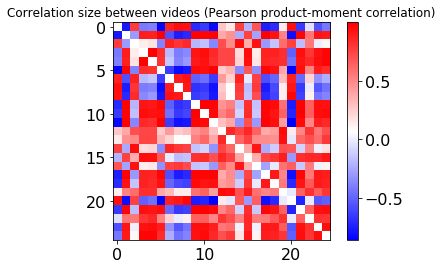

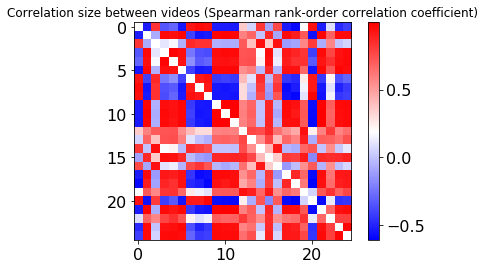

/usr/local/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Difference between Spearman and Pearson (size ):  (min) nan (max) nan (std) nan 
Min, max, std, mean of Pearson (size) :  -0.86 1.00 0.59 0.34
Min, max, std, mean of Spearman (size) :  -0.61 1.00 0.55 0.40


<Figure size 432x288 with 0 Axes>

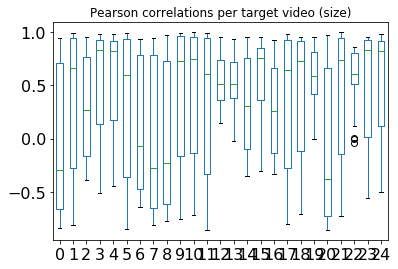

<Figure size 432x288 with 0 Axes>

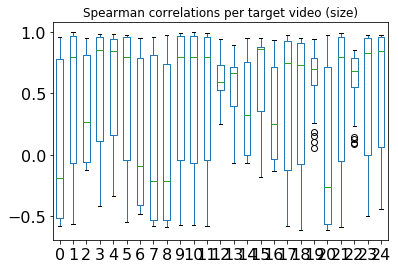

<Figure size 432x288 with 0 Axes>

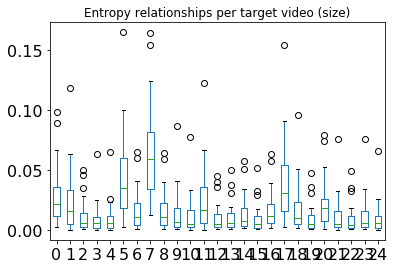

0 with 7 (0.9606322098358814 ) // Spearman
0 with 7 (0.9420496040433305) // Pearson
0 with 20 (0.0024644651922831593) // Entropy
1 with 10 (0.9968842716092017 ) // Spearman
1 with 11 (0.9916453885844058) // Pearson
1 with 11 (0.0003631545413172956) // Entropy
2 with 14 (0.9528482026817306 ) // Spearman
2 with 14 (0.9553962135480134) // Pearson
2 with 12 (0.0007787070961613087) // Entropy
3 with 4 (0.9821573823191408 ) // Spearman
3 with 4 (0.9862699544595664) // Pearson
3 with 4 (0.00016140794662364505) // Entropy
4 with 3 (0.9821573823191408 ) // Spearman
4 with 3 (0.9862699544595664) // Pearson
4 with 3 (0.00016147362424681941) // Entropy
5 with 1 (0.9778896814646573 ) // Spearman
5 with 11 (0.9947372732165269) // Pearson
5 with 17 (0.002459571037005908) // Entropy
6 with 8 (0.9460758708716648 ) // Spearman
6 with 8 (0.9309204176135096) // Pearson
6 with 8 (0.0006505180692254196) // Entropy
7 with 0 (0.9606322098358814 ) // Spearman
7 with 0 (0.9420496040433305) // Pearson
7 with 0 (

0.0017578037677310977

In [5]:
from scipy import stats 
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as sc

from numpy import *

# https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.spearmanr.html
# https://docs.scipy.org/doc/numpy/reference/generated/numpy.corrcoef.html

nbVideos = len(listeVideo)

#corrUserTime = [[0 for x in range(nbVideos)] for y in range(nbVideos)]
#corrElap= [[0 for x in range(nbVideos)] for y in range(nbVideos)]
# corrElapSpearman= [[0 for x in range(nbVideos)] for y in range(nbVideos)]
#corrSys= [[0 for x in range(nbVideos)] for y in range(nbVideos)]

#corrTaille = [[0 for x in range(nbVideos)] for y in range(nbVideos)]
#corrTailleSpearman = [[0 for x in range(nbVideos)] for y in range(nbVideos)]


corrPearson= [[0 for x in range(nbVideos)] for y in range(nbVideos)] 
corrSpearman= [[0 for x in range(nbVideos)] for y in range(nbVideos)] # rank-based 
corrEntropy = [[0 for x in range(nbVideos)] for y in range(nbVideos)]


# pour chaque vidéo, on calcule sa corrélation (Pearson) avec toutes les autres

for i in range(nbVideos):
    for j in range(nbVideos):
        if (i == j):
            corrPearson[i][j] = NaN
            corrSpearman[i][j] = NaN
            corrEntropy[i][j] = NaN
        #corrUserTime[i][j] = np.corrcoef(listeVideo[i].usertime,listeVideo[j].usertime)[0,1]
        #corrSys[i][j] = np.corrcoef(listeVideo[i]['systemtime'],listeVideo[j]['systemtime'])[0,1]
        else:
            corrPearson[i][j] = np.corrcoef(listeVideo[i][predDimension],listeVideo[j][predDimension])[0,1]
            corrSpearman[i][j] = stats.spearmanr(listeVideo[i][predDimension],listeVideo[j][predDimension]).correlation
            corrEntropy[i][j] = sc.entropy(pk=listeVideo[i][predDimension],
                                       qk=listeVideo[j][predDimension])
       # corrElap[i][j] = np.corrcoef(listeVideo[i]['elapsedtime'],listeVideo[j]['elapsedtime'])[0,1]
       # corrElapSpearman[i][j] = stats.spearmanr(listeVideo[i]['elapsedtime'],listeVideo[j]['elapsedtime']).correlation
       # corrTaille[i][j] = np.corrcoef(listeVideo[i]['size'],listeVideo[j]['size'])[0,1]
       # corrTailleSpearman[i][j] = stats.spearmanr(listeVideo[i]['size'],listeVideo[j]['size']).correlation 

#plt.imshow(corrUserTime,cmap='Reds',interpolation='nearest')
#plt.title('Correlations (user time) between videos (Pearson product-moment correlation)')
#plt.colorbar()
#plt.show()
#print("Les coefficicients des temps utilisateurs sont très corrélés, les coef. sont souvent > 0.8")
#print("C'est bon signe, on doit pourvoir trouver des paramètres optimaux")
#rint("communs à toutes les vidéos pour diminuer les temps users")

plt.imshow(corrPearson,cmap='bwr',interpolation='nearest')
plt.title('Correlation ' + predDimension + ' between videos (Pearson product-moment correlation)')
plt.colorbar()
plt.savefig("correlation-" + predDimension + "-pearson.png")
plt.show()
#print("Les temps écoulés sont également fortement correlés entre les vidéos")
#print("Mais on peut voir une 'anomalie' dans certaines vidéos")

        
plt.imshow(corrSpearman,cmap='bwr',interpolation='nearest')
plt.title('Correlation ' + predDimension + ' between videos (Spearman rank-order correlation coefficient)')
plt.colorbar()
plt.savefig("correlation-" + predDimension + "-spearman.png")
plt.show()

# difference between Spearman and Pearson 
dPS = np.subtract(corrPearson, corrSpearman)
print("Difference between Spearman and Pearson (" + predDimension + " ):  (min) %.2f (max) %.2f (std) %.2f " % (np.min(dPS), np.max(dPS), np.std(dPS)))

# system time (can be future work but cautious: (1) hard to interpret/isolate system time wrt x264); (2) less usable/actionable
#plt.imshow(corrSys,cmap='Reds',interpolation='nearest')
#plt.title('Corrélations des temps systèmes')
#plt.colorbar()
#plt.show()
# print("Les temps système sont moins corrélés linéairement, peut-être un autre type de relation")

      
#plt.imshow(corrTaille,cmap='bwr',interpolation='nearest')
#plt.title('Correlation (sizes) between videos (Pearson)')
#plt.colorbar()
#plt.show()
#print("En revanche, les tailles des vidéos dépendent moins des paramètres d'entrée")
#print("Un paramètre peut donner une bonne qualité pour une vidéo mais une mauvaise pour une autre")
#print("Du coup, l'intérêt, c'est de classifier les vidéos pour comprendre l'influence des paramètres sur leur taille")
    

#plt.imshow(corrTailleSpearman,cmap='bwr',interpolation='nearest') # origin='bottom',
#plt.title('Correlations (sizes) between videos (Spearman)')
#plt.colorbar()
#plt.show()


# no difference between Spearman and Pearson 
#dTaille = np.subtract(corrTaille, corrTailleSpearman)
#print("Negligible difference between Spearman and Pearson:  %.2f %.2f %.2f" % (np.std(dTaille), np.min(dTaille), np.max(dTaille)))

print("Min, max, std, mean of Pearson (" + predDimension + ") :  %.2f %.2f %.2f %.2f" 
      % (np.nanmin(corrPearson), np.nanmax(corrPearson), np.nanstd(corrPearson), np.nanmean(corrPearson)))
print("Min, max, std, mean of Spearman (" + predDimension + ") :  %.2f %.2f %.2f %.2f" 
      % (np.nanmin(corrSpearman), np.nanmax(corrSpearman), np.nanstd(corrSpearman), np.nanmean(corrSpearman)))

plt.figure()
pd.DataFrame(corrPearson).plot.box(title="Pearson correlations per target video (" + str(predDimension) + ")") # abs()
plt.savefig("correlation-" + predDimension + "-spearman-pearson.png") # TODO: remove
plt.savefig("correlation-" + predDimension + "-pearson-pervideo.png")
plt.show()

plt.figure()
pd.DataFrame(corrSpearman).plot.box(title="Spearman correlations per target video (" + str(predDimension) + ")") # abs()
plt.savefig("correlation-" + predDimension + "-spearman-pervideo.png")
plt.show()

plt.figure()
pd.DataFrame(corrEntropy).plot.box(title="Entropy relationships per target video (" + str(predDimension) + ")") # abs()
plt.savefig("correlation-" + predDimension + "-entropy-pervideo.png")
plt.show()

# print(pd.DataFrame(corrSpearman).describe())
bestLinSourcesSpearman = [0 for x in range(len(listeVideo))]
bestLinSourcesPearson = [0 for x in range(len(listeVideo))]
bestEntroSources = [0 for x in range(len(listeVideo))]
for vi in range(len(listeVideo)):
    print(str(vi) + " with " + str(np.nanargmax(pd.DataFrame(corrSpearman)[vi])) + " (" + str(np.nanmax(pd.DataFrame(corrSpearman)[vi])) + " ) // Spearman") # .abs()
    print(str(vi) + " with " + str(np.nanargmax(pd.DataFrame(corrPearson)[vi])) + " (" + str(np.nanmax(pd.DataFrame(corrPearson)[vi])) + ") // Pearson") # .abs()
    print(str(vi) + " with " + str(np.nanargmin(pd.DataFrame(corrEntropy)[vi])) + " (" + str(np.nanmin(pd.DataFrame(corrEntropy)[vi])) + ") // Entropy") # min for Entropy
  
    bestLinSourcesSpearman[vi] = np.nanargmax(pd.DataFrame(corrSpearman)[vi])
    bestLinSourcesPearson[vi] = np.nanargmax(pd.DataFrame(corrPearson)[vi])
    bestEntroSources[vi] = np.nanargmin(pd.DataFrame(corrEntropy)[vi]) # min for Entropy, since best is closed to 0
    
bestLinearSourcesSpearman = pd.DataFrame(bestLinSourcesSpearman, columns=["best_video_source"])
bestLinearSourcesPearson = pd.DataFrame(bestLinSourcesPearson, columns=["best_video_source"])
bestEntropySources = pd.DataFrame(bestEntroSources, columns=["best_video_source"])

corrSpearman[9][14]

In [50]:
minPear = np.nanmin(pd.DataFrame(corrPearson))
maxPear = np.nanmax(pd.DataFrame(corrPearson))
meanPear = np.nanmean(pd.DataFrame(corrPearson))
stdPear = NaN
print("The minimum, maximum, standard deviation, and mean of Pearson are respectively:", minPear, maxPear, meanPear, stdPear)


The minimum, maximum, standard deviation, and mean of Pearson are respectively: -0.8575053983513763 0.9989344514538785 0.3431457488450417 nan


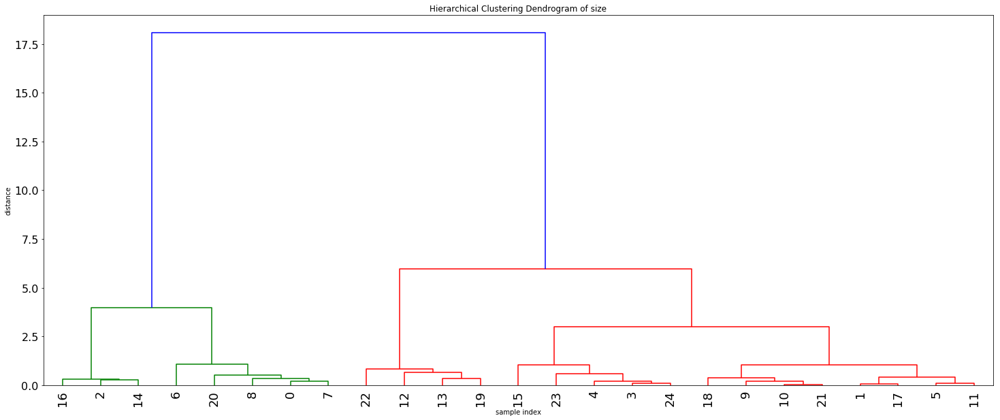

In [7]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import MeanShift


corrPearsonN = pd.DataFrame(corrPearson).fillna(1)
dendTime = linkage(corrPearsonN, method='ward')

plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram of ' + predDimension)
plt.xlabel('sample index')
plt.ylabel('distance')
d = dendrogram(    
    dendTime,    
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=18.,  # font size for the x axis labels
)
d
plt.show()

indicesDimension = d['leaves']

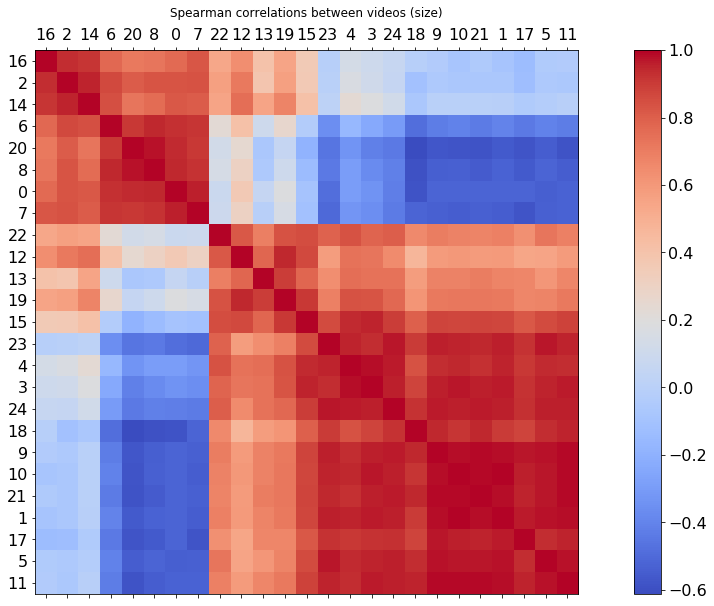

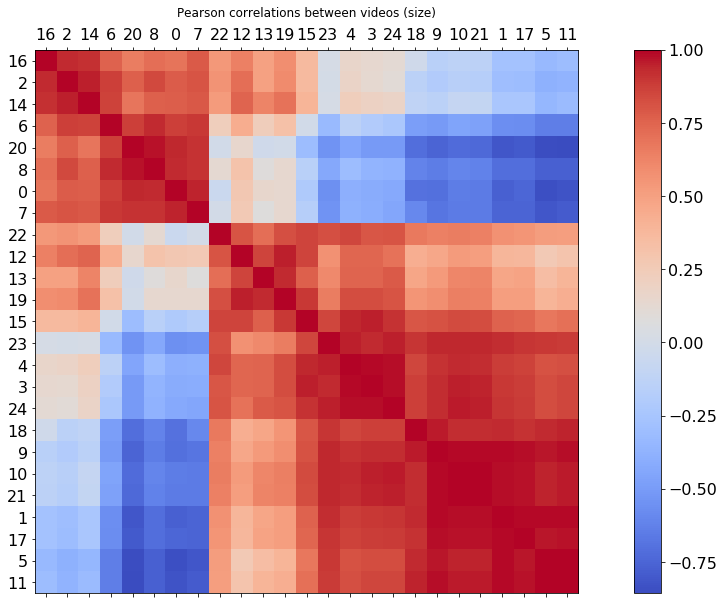

In [8]:
import numpy as np

import matplotlib.pyplot as plt
import pandas as pd

from numpy import *
from scipy import stats 
import scipy.stats as sc

taille = len(listeVideo)

listeVideoTri = []

for i in range(len(indicesDimension)):
    indice = indicesDimension[i]
    listeVideoTri.append(listeVideo[indice])
    
corrTri = [[0 for x in range(taille)] for y in range(taille)]
corrTriPearson = [[0 for x in range(taille)] for y in range(taille)]

for i in range(taille):
    for j in range(taille):
        corrTriPearson[i][j] = np.corrcoef(listeVideoTri[i][predDimension],listeVideoTri[j][predDimension])[0,1]
        corrTri[i][j] = stats.spearmanr(listeVideoTri[i][predDimension],listeVideoTri[j][predDimension]).correlation

#indicesTemps = [29,31,27,17,0,15,5,16,9,11,19,28,14,26,13,2,20,4,22,33,8,7,30,10,21,25,3,18,1,12,32,24,23,6]

#listeVideoTriTemps= []

#for i in range(len(indicesTemps)):
#    indice = indicesTemps[i]
#    listeVideoTriTemps.append(listeVideo[indice])
    
        
#corrTempsTri = [[0 for x in range(taille)] for y in range(taille)]

#for i in range(taille):
 #   for j in range(taille):
        # corrTempsTri[i][j] = np.corrcoef(listeVideoTriTemps[i]['elapsedtime'],listeVideoTriTemps[j]['elapsedtime'])[0,1]
  #      corrTempsTri[i][j] = stats.spearmanr(listeVideoTriTemps[i]['elapsedtime'],listeVideoTriTemps[j]['elapsedtime']).correlation
             

        
def plot_corr(corr,cm,ind,metric,size):
    fig, ax = plt.subplots(figsize=(size, size))
    fig.set_size_inches(20, 10)
    cax = ax.matshow(corr,cmap=cm) # interpolation='nearest'
    plt.xticks(range(len(ind)), ind)
    plt.yticks(range(len(corr.columns)), ind)
    txt = metric + " correlations between videos (" + predDimension + ")"
    plt.title(txt)
    fig.colorbar(cax)    
    fig.savefig('mat' + metric + 'corr-' + predDimension + '.pdf', format='pdf', dpi=100, bbox_inches='tight')
    plt.show()
    


divKL = [[0 for x in range(len(listeVideo))] for y in range(len(listeVideo))]
for i in range(len(listeVideo)):
    for j in range(len(listeVideo)):
        divKL[i][j] = sc.entropy(pk=listeVideo[i][predDimension],
                                       qk=listeVideo[j][predDimension])




plot_corr(pd.DataFrame(corrTri),'coolwarm', indicesDimension, "Spearman", 6)
plot_corr(pd.DataFrame(corrTriPearson),'coolwarm', indicesDimension, "Pearson", 6)
# deprecated for divKL since indices are different (see below)
# plot_corr(pd.DataFrame(divKL), 'coolwarm', indicesDimension, "KD", 6)
#plot_corr(pd.DataFrame(corrTempsTri),'Reds',indicesTemps, 'elapsed time')
#pd.DataFrame(corrTempsTri).describe()

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


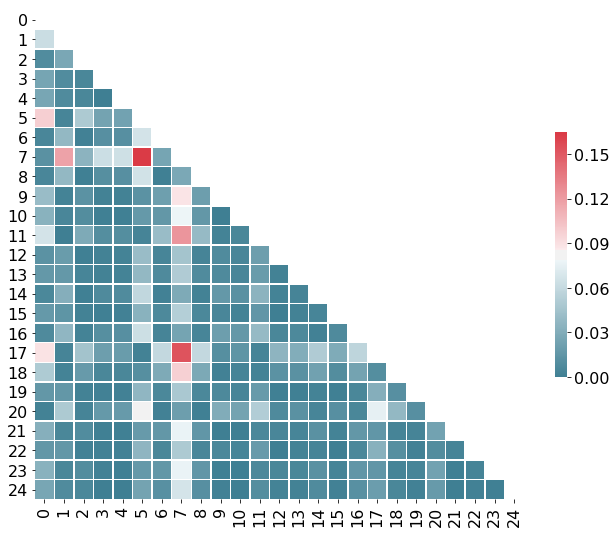

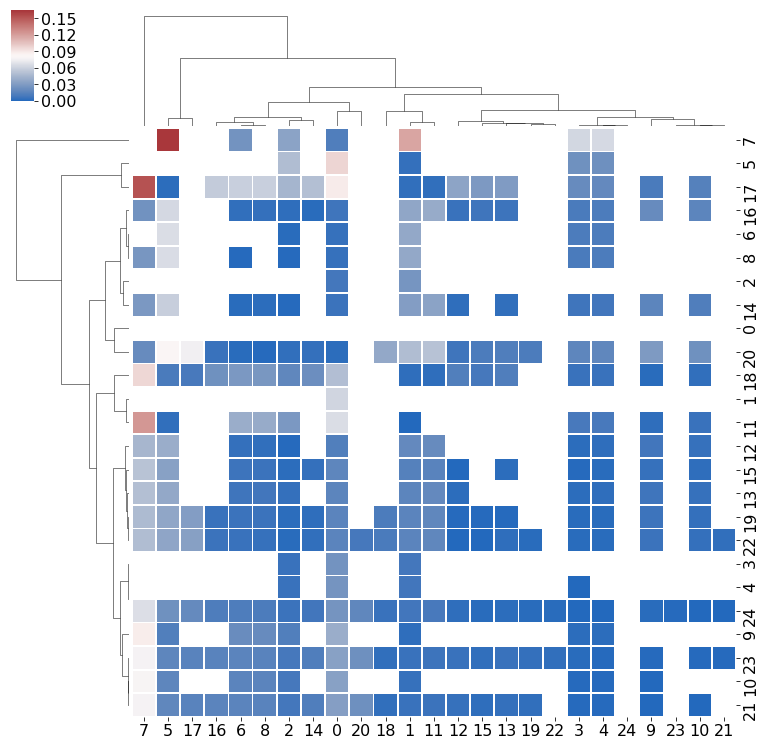

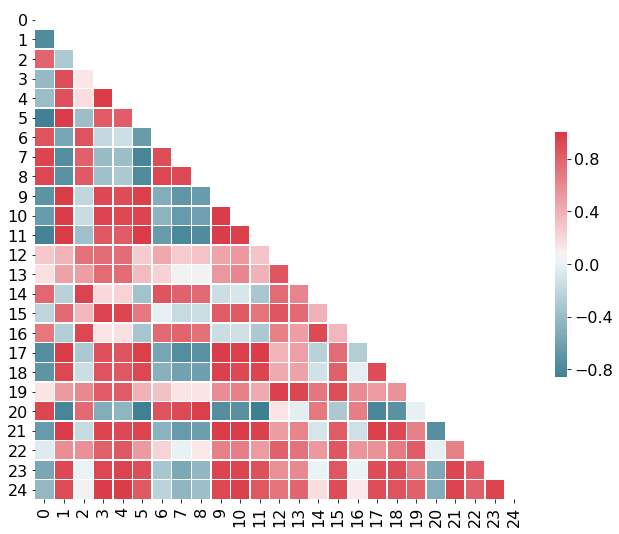

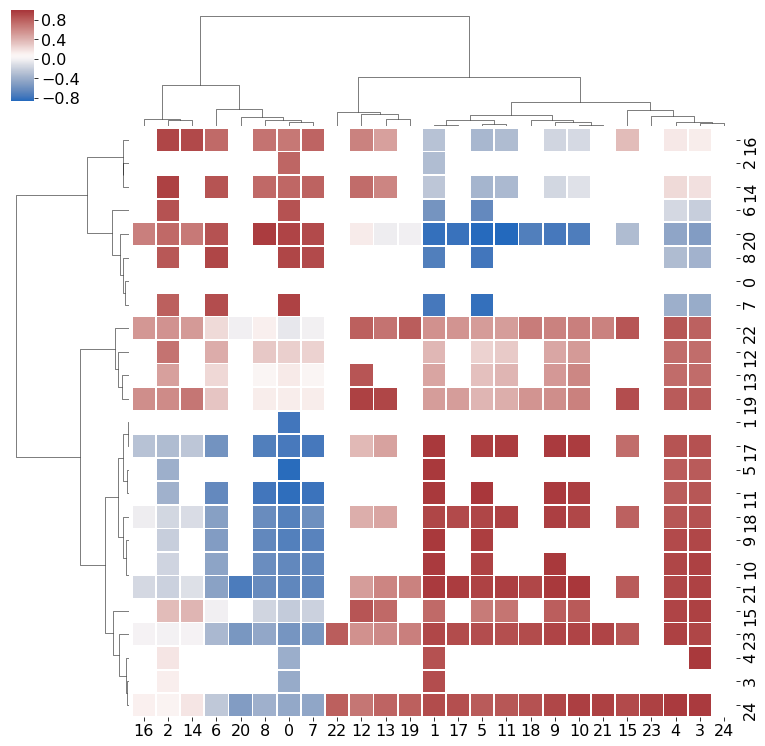

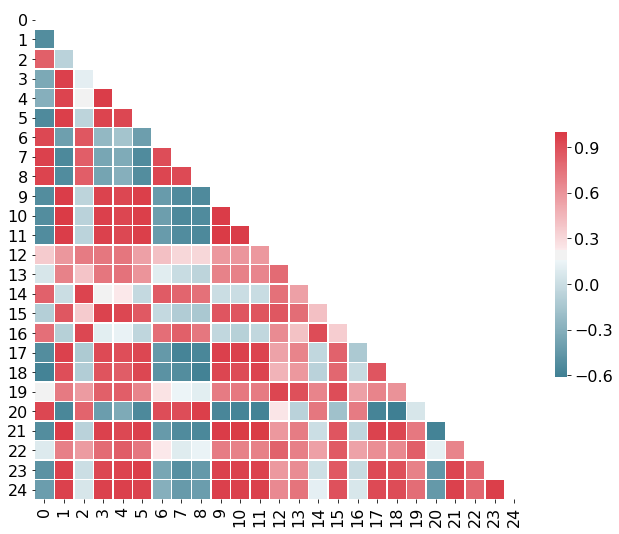

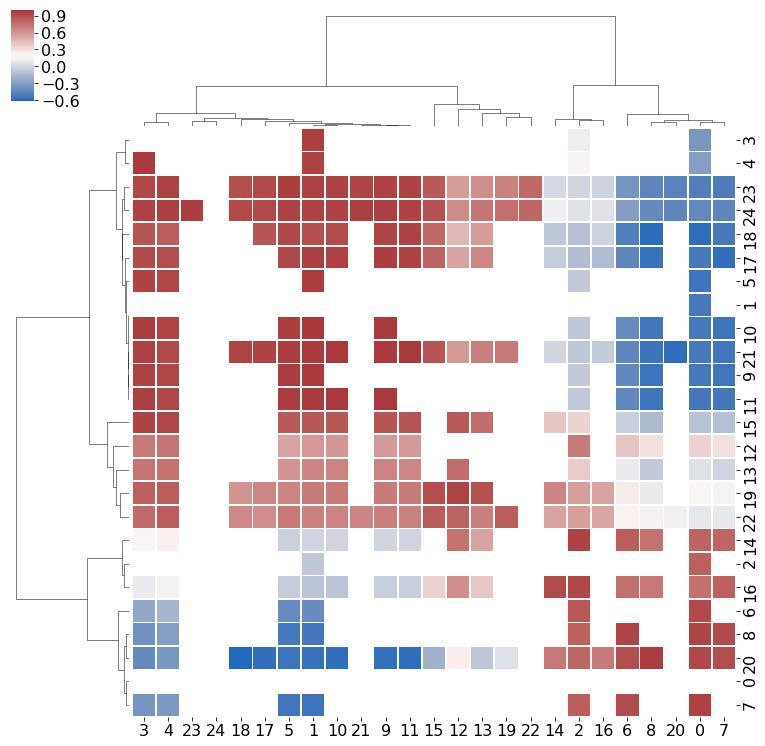

In [9]:
import pandas as pd
import seaborn as sns
#sns.set()
#sns.set(style="white")



def plot_correlationmatrix_dendogram(corr, img_name):
    #
    # http://seaborn.pydata.org/generated/seaborn.clustermap.html
    # https://seaborn.pydata.org/examples/many_pairwise_correlations.html
    # https://seaborn.pydata.org/examples/structured_heatmap.html
    # https://github.com/mwaskom/seaborn/issues/866
    # diagonal correlation + cluster map
    df = pd.DataFrame(corr).fillna(1) 
    # Generate a mask for the upper triangle
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    plt.show()
    sns.clustermap(df, cmap="vlag", mask=mask,
                   #row_colors=network_colors, col_colors=network_colors,
                   linewidths=.75, figsize=(13, 13))
    plt.savefig(img_name)
    plt.show()
    
plot_correlationmatrix_dendogram(divKL, "corrmatrix-dendo-KL-" + predDimension + ".pdf")
plot_correlationmatrix_dendogram(corrPearson, "corrmatrix-dendo-Pearson-" + predDimension + ".pdf")
plot_correlationmatrix_dendogram(corrSpearman, "corrmatrix-dendo-Spearman-" + predDimension + ".pdf")

In [10]:
#pd.DataFrame(corrPearson)

In [11]:
# Do inputs change the performance distributions?

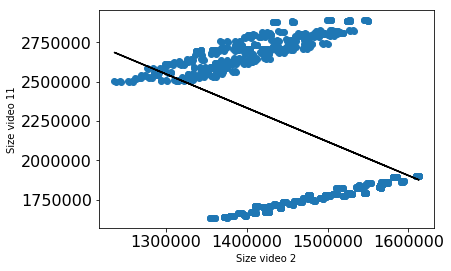

An example where linear regression works very well


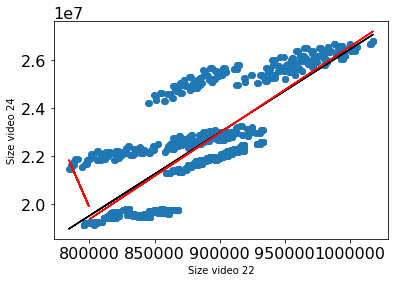

But there are some exceptions like this example.
Intuitively there is a distinction between 2 groups of parameters (homogeneous clusters)


In [12]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt

### TODO: a very specific example ABOUT SIZE 
# DEPRECATED

if (predDimension == "size"):
    v1IDexample = 2
    v2IDexample = 11
    x = listeVideo[v1IDexample]['size']
    y = listeVideo[v2IDexample]['size']

    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    predict = slope*x+intercept

    plt.scatter(x,y)
    plt.xlabel("Size video " + str(v1IDexample))
    plt.ylabel("Size video " + str(v2IDexample))
    plt.plot(x,slope*x+intercept,color="black")
    plt.show()

    print("An example where linear regression works very well")

    v1IDexample = 22 # 22
    v2IDexample = 24
    x = listeVideo[v1IDexample]['size']
    y = listeVideo[v2IDexample]['size']

    plt.scatter(x,y)
    plt.xlabel("Size video " + str(v1IDexample))
    plt.ylabel("Size video " + str(v2IDexample))

    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    predict = slope*x+intercept
    plt.plot(x,predict,color="black")

    # a configuration option is responsible, guess what? mbtreeee 
    xm = x[x<800000]
    ym = y[x<800000]

    slope, intercept, r_value, p_value, std_err = stats.linregress(xm, ym)
    predictm = slope*xm+intercept
    plt.plot(xm,predictm,color="red")

    xp = x[x>=800000] 
    yp = y[x>=800000]

    slope, intercept, r_value, p_value, std_err = stats.linregress(xp, yp)
    predictp = slope*xp+intercept
    plt.plot(xp,predictp,color="red")

    plt.show()

    print("But there are some exceptions like this example.")
    print("Intuitively there is a distinction between 2 groups of parameters (homogeneous clusters)")


Feature importances (with random forest)
--

Prediction score: 0.11
Prediction score: 0.01
Prediction score: 0.08
Prediction score: 0.11
Prediction score: 0.08
Prediction score: 0.04
Prediction score: 0.19
Prediction score: 0.11
Prediction score: 0.29
Prediction score: 0.06
Prediction score: 0.05
Prediction score: 0.02
Prediction score: 0.15
Prediction score: 0.00
Prediction score: 0.18
Prediction score: 0.06
Prediction score: 0.04
Prediction score: 0.02
Prediction score: 0.04
Prediction score: 0.04
Prediction score: 0.21
Prediction score: 0.02
Prediction score: 0.11
Prediction score: 0.07
Prediction score: 0.06


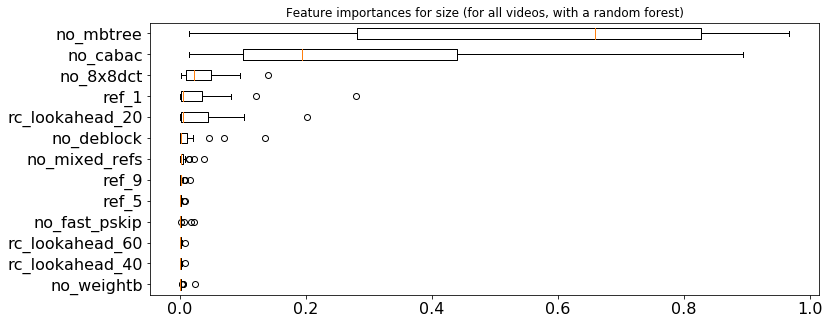

feature,no_mbtree,no_cabac,no_8x8dct,no_deblock,no_weightb,ref_1,rc_lookahead_20,no_mixed_refs,no_fast_pskip,ref_9,ref_5,rc_lookahead_60,rc_lookahead_40
importance_0,0.83,0.17,0.0012,0.0011,0.00097,0.0003,0.00018,0.00016,0.00013,2.7e-05,1.1e-05,8.1e-06,4.2e-06
importance_1,0.92,0.068,0.0091,0.00099,8.7e-07,0.0004,0.00063,0.00099,1.3e-06,0.00017,3.3e-05,5.5e-06,4.4e-06
importance_2,0.28,0.45,0.074,0.014,0.00017,0.044,0.088,0.021,0.00069,0.016,0.0062,0.0026,0.0025
importance_3,0.54,0.38,0.062,0.0077,0.00069,0.0083,0.0018,0.0027,0.00043,0.0015,0.00066,6e-05,4.3e-05
importance_4,0.5,0.39,0.059,0.0085,2.5e-05,0.0021,0.031,0.00055,0.00048,4.1e-05,2.8e-05,0.0003,0.0003
importance_5,0.97,0.014,0.012,4.4e-05,3.6e-05,0.0014,0.0057,6.2e-05,1.8e-06,4.2e-05,4.2e-05,9.4e-05,9.2e-05
importance_6,0.55,0.19,0.048,0.13,0.00011,0.0048,0.043,0.00067,0.021,0.0011,0.00044,0.0018,0.0018
importance_7,0.77,0.1,0.018,0.021,9.2e-06,0.081,0.0042,0.00012,6e-05,0.00086,0.00087,8.1e-05,6.6e-05
importance_8,0.74,0.11,0.043,0.005,0.00083,0.0034,0.068,0.0049,0.018,0.00079,0.00036,0.0015,0.0015
importance_9,0.86,0.11,0.015,1.8e-05,0.0041,0.0091,0.0021,0.0027,1.9e-05,0.00024,0.00024,1.2e-05,8.7e-06


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               
Prediction score: 0.11
Prediction score: 0.02
Prediction score: 0.08
Prediction score: 0.11
Prediction score: 0.07
Prediction score: 0.04
Prediction score: 0.18
Prediction score: 0.11
Prediction score: 0.28
Prediction score: 0.05
Prediction score: 0.05
Prediction score: 0.02
Prediction score: 0.15
Prediction score: 0.00
Prediction score: 0.17
Prediction score: 0.06
Prediction score: 0.04
Prediction score: 0.02
Prediction score: 0.04
Prediction score: 0.04
Prediction score: 0.21
Prediction score: 0.02
Prediction score: 0.11
Prediction score: 0.07
Prediction score: 0.06


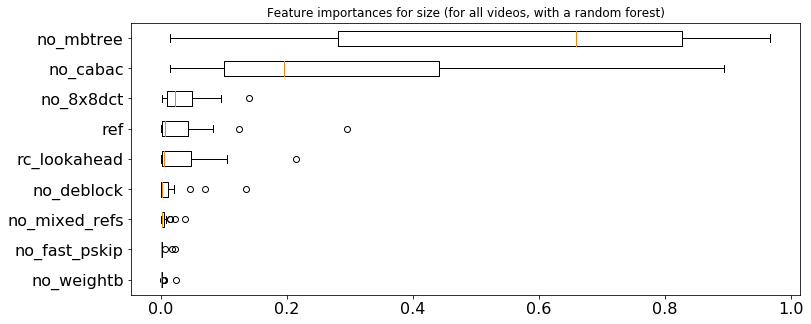

feature,no_mbtree,no_cabac,no_8x8dct,no_deblock,no_weightb,ref,rc_lookahead,no_mixed_refs,no_fast_pskip
importance_0,0.83,0.17,0.0012,0.0011,0.00096,0.00034,0.00019,0.00016,0.00013
importance_1,0.92,0.068,0.0091,0.00099,1e-06,0.0006,0.00063,0.001,1.3e-06
importance_2,0.28,0.45,0.074,0.014,0.00018,0.066,0.093,0.021,0.0007
importance_3,0.54,0.38,0.062,0.0077,0.0007,0.011,0.0019,0.0027,0.00044
importance_4,0.5,0.39,0.06,0.0085,2.6e-05,0.0022,0.031,0.00055,0.00048
importance_5,0.97,0.014,0.012,4.4e-05,3.6e-05,0.0015,0.0058,6.3e-05,1.8e-06
importance_6,0.55,0.19,0.048,0.13,0.00011,0.0063,0.047,0.00072,0.021
importance_7,0.77,0.1,0.018,0.021,9.4e-06,0.083,0.0043,0.00012,6e-05
importance_8,0.74,0.11,0.043,0.005,0.00085,0.0045,0.072,0.0049,0.018
importance_9,0.86,0.11,0.015,1.8e-05,0.0041,0.0095,0.0021,0.0028,2e-05


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


In [13]:
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import accuracy_score, mean_absolute_error
import imgkit
import graphviz 
import seaborn as sns 
from IPython.display import display, HTML

#from sklearn.utils import check_arrays
def mean_relative_error(y_true, y_pred): 
    #y_true, y_pred = check_arrays(y_true, y_pred)

    ## Note: does not handle mix 1d representation
    #if _is_1d(y_true): 
    #    y_true, y_pred = _check_1d_array(y_true, y_pred)

    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    # return mean_absolute_error(y_true, y_pred)

def ftImportancesByVideo(idVideo, dummies=True):     
    
    if (dummies):
        X, y = pd.get_dummies(listeVideo[idVideo][:], columns=["ref", "rc_lookahead"]), listeVideo[idVideo][predDimension][:]
    else:
        X, y = listeVideo[idVideo][:], listeVideo[idVideo][predDimension][:]

    
    X = X.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'elapsedtime', 'size'],axis=1)
    clf = RandomForestRegressor(n_estimators=1000) #GradientBoostingRegressor(n_estimators=1000) # # tree.DecisionTreeRegressor() # 
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)  

    freg = clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    importances = freg.feature_importances_
    indices = np.argsort(importances)[::-1]    
    
    
    ft_imp = pd.DataFrame(columns=["feature", "importance"])
    for f in range(len(indices)):
        ft_imp.loc[f] = (X.columns[indices[f]], importances[indices[f]])
    

    #print("Video %d: " % idVideo)
    # Print the feature ranking
    #print("Feature ranking:")
    #for f in range(len(indices)):
    #    print("%d. feature %s %d (%f)" % (f + 1, X.columns[indices[f]], indices[f], importances[indices[f]]))

    # Plot the feature importances of the forest
    #plt.figure()
    #plt.title("Feature importances for " + predDimension)
    #plt.bar(range(X.shape[1]), importances[indices],color="r", align="center")
    #plt.xticks(range(X.shape[1]), indices)
    #plt.xlim([-1, X.shape[1]])
    #plt.show()
    acc = mean_relative_error (y_test,y_pred)
    print("Prediction score: %.2f" % (acc))
    
    # impurity=False, rounded=True, special_characters=True
    #dot_data = tree.export_graphviz(clf, out_file=None, feature_names=X.columns.values, label='none', impurity=False)
                                       
    #graph = graphviz.Source(dot_data) 
    #graph.render("" + str(idVideo) + "-" + predDimension + "-DT") 
    return ft_imp # importances, indices


def high_max(s):
    '''
    highlight the maximum in a Series green.
    '''
    is_max = s == s.max()
    return ['background-color: green' if v else '' for v in is_max]

def high_min(s):
    '''
    highlight the maximum in a Series red.
    '''
    is_max = s == s.min()
    return ['background-color: red' if v else '' for v in is_max]

def plotGeneralFtImportances(importancePerFt, dummies=False):
   
        
    # sorted boxplot (median)
    meds = importancePerFt.transpose().median().sort_values(ascending=True)   
    sorted_importancePerFt = importancePerFt.transpose()[meds.index].transpose()
    
    plt.figure(figsize=(12, 5))
    plt.title("Feature importances for " + predDimension + " (for all videos, with a random forest)")
    plt.boxplot(sorted_importancePerFt, vert=False)
#    plt.boxplot(importancePerFt, vert=False)
    plt.yticks(range(1, len(importancePerFt) + 1), sorted_importancePerFt.index.values)
    #plt.xticks(range(1, 11), ftNames)
    #plt.yticks(range(1, len(importancePerFtProper) + 1), list(importancePerFtProper.transpose().columns.values))
    if not dummies:
        plt.savefig("featureimportance-" + predDimension + ".pdf")
    else:
        plt.savefig("featureimportance-" + "dummies-" + predDimension + ".pdf")
    plt.show()
    
    html_ft_freq = importancePerFt.transpose().style.set_precision(2).set_caption("feature importances").apply(high_max).apply(high_min).background_gradient(cmap=sns.diverging_palette(5, 250, as_cmap=True), axis=0).render()
    display(HTML(html_ft_freq))
    if not dummies:
        imgkit.from_string(html_ft_freq, 'featurefreq' + predDimension + '.png')
    else:
        imgkit.from_string(html_ft_freq, 'featurefreq' + '-dummies-' + predDimension + '.png')


##### compute importances for all videos
def compute_and_plot_all_ftimportances(dummies):
    importancePerFt = pd.DataFrame(columns=["feature", "importance"])
    for vid in range(len(listeVideo)):
        ft_imp = ftImportancesByVideo(vid, dummies=dummies)
        importancePerFt = pd.merge(importancePerFt, ft_imp, on=["feature"], how="outer", suffixes=['_' + str(vid - 1), '_' + str(vid)])
    # no_asm is always true
    plotGeneralFtImportances(importancePerFt.drop(['importance_-1'], axis=1).set_index('feature').drop(['no_asm'], axis=0), dummies)

compute_and_plot_all_ftimportances(True)
compute_and_plot_all_ftimportances(False)


#importancePerFt.drop(['importance_-1'], axis=1).set_index('feature').drop(['no_asm'], axis=0).transpose().median().sort_values()


,no_8x8dct,no_cabac,no_deblock,no_fast_pskip,no_mbtree,no_mixed_refs,no_weightb,rc_lookahead,ref
0,-1.12588,14.785,1.08893,0.37934,75.773,0.356189,0.965005,0.162757,-0.189842
1,-3.13283,8.80478,1.05588,0.000160577,-117.661,1.03147,0.0059507,0.302756,0.174175
2,-9.30148,30.6469,4.1168,0.787372,21.5716,4.23875,0.196946,4.59427,-0.526398
3,-8.51838,25.3384,2.90015,0.668167,-37.9369,1.45504,-0.307707,0.498674,-0.48021
4,-8.32038,26.0456,3.09066,0.709335,-35.3613,0.671324,0.0806326,2.34903,-0.571973
5,-3.59619,3.80329,0.211193,0.00451175,-181.014,0.214424,0.120204,1.01805,-0.264244
6,-7.03081,16.1559,12.3906,4.87472,37.3624,0.726798,0.120507,3.25563,0.173282
7,-4.46724,10.4711,4.71939,0.188372,63.1894,0.228194,-0.0174743,0.865462,-2.94748
8,-6.80765,11.9736,2.27737,4.54166,57.3663,2.24468,0.645909,3.69931,0.33627
9,-4.12579,11.4245,-0.0477592,0.0136666,-85.2452,1.4514,1.80713,0.540385,-0.90245


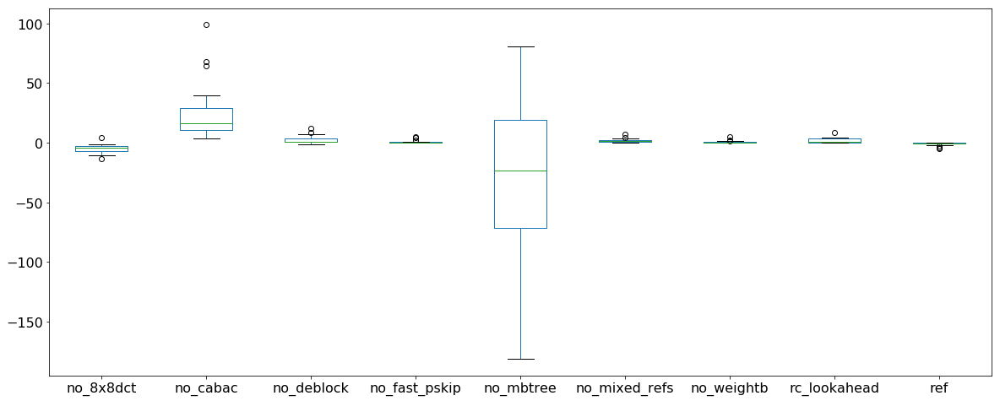

In [14]:
from scipy import stats


allPredictorFts = pd.DataFrame(listeVideo[0]).columns.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'elapsedtime', 'size'])
fttestPaired = pd.DataFrame(columns=range(len(listeVideo)),index=allPredictorFts)



def ftImportancesByVideoPairedTest(idVideo): 
    pVideo = pd.DataFrame(listeVideo[idVideo])
    fttest = pd.DataFrame(columns=["Paired test", "Wilcoxon"])
    ftsMatter = []
    for ft in allPredictorFts: 
        if (len(pVideo[ft].unique()) == 2):  # trick for handling only Boolean predictors 
            positiveFt = pVideo.loc[pVideo[ft] == True]
            negativeFt = pVideo.loc[pVideo[ft] == False]
            ttestFt = stats.ttest_rel(positiveFt[predDimension], negativeFt[predDimension])[0]
            wFt = stats.wilcoxon(positiveFt[predDimension], negativeFt[predDimension])[0]
            fttest.loc[ft] = [ttestFt, wFt]
            ftsMatter.append(ft)
            fttestPaired[idVideo].loc[ft] = ttestFt
        elif (len(pVideo[ft].unique()) > 2):  # TODO: not paired samples, so we have to partition in N-samples and do the test for pair-wise
            unique_values = pVideo[ft].unique()
            for uniq in unique_values:
                positiveFt = pVideo.loc[pVideo[ft] == uniq]
                other_vals = list(unique_values[:])
                other_vals.remove(uniq)
                ttest_others = []
                wFt_others = []
                for o in other_vals:
                    negativeFt = pVideo.loc[pVideo[ft] == o]
                    ttest_others.append(stats.ttest_rel(positiveFt[predDimension], negativeFt[predDimension])[0])
                    wFt_others.append(stats.wilcoxon(positiveFt[predDimension], negativeFt[predDimension])[0])
                ttestFt = np.mean(ttest_others)
                wFt = np.mean(wFt_others)
                fttest.loc[ft] = [ttestFt, wFt]
                ftsMatter.append(ft)
                fttestPaired[idVideo].loc[ft] = ttestFt
        else:
            pass # 1, mandatory
            
            #print ("For feature " + str(ft) + " t-test: " + str(ttestFt) + "\t\t" + "wft: " + str(wFt))
    #display(HTML(fttest.to_html()))
    #fttest["Paired test"].dropna().plot()
    #plt.show()
    
#vid1, vid2 = np.unravel_index(np.argmin(corrPearson,axis=None), np.array(corrPearson).shape)
#ftImportancesByVideoPairedTest(vid1)
#ftImportancesByVideoPairedTest(vid2)


#pearsonWithoutMutualCorr = [[0 for x in range(len(corrPearson))] for y in range(len(corrPearson))]
#for i in range(len(corrPearson)):
#    for j in range(len(corrPearson)):
#        if (i == j):
#            pearsonWithoutMutualCorr[i][j] = np.NaN
#        else:
#            pearsonWithoutMutualCorr[i][j] = corrPearson[i][j]
            
#vid3, vid4 = np.unravel_index(np.nanargmax(pearsonWithoutMutualCorr,axis=None), np.array(pearsonWithoutMutualCorr).shape)


#ftImportancesByVideoPairedTest(vid3)
#ftImportancesByVideoPairedTest(vid4)
for i in range(len(listeVideo)):
    ftImportancesByVideoPairedTest(i)
                                                             
display(HTML(pd.DataFrame(fttestPaired.dropna().transpose()).style.set_caption("paired-test for Boolean features and for all videos").
             apply(high_max)
             .apply(high_min).render()))  
# TODO: non Boolean features like "ref"
fttestPaired.dropna().transpose().plot.box(figsize=(20, 8)) 
plt.show()
#if (predDimension == "size" or predDimension == "elapsedtime"):

# two videos for which mbtree has different effects
np.argmin(fttestPaired.transpose()['no_mbtree'].values), np.argmax(fttestPaired.transpose()['no_mbtree'].values)



# TODO: only for negative values
#### goal here is to apply ttest among inputs (does option transfer in a similar way?) 
# not sure about the method since values are not at the same scale 
# DEPRECATED 
ft_ttest_input = []
for ft in allPredictorFts: 
    tts = np.zeros((len(listeVideo), len(listeVideo)))
    # print (ft)
    ids = 0
    for pVideoSource in listeVideo:
        idt = 0
        for pVideoTarget in listeVideo:
            if (len(pVideoSource[ft].unique()) == 2):  # trick for handling only Boolean predictors 
                positiveFtSource = pVideoSource.loc[pVideoSource[ft] == False]
                positiveFtTarget = pVideoTarget.loc[pVideoTarget[ft] == False]              
                ttestFt = stats.ttest_rel(positiveFtSource[predDimension], positiveFtTarget[predDimension])[0]
                # print(ids, "=>", idt, ":", ttestFt)
                tts[ids][idt] = ttestFt
            elif (len(pVideoSource[ft].unique()) > 2):  # TODO: not paired samples, so we have to partition in N-samples and do the test for pair-wise
                pass
            else:
                pass # 1, mandatory
            idt = idt + 1 
        ids = ids + 1
    ft_ttest_input.append((ft, tts))
    # print("// end")
    
#for ft_ttest in ft_ttest_input:    
#    ft = ft_ttest[0]
#    tts = ft_ttest[1]
#    display(HTML(pd.DataFrame(tts).style.set_caption("ttest among inputs per fts (positive) for " + ft).
#                 apply(high_max)
#                 .apply(high_min).render())) 

    #fttestPaired.transpose()['no_mbtree'].values.argmin # ), np.argmax(fttestPaired.transpose()['no_mbtree'])

In [15]:
#DEPRECATED (heatmaps)
#from string import ascii_letters
#import numpy as np
#import pandas as pd
#import seaborn as sns
#import matplotlib.pyplot as plt
#%matplotlib inline
#sns.set(style="white")
#
# Generate a large random dataset
#rs = np.random.RandomState(33)
#corr = pd.DataFrame(data=corrSpearman)
#
# Generate a mask for the upper triangle
#mask = np.zeros_like(corr, dtype=np.bool)
#mask[np.triu_indices_from(mask)] = True
#
# Set up the matplotlib figure
#f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
#cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
#sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
           # square=True, linewidths=.5, cbar_kws={"shrink": .5})
#plt.show()

In [16]:
def plot_corrBis(corr,size=10):
    '''Function plots a graphical correlation matrix for each pair of columns in the dataframe.

    Input:
        df: pandas DataFrame
        size: vertical and horizontal size of the plot'''

    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns + 1)
    plt.yticks(range(len(corr.columns)), corr.columns + 1)

# DEPRECATED plot_corr(pd.DataFrame(corrPearson))


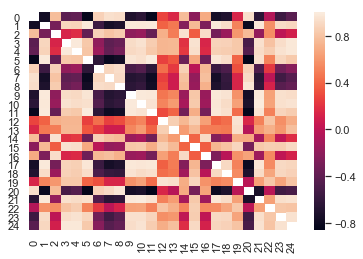

In [17]:
import seaborn as sns
%matplotlib inline

sns.set(style="white")
corr = pd.DataFrame(corrPearson)
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)
plt.show()

Method:	 ward


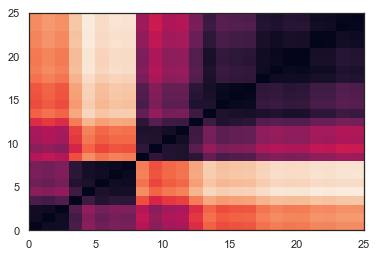

Method:	 single


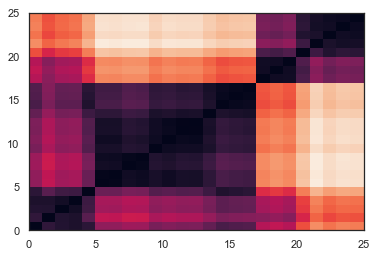

Method:	 average


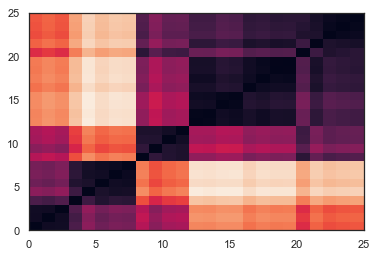

Method:	 complete


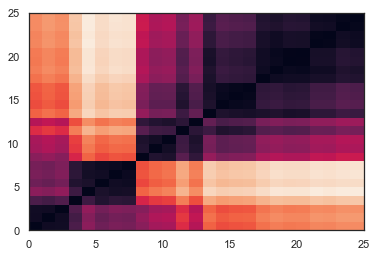

In [18]:
from scipy.spatial.distance import pdist, squareform
from fastcluster import linkage

import numpy as np
from scipy.spatial.distance import pdist, squareform, euclidean
from sklearn import datasets
from fastcluster import linkage


# https://docs.scipy.org/doc/scipy-0.14.0/reference/spatial.distance.html
# https://gmarti.gitlab.io/ml/2017/09/07/how-to-sort-distance-matrix.html
# http://www.sthda.com/english/wiki/correlation-matrix-a-quick-start-guide-to-analyze-format-and-visualize-a-correlation-matrix-using-r-software
# https://stackoverflow.com/questions/29432629/correlation-matrix-using-pandas
# https://en.wikipedia.org/wiki/Correlation_clustering
# https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/

def seriation(Z,N,cur_index):
    '''
        input:
            - Z is a hierarchical tree (dendrogram)
            - N is the number of points given to the clustering process
            - cur_index is the position in the tree for the recursive traversal
        output:
            - order implied by the hierarchical tree Z
            
        seriation computes the order implied by a hierarchical tree (dendrogram)
    '''
    if cur_index < N:
        return [cur_index]
    else:
        left = int(Z[cur_index-N,0])
        right = int(Z[cur_index-N,1])
        return (seriation(Z,N,left) + seriation(Z,N,right))
    
def compute_serial_matrix(dist_mat,method="ward"):
    '''
        input:
            - dist_mat is a distance matrix
            - method = ["ward","single","average","complete"]
        output:
            - seriated_dist is the input dist_mat,
              but with re-ordered rows and columns
              according to the seriation, i.e. the
              order implied by the hierarchical tree
            - res_order is the order implied by
              the hierarhical tree
            - res_linkage is the hierarhical tree (dendrogram)
        
        compute_serial_matrix transforms a distance matrix into 
        a sorted distance matrix according to the order implied 
        by the hierarchical tree (dendrogram)
    '''
    N = len(dist_mat)
    flat_dist_mat = squareform(dist_mat)
    res_linkage = linkage(flat_dist_mat, method=method,preserve_input=True)
    res_order = seriation(res_linkage, N, N + N-2)
    seriated_dist = np.zeros((N,N))
    a,b = np.triu_indices(N,k=1)
    seriated_dist[a,b] = dist_mat[ [res_order[i] for i in a], [res_order[j] for j in b]]
    seriated_dist[b,a] = seriated_dist[a,b]
    
    return seriated_dist, res_order, res_linkage

methods = ["ward","single","average","complete"]

corrPearsonN = pd.DataFrame(corrPearson).fillna(1)
N = len(corrPearson)
for method in methods:
    print("Method:\t",method)
    
    ordered_dist_mat, res_order, res_linkage = compute_serial_matrix(squareform(pdist(corrPearsonN)),method) #hack
    
    plt.pcolormesh(ordered_dist_mat)
    plt.xlim([0,N])
    plt.ylim([0,N])
    plt.show()

-0.8575053983513763
0.9989344514538785


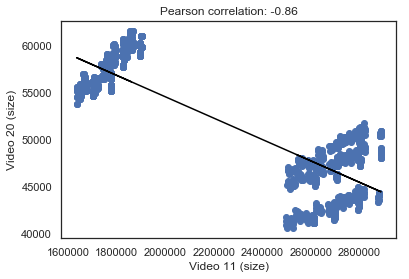

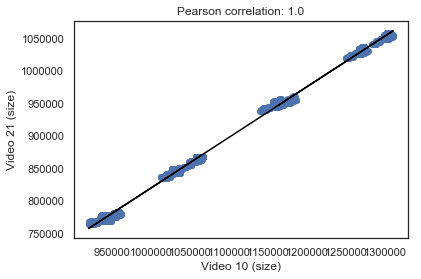

In [19]:
# pearson corr plot
def plotCorrVideo(v1ID, v2ID,plot=True, plotfilename=""):
    video1 = listeVideo[v1ID][:]
    video2 = listeVideo[v2ID][:]
    v1 = video1[predDimension]
    v2 = video2[predDimension]
    pearson_corr_coeff = np.corrcoef(v1,v2)[0,1]
    
    
    mbtree = video1['no_mbtree']
    cabac = video1['no_cabac']
    col = []
    for i in range(len(video1)):
        if mbtree[i]:
            if cabac[i]:
                col.append("blue")
            else:
                col.append("lightblue")    
        else:
            if cabac[i]:
                col.append("red")
            else:
                col.append("orange")
    
    if plot:
        fig = plt.figure()
        #fig.set_size_inches(10, 5)
        # col is not used but could be used to color clusters
        #plt.scatter(v1,v2,color=col)
        plt.scatter(v1,v2)   
        slope, intercept, r_value, p_value, std_err = stats.linregress(v1, v2)
        plt.plot(v1,slope*v1+intercept,color="black")   
        plt.xlabel("Video %d (%s)" % (v1ID, predDimension))
        plt.ylabel("Video %d (%s)" % (v2ID, predDimension))
        plt.title("Pearson correlation: " + str(round(pearson_corr_coeff, 2)))
        if not plotfilename:
            fig.savefig("correlation-" + predDimension + "-v" + str(v1ID) + "v" + str(v2ID) + ".pdf", format="pdf", bbox_inches='tight')
        else:
            fig.savefig(plotfilename + ".pdf", format="pdf", bbox_inches='tight')
 
    return pearson_corr_coeff
# https://docs.scipy.org/doc/numpy/reference/generated/numpy.argmin.html
# seeking where the lowest correlation occurs (btw 2 videos)


# seeking where the highest correlation occurs (btw 2 videos)
# we first exclude 1 correalation (same videos)
 
pearsonWithoutMutualCorr = [[0 for x in range(len(corrPearson))] for y in range(len(corrPearson))]
for i in range(len(corrPearson)):
    for j in range(len(corrPearson)):
        if (i == j):
            pearsonWithoutMutualCorr[i][j] = np.NaN
        else:
            pearsonWithoutMutualCorr[i][j] = corrPearson[i][j]

vid1, vid2 = np.unravel_index(np.nanargmin(pearsonWithoutMutualCorr,axis=None), np.array(pearsonWithoutMutualCorr).shape)
print(plotCorrVideo(vid1, vid2, True, "worst-plot-correlation-" + predDimension))
vid3, vid4 = np.unravel_index(np.nanargmax(pearsonWithoutMutualCorr,axis=None), np.array(pearsonWithoutMutualCorr).shape)
print(plotCorrVideo(vid3, vid4, True, "best-plot-correlation-" + predDimension))
#plotCorrVideo(23, 25)
#high coorelation plotCorrVideo(6, 9, 'elapsedtime')
# plotCorrVideo(2, 14, 'elapsedtime') # high correlation
# plotCorrVideo(2, 5, 'elapsedtime') # medium correlation (worst for execution time)
# plotCorrVideo(22, 16, 'size')
# plotCorrVideo(2, 5, 'elapsedtime')
# stats.spearmanr(listeVideo[2]['elapsedtime'],listeVideo[5]['elapsedtime']).correlation

# stats.spearmanr(listeVideo[16]['size'],listeVideo[22]['size']).correlation
# plotCorrVideo(16, 22, 'size')


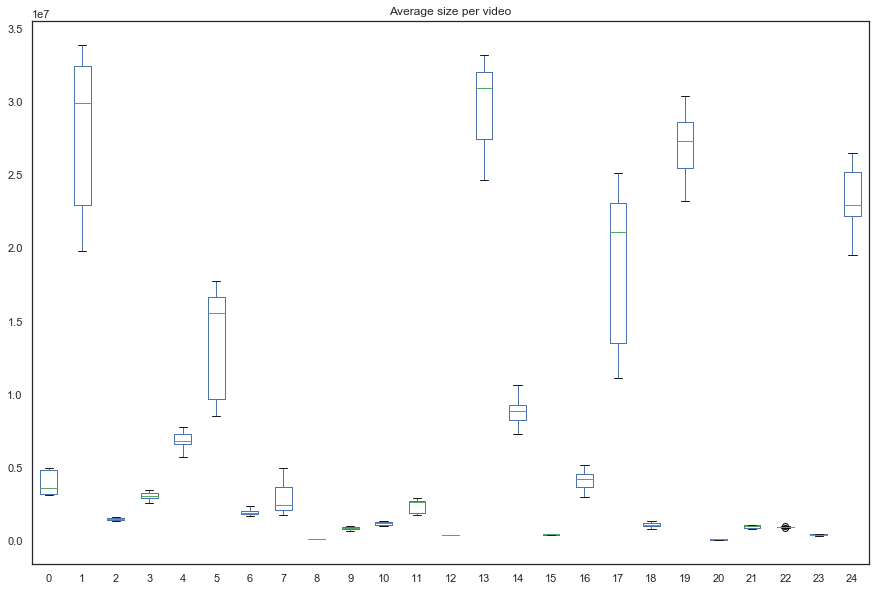

In [20]:
# AVERAGE time or sizes 
# if (predDimension == "elapsedtime"):
sizeVids = len(listeVideo)
meanTimes = [NaN for i in range(sizeVids)]
allPredsMeasure = pd.DataFrame(columns=range(0, sizeVids)) # [NaN for i in range(sizeVids)]
#fig, axs = plt.subplots(ncols=sizeVids,figsize=(16.7, 13.27))
for i in range(sizeVids):
    meanTimes[i] = np.mean(listeVideo[i][predDimension])
    allPredsMeasure.loc[i] = listeVideo[i][predDimension]
   # allPredsMeasure[i].columns.name = str(i)
    #abr = sns.boxplot(data=listeVideo[i][predDimension], ax=axs[i])
#pd.DataFrame(meanTimes).plot()
# pd.DataFrame(allPredsMeasure).plot(legend=False) # for fun
# pd.DataFrame(allPredsMeasure).boxplot()
allPredsMeasure.transpose().plot(kind="box", grid=False,figsize=(15, 10)) # figsize issue: https://github.com/pandas-dev/pandas/issues/11959
plt.title("Average " + predDimension + " per video")
plt.show()



In [21]:
# transfer learning with v1 and v5 
# FIXME: plot
# DEPRECATED and size specific
# (playground)

#import matplotlib.pyplot as plt
#import numpy as np
#from sklearn import datasets, linear_model
# from sklearn.metrics import mean_squared_error, r2_score

#v1ID = 1
#v2ID = 11
#v1 = listeVideo[v1ID]
#v2 = listeVideo[v2ID]

# Split the targets into training/testing sets
#x_train = v1[['size', 'no_mbtree']][0:800] # .reshape(-1,2)
#y_train = v2['size'][0:800]

#x_test = v1[['size', 'no_mbtree']][801:1052] # .reshape(-1,2)
#y_test = v2['size'][801:1052]


#regr = linear_model.LinearRegression()
#regr.fit(x_train, y_train)

# Make predictions using the testing set
#y_pred = regr.predict(x_test)

#y_predict2 = 1.53700227*x_test['size']+ 4.03375832e+05*x_test['no_mbtree'] + regr.intercept_

# The coefficients
#print('Coefficients: \n', regr.coef_)
# The mean squared error
#print("Mean squared error: %.2f"
 #    % mean_squared_error(y_test, y_pred))
# Explained variance score: 1 is perfect prediction
#print('Variance score: %.2f' % r2_score(y_test, y_pred))



# Plot outputs

#plt.figure()
# plt.scatter(x_train['size'], y_train,  color='red')
#plt.scatter(x_test['size'], y_test,  color='black')
#plt.scatter(x_test['size'], y_pred,  color='red')
#plt.plot(x_test['size'], y_predict2, color='blue')

#plt.xticks(())
#plt.yticks(())

#plt.show()
#r2_score(y_test, y_predict2) 


In [22]:
# showing that some videos are equivalent (wrt configurations and correlations) and one of them is "cheaper" (execution time per configuration is less)
# deprecated but good idea 
# x = listeVideo[3]['size']
# y = listeVideo[4]['size']
# np.corrcoef(x, y)[0, 1], mean(listeVideo[3]['elapsedtime']), mean(listeVideo[4]['elapsedtime'])

In [23]:
import numpy as np
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
import seaborn as sns
from scipy import stats
from enum import Enum
from IPython.display import display, HTML


### perfect scenarios for transfer function 
# (we have all source measurements and we do not have to guess them)


class TransferLearningStrategy(Enum):
    REGLIN_POLY1 = 1
    REGLIN_POLY2 = 2
    REGLIN_POLY3 = 3
    RF = 4 
    MULIT_RF = 5
    GB = 6
    

# On essaie de regrouper les vidéos avec les rcarrés
# Rcarré = mesure de la qualité de la régression
# Donc potentiellement du bon transfert par régression linéaire

DEFAULT_TEST_SIZE_RF=0.95 # eg 0.95 is 0.05 for training, more than 50 configurations (3*N)
DEFAULT_TEST_SIZE=DEFAULT_TEST_SIZE_RF # same for linear reg 

def mkDegree(learningStrategy): 
    if (learningStrategy == TransferLearningStrategy.REGLIN_POLY1):
        n_degree = 1
    elif (learningStrategy == TransferLearningStrategy.REGLIN_POLY2):
        n_degree = 2
    elif (learningStrategy == TransferLearningStrategy.REGLIN_POLY3):
        n_degree = 3
    else:
        print("Error, unknown transfer learning strategy " + str(learningStrategy))
        n_degree = -1
    return n_degree

def res_reg(ftsToFocus,i,j,learningStrategy):

    # Split the targets into training/testing sets
    
    videoSource = listeVideo[i].copy()
    videoTarget = listeVideo[j].copy()
    
    videoSource[predDimension + "_target"] = videoTarget[predDimension]
      
    x_train, x_test, y_train, y_test = train_test_split(videoSource[ftsToFocus], 
                                                        videoSource[predDimension + "_target"], 
                                                        test_size=DEFAULT_TEST_SIZE, random_state=None)

    # Apply the model to the training test
    n_degree = mkDegree(learningStrategy)
    
    polynomial_features = PolynomialFeatures(degree=n_degree)
    linear_regression = LinearRegression()
    regr = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    
    # regr = linear_model.LinearRegression()
    regr.fit(x_train, y_train)

    # Make predictions using the testing set
    y_pred = regr.predict(x_test)
    
   
    
    return r2_score(y_test, y_pred) # ,x_test[predDimension], y_test, y_pred))


#### same as above with a random forest
def res_rf(i,j):
    
    videoSource = listeVideo[i].copy()
    videoTarget = listeVideo[j].copy()
    
    videoSource[predDimension + "_target"] = videoTarget[predDimension]

    # Split the targets into training/testing sets
    possibleFts =['no_8x8dct','no_asm','no_cabac',
                           'no_deblock','no_fast_pskip','no_mbtree',
                           'no_mixed_refs','no_weightb','rc_lookahead','ref']
    possibleFts.append(predDimension)
    
        
    x_train, x_test, y_train, y_test = train_test_split(videoSource[possibleFts], 
                                                        videoSource[predDimension + "_target"], 
                                                        test_size=DEFAULT_TEST_SIZE_RF, random_state=None) # random_state=0)

    # Apply the model to the training test
    N_RANDOM_FOREST = 100
    regr = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)
    
    # regr = linear_model.LinearRegression()
    regr.fit(x_train, y_train)

    # Make predictions using the testing set
    y_pred = regr.predict(x_test)
      
    return r2_score(y_test, y_pred) #,x_test[predDimension], y_test, y_pred))

#### same as above with a random forest
def multi_rf(i,j):

    # Split the targets into training/testing sets
    videoSource = listeVideo[i].copy()
    videoTarget = listeVideo[j].copy()
    
    # videoSource[predDimension + "_target"] = videoTarget[predDimension] 
    videoSource[predDimension + "_target"] = videoTarget[predDimension]
    
    possibleFts =['no_8x8dct','no_asm','no_cabac',
                           'no_deblock','no_fast_pskip','no_mbtree',
                           'no_mixed_refs','no_weightb','rc_lookahead','ref']
    possibleFts.append(predDimension)
    #possibleFts.append(predDimension + "_target")
            
    x_train, x_test, y_train, y_test = train_test_split(videoSource[possibleFts], 
                                                        videoSource[[predDimension + "_target", predDimension]], 
                                                        test_size=DEFAULT_TEST_SIZE_RF, random_state=None) # random_state=0)

    # Apply the model to the training test
    N_RANDOM_FOREST = 100
    regr = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)
    
    # regr = linear_model.LinearRegression()
    regr.fit(x_train, y_train)

    # Make predictions using the testing set
    y_pred = regr.predict(x_test)
    r2score = r2_score(y_test, y_pred, multioutput='raw_values')  # 2 values 
    return r2score[0]

### rf = True (random forest and n_degree does not make any sense)
### rf = False (n_degree is for polynomial degree linear reg)
def pred_transf(ftsToFocus,learningStrategy):
    print("\n######\n")
    if (learningStrategy == TransferLearningStrategy.RF):
        print("random forest")
    elif (learningStrategy == TransferLearningStrategy.MULIT_RF):
        print("random forest multi-output")
    else:
        n_degree = mkDegree(learningStrategy)
        print("polynomial degree=" + str(n_degree))
        print("features used=" + str(ftsToFocus))
    
    taille = len(listeVideo)

    rCarreInter = [[0 for x in range(taille)] for y in range(taille)]
   # xtestInter = [[[] for x in range(taille)] for y in range(taille)]
   # ytestInter = [[[] for x in range(taille)] for y in range(taille)]
   # ypredInter = [[[] for x in range(taille)] for y in range(taille)]

    for i in range(taille):
        for j in range(taille):
            if (i == j):
                pass
            else:
                if (learningStrategy == TransferLearningStrategy.RF):    
                    r = res_rf(i,j)
                elif (learningStrategy == TransferLearningStrategy.MULIT_RF):    
                    r = multi_rf(i,j)
                else:
                    r = res_reg(ftsToFocus,i,j,learningStrategy)             
                rCarreInter[i][j] = r
                #xtestInter[i][j] = r[1]
                #ytestInter[i][j] = r[2]
                #ypredInter[i][j] = r[3]


    indicesDim = dendrogram( linkage(rCarreInter, 'average'), leaf_rotation=90.,leaf_font_size=18.,no_plot=True)['leaves']

    rCarre = [[0 for x in range(taille)] for y in range(taille)]
    #xtest = [[[] for x in range(taille)] for y in range(taille)]
    #ytest = [[[] for x in range(taille)] for y in range(taille)]
    #ypred = [[[] for x in range(taille)] for y in range(taille)]
    
    for i in range(taille):
        for j in range(taille):
            if (i == j):
                rCarre[i][j] = NaN 
                pass
            else:
                rCarre[i][j] = rCarreInter[indicesDim[i]][indicesDim[j]]
                #xtest[i][j] = xtestInter[indicesDim[i]][indicesDim[j]]
                #ytest[i][j] = ytestInter[indicesDim[i]][indicesDim[j]]
                #ypred[i][j] = ypredInter[indicesDim[i]][indicesDim[j]]

    plt.subplots(figsize=(10, 10))
    plt.imshow(rCarre,cmap='Reds',interpolation='nearest')
    if (learningStrategy == TransferLearningStrategy.RF):
        plt.title('Random forest (transf)')
    elif (learningStrategy == TransferLearningStrategy.MULIT_RF):
        plt.title('Multi-output random forest (transf)')
    else:
        plt.title('R² reg linears with '+ str(ftsToFocus))
    plt.xticks(range(len(indicesDim)),indicesDim)
    plt.yticks(range(len(indicesDim)), indicesDim)
    plt.xlabel("Video (target)")
    plt.ylabel("Video (source)")
    plt.colorbar()
    plt.show()


    # On regarde ensuite, pour les vidéos qui marchent bien,
    # les graphiques correspondants aux prédictions*valeurs réelles

    ## DEPRECATED 
    def plot_vid_transf(i,j):
        if j == 0:
            plt.ylabel("Video " + str(indicesDim[i]))
        if i == taille-1:
            plt.xlabel("Video " + str(indicesDim[j]))
        plt.scatter(xtest[i][j], ytest[i][j], s = 5, color='black')
        plt.scatter(xtest[i][j], ypred[i][j], s = 5, color='red')
        plt.xticks(())
        plt.yticks(())


    # taille = 10
    # print("We depict ", str(taille)," first videos")
    # all videos
    #plt.subplots(nrows=taille,ncols=taille,figsize=(25, 25))
    #for i in range(taille):
    #    for j in range(taille):
    #        plt.subplot(taille,taille,taille*i+j+1)
    #        plot_vid_reg(i,j)
            
    print("R2 stats")
    print("mean " + str(np.nanmean(rCarre)))
    print("std " + str(np.nanstd(rCarre)))
    print("min " + str(np.nanmin(rCarre)))
    return rCarreInter

allPossibleFts =['no_8x8dct','no_asm','no_cabac',
                           'no_deblock','no_fast_pskip','no_mbtree',
                           'no_mixed_refs','no_weightb','rc_lookahead','ref']

allPossibleFtsTime = allPossibleFts[:]
allPossibleFtsSize = allPossibleFts[:]
allPossibleFtsTime.append('elapsedtime')
allPossibleFtsSize.append('size')
##### TIME CONSUMING
# pre-study (no longer used)
if (False):
    N_REPLICATION=1
    mreAllR2={}
    if (predDimension == "size"):
        #pred_reg(['size'])
        for r in range(0, N_REPLICATION): 
            print("Replication " + str(r))
            mreAllR2 ['Basic lin reg'] = pred_transf(['size'], TransferLearningStrategy.REGLIN_POLY1)
            mreAllR2 ['lin reg (with no_cabac, no_mbtree)'] = pred_transf(['size', 'no_cabac', 'no_mbtree'], TransferLearningStrategy.REGLIN_POLY1) # impressive improvements wrt simple size
            mreAllR2 ['poly 2 (with no_cabac, no_mbtree)'] = pred_transf(['size', 'no_cabac', 'no_mbtree'], TransferLearningStrategy.REGLIN_POLY2) 
            mreAllR2 ['poly 3 (with no_cabac, no_mbtree)'] = pred_transf(['size', 'no_cabac', 'no_mbtree'], TransferLearningStrategy.REGLIN_POLY3)
            mreAllR2 ['lin reg (with no_cabac, no_mbtree, ref)'] = pred_transf(['size', 'no_cabac', 'no_mbtree', 'ref'], TransferLearningStrategy.REGLIN_POLY1) # impressive improvements wrt simple size
            mreAllR2 ['poly 2 (with no_cabac, no_mbtree, ref)'] = pred_transf(['size', 'no_cabac', 'no_mbtree', 'ref'], TransferLearningStrategy.REGLIN_POLY2) 
            mreAllR2 ['poly 3 (with no_cabac, no_mbtree, ref)'] = pred_transf(['size', 'no_cabac', 'no_mbtree', 'ref'], TransferLearningStrategy.REGLIN_POLY3)
            mreAllR2 ['lin reg (with no_cabac, no_mbtree, ref, rc_lookahead)'] = pred_transf(['size', 'no_cabac', 'no_mbtree', 'ref', 'rc_lookahead'], TransferLearningStrategy.REGLIN_POLY1) # impressive improvements wrt simple size
            mreAllR2 ['poly 2 (with no_cabac, no_mbtree, ref, rc_lookahead)'] = pred_transf(['size', 'no_cabac', 'no_mbtree', 'ref', 'rc_lookahead'], TransferLearningStrategy.REGLIN_POLY2) 
            mreAllR2 ['poly 3 (with no_cabac, no_mbtree, ref, rc_lookahead)'] = pred_transf(['size', 'no_cabac', 'no_mbtree', 'ref', 'rc_lookahead'], TransferLearningStrategy.REGLIN_POLY3)
            
            mreAllR2 ['lin reg (all)'] = pred_transf(allPossibleFtsSize, TransferLearningStrategy.REGLIN_POLY1)
            mreAllR2 ['poly 2 (all)'] = pred_transf(allPossibleFtsSize, TransferLearningStrategy.REGLIN_POLY2)
            mreAllR2 ['poly 3 (all)'] = pred_transf(allPossibleFtsSize, TransferLearningStrategy.REGLIN_POLY3)
            
            
            mreAllR2 [str(TransferLearningStrategy.RF)] = pred_transf([], TransferLearningStrategy.RF) # random forest
            mreAllR2 [str(TransferLearningStrategy.MULIT_RF)] = pred_transf([], TransferLearningStrategy.MULIT_RF) # random forest multi-output
            
            
    elif (predDimension == "elapsedtime"):
        for r in range(0, N_REPLICATION): 
            print("Replication " + str(r) + "")
            mreAllR2 [str(TransferLearningStrategy.RF)] = pred_transf([], TransferLearningStrategy.RF) # random forest
            mreAllR2 [str(TransferLearningStrategy.MULIT_RF)] = pred_transf([], TransferLearningStrategy.MULIT_RF) # random forest multi-output
            mreAllR2 ['Basic lin reg'] = pred_transf(['elapsedtime'], TransferLearningStrategy.REGLIN_POLY1) # equivalent to Pearson 
          # future work mreAllR2 ['Basic lin reg + SIZE'] = pred_transf(['elapsedtime', 'size'], TransferLearningStrategy.REGLIN_POLY1) # equivalent to Pearson 
            mreAllR2 ['lin reg (with mbtree+mixedrefs)'] = pred_transf(['elapsedtime', 'no_mbtree', 'no_mixed_refs'], TransferLearningStrategy.REGLIN_POLY1)
            mreAllR2 ['poly 2 lin reg (with mbtree+mixedrefs)'] = pred_transf(['elapsedtime', 'no_mbtree', 'no_mixed_refs'], TransferLearningStrategy.REGLIN_POLY2)
            mreAllR2 ['poly 3 lin reg (with mbtree+mixedrefs)'] = pred_transf(['elapsedtime', 'no_mbtree', 'no_mixed_refs'], TransferLearningStrategy.REGLIN_POLY3)
            mreAllR2 ['lin reg (with mbtree+ref+mixedrefs)'] = pred_transf(['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'], TransferLearningStrategy.REGLIN_POLY1)
            mreAllR2 ['poly 2 (with mbtree+ref+mixedrefs)'] = pred_transf(['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'], TransferLearningStrategy.REGLIN_POLY2)
            mreAllR2 ['poly 3 (with mbtree+ref+mixedrefs)'] = pred_transf(['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'], TransferLearningStrategy.REGLIN_POLY3)    
            mreAllR2 ['lin reg (with mbtree+ref+mixedrefs+look)'] = pred_transf(['elapsedtime', 'no_mbtree', 'ref', 'no_mixed_refs', 'rc_lookahead'], TransferLearningStrategy.REGLIN_POLY1)
            mreAllR2 ['poly 2 (with mbtree+ref+mixedrefs+look)'] = pred_transf(['elapsedtime', 'no_mbtree', 'ref', 'no_mixed_refs', 'rc_lookahead'], TransferLearningStrategy.REGLIN_POLY2)
            mreAllR2 ['poly 3 (with mbtree+ref+mixedrefs+look)'] = pred_transf(['elapsedtime', 'no_mbtree', 'ref', 'no_mixed_refs', 'rc_lookahead'], TransferLearningStrategy.REGLIN_POLY3)
            mreAllR2 ['lin reg (with mbtree+ref+mixedrefs+look+8x8)'] = pred_transf(['elapsedtime', 'no_mbtree', 'ref', 'no_mixed_refs', 'rc_lookahead', 'no_8x8dct'], TransferLearningStrategy.REGLIN_POLY1)
            mreAllR2 ['poly 2 (with mbtree+ref+mixedrefs+look+8x8)'] = pred_transf(['elapsedtime', 'no_mbtree', 'ref', 'no_mixed_refs', 'rc_lookahead', 'no_8x8dct'], TransferLearningStrategy.REGLIN_POLY2)
            mreAllR2 ['poly 3 (with mbtree+ref+mixedrefs+look+8x8)'] = pred_transf(['elapsedtime', 'no_mbtree', 'ref', 'no_mixed_refs', 'rc_lookahead', 'no_8x8dct'], TransferLearningStrategy.REGLIN_POLY3)
            mreAllR2 ['lin reg (all)'] = pred_transf(allPossibleFtsTime, TransferLearningStrategy.REGLIN_POLY1)
            mreAllR2 ['poly 2 (all)'] = pred_transf(allPossibleFtsTime, TransferLearningStrategy.REGLIN_POLY2)
            mreAllR2 ['poly 3 (all)'] = pred_transf(allPossibleFtsTime, TransferLearningStrategy.REGLIN_POLY3)
            
            
           # future work mreAllR2 ['poly 2 (with mbtree+ref+mixedrefs+look+8x8+SIZE)'] = pred_transf(['elapsedtime', 'size', 'no_mbtree', 'ref', 'no_mixed_refs', 'rc_lookahead', 'no_8x8dct'], TransferLearningStrategy.REGLIN_POLY2)    
    else:
        print("Error (unknown dimension)" + predDimension)   
    

# highlight the best "source" video for transfering (a priori of course)
def idealBestVideoSources(mreAllR2):
    mErrors = {} 
    dSummary = pd.DataFrame(columns=range(len(listeVideo)))
    dSummaryBestSources = pd.DataFrame(columns=range(len(listeVideo)))
    for l in mreAllR2.keys():   
        m = mreAllR2[l]    
        pdMeanSample = pd.DataFrame(m)
        bestL = np.nanmax(pdMeanSample,axis=0)
        bestSource = np.nanargmax(pdMeanSample,axis=0)
        meanL = np.nanmean(pdMeanSample,axis=0)
        dSummary.loc['best_' + str(l)] = bestL
        dSummary.loc['mean_' + str(l)] = meanL
        dSummaryBestSources.loc['bestSource' + str(l)] = bestSource
        #[t]
        mMeanDiff = pdMeanSample 
        mMeanDiffHTML = mMeanDiff.style.set_caption(str(l) + "(R2 error )")#.background_gradient(cmap=cm)
        mMeanDiffHTML = mMeanDiffHTML.highlight_max(axis=0)

            #display(HTML(mMeanDiffHTML.render()))
            #display(HTML(pd.DataFrame(meanPerVideoTargetNoTransf).to_html()))
    dHTMLSummary = dSummary.style.set_caption("Summary of learning stratgies (mean/max sources) (R2 error )")# background_gradient(cmap=cm)
    dHTMLSummary = dHTMLSummary.highlight_max(axis=0)
    display(HTML(dSummaryBestSources.style.set_caption("Best video sources per learning stratgies (R2 error )").
                 render()))
    display(HTML(dHTMLSummary.render())) 
    if (predDimension == "elapsedtime"):
        styleSummaryLine = ["o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "o"] #TODO (hardcoded)
    elif (predDimension == "size"):
        styleSummaryLine = ["o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "o", "o"]
    #(regex='^(?!mean)', axis=0)
    # (regex='mean', axis=0)
    dSummary.filter(regex='^(?!mean)', axis=0).transpose().plot(style=styleSummaryLine, figsize=(10, 10),
                                                                    title="Summary of learning stratgies (best sources) (R2 error )")          

#mreAllR2
##### TIME CONSUMING
# pre-study (no longer used)
#idealBestVideoSources(mreAllR2)                                                                 



In [24]:
# %%capture
# transfer learning 
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


## Domain knowledge for transfer function
# seems deprecated 
def mkFeatures2Focus(predDimension):
    possibleColumns=['idVideo','no_8x8dct','no_asm','no_cabac',
                           'no_deblock','no_fast_pskip','no_mbtree',
                           'no_mixed_refs','no_weightb','rc_lookahead','ref']
    ftToFocus = []
    if predDimension == 'size':
        ftToFocus = ['no_mbtree', 'no_cabac'] # []
    elif predDimension == 'elapsedtime':
        ftToFocus = [] # ['ref', 'no_mixed_refs', 'no_mbtree'] # []
    else:
        print("Error: predDimension is either size or elapsedtime")
    return ftToFocus

def evalPrediction(y_gtruth, y_pred):
     # The mean squared error
    mse = mean_squared_error(y_gtruth, y_pred)
   # print("Mean squared error: %.2f" % mse)
    # Explained variance score: 1 is perfect prediction
    r2 = r2_score(y_gtruth, y_pred)
   # print('Variance score: %.2f' % r2)   
    mre = mean_relative_error(y_gtruth, y_pred)
    mae = mean_absolute_error(y_gtruth, y_pred)
   # print('Relative score: %.2f' % mre)
    return mse, r2, mre, mae

# predDimension: either size or elapsedtime 
# features to focus (for linear regression says)
def transferReg(v1ID, v2ID, perc, ftsToFocus, n_degree=2):
    vSource = listeVideo[v1ID][:]
    vTarget = listeVideo[v2ID][:]
    
    N_RANDOM_FOREST = 100
    
    nTotal = len(vSource[predDimension]) # length is equal between vSource and vTarget (1052 in our experiments)
    tres = round(perc * nTotal)
    
    ftsToRemove = ['configurationID', 'size', 'elapsedtime', 'systemtime', 'usertime']
    # ftsToRemove.remove(predDimension)
    
    ######### pure learnning over target (it's the traditional way, without transfer)  ##########  
    clfTarget = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)  
    
    # train sample 
    x_target_train = vTarget[0:tres] # Cs
    x_effective_target_train = x_target_train.drop(ftsToRemove, axis=1) # normally we learn over the full parameters but we can try to target specifically ['no_mbtree', 'no_cabac']
    # x_effective_target_train = x_effective_target_train[['no_mbtree', 'no_cabac']] 
    y_target_train = vTarget[predDimension][0:tres] 
    clfTarget.fit(x_effective_target_train, y_target_train) 
    
    # test sample for evaluating 
    x_target_test = vTarget[tres+1:nTotal]
    x_effective_target_test = x_target_test.drop(ftsToRemove, axis=1) # normally we learn over the full parameters but we can try to target specifically ['no_mbtree', 'no_cabac']
    # x_effective_source_test = x_effective_source_test[['no_mbtree', 'no_cabac']]
    y_target_test = vTarget[predDimension][tres+1:nTotal]
    
   # print("** Evaluation of learning model (for the TARGET, without transfer)**")
    y_target_pred = clfTarget.predict(x_effective_target_test)
    mseMLTarget, r2MLTarget, mreMLTarget, maeMLTarget = evalPrediction(y_target_test, y_target_pred)
   
    
    #### Now let's try ML + Transfer
    
    ######### first, we need a learning model for predicting size (source), hopefully very accurate ##########  
    clf = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)    
    x_source_train = vSource[0:tres] # Cs
    x_effective_source_train = x_source_train.drop(ftsToRemove, axis=1) # normally we learn over the full parameters but we can try to target specifically ['no_mbtree', 'no_cabac']
    # x_effective_source_train = x_effective_source_train[['no_mbtree', 'no_cabac']] 
    y_source_train = vSource[predDimension][0:tres] 
    clf.fit(x_effective_source_train, y_source_train) # RT
    
    # intermediate evaluation of learning model
    #x_source_test = vSource[tres+1:nTotal]
    #x_effective_source_test = x_source_test.drop(ftsToRemove, axis=1) # normally we learn over the full parameters but we can try to target specifically ['no_mbtree', 'no_cabac']
   # x_effective_source_test = x_effective_source_test[['no_mbtree', 'no_cabac']]
    #y_source_test = vSource[predDimension][tres+1:nTotal]
    
    #y_source_pred = clf.predict(x_effective_source_test)
  #  print("** Intermediate evaluation of learning model for the SOURCE hopefully very accurate **")
 #   mseMLSource, r2MLSource, mreMLSource = evalPrediction(y_source_test, y_source_pred)    

    ####### second, let's learn the transfer function between source and target ############
    # WITH linear function over ftsToFocus
    x_transfer_train = x_source_train[ftsToFocus] # source [['size', 'no_mbtree', 'no_cabac']]
    y_transfer_train = vTarget[predDimension][0:tres] # Cboth (target)          
    polynomial_features = PolynomialFeatures(degree=n_degree)
    linear_regression = LinearRegression()
    regr = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    regr.fit(x_transfer_train, y_transfer_train)

 
        
    # (alternate) WITH another learning-based transfer function  
    ftsMLToRemove = ftsToRemove[:]
    ftsMLToRemove.remove(predDimension) # we cannot include predDimension column
    x_transferML_train = x_source_train.drop(ftsMLToRemove, axis=1)  
    y_transferML_train = vTarget[predDimension][0:tres] # Cboth (target)
    clfTransML = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)  # linear_model.LinearRegression() # linear_model.BayesianRidge() # linear_model.LinearRegression() # linear_model.Ridge (alpha = .5) 
    clfTransML.fit(x_transferML_train, y_transferML_train) 
    
  
    
           
    
    ########### third, transfer + learning  
#    ftsToRemove.remove(predDimension)

 #### Alternate technique: regression over the ***learned*** values (not over the original, raw values)
    x_test = vSource[tres+1:nTotal] # vSource[tres+1:nTotal]    
    x_effective_test = x_test.drop(ftsToRemove, axis=1)
    y_test = y_target_test[:] # vTarget[predDimension][tres+1:nTotal] #  #     
      
    source_prediction_size = clf.predict(x_effective_test) # vSource[predDimension][tres+1:nTotal]  # 
    #x_test =  x_test [['no_mbtree', 'no_cabac']]
    # print("Unique prediction values %d" % (len(np.unique(target_prediction_size))))
    # add predicted size to x_test
    x_augmented_test = x_effective_test.assign(predDimension=source_prediction_size) 
    x_augmented_test = x_augmented_test.rename(columns={'predDimension': predDimension}) # WEIRD (TODO)
    # Make predictions using the testing set   
    
    y_pred = regr.predict(x_augmented_test[ftsToFocus])
    
    mseMLT, r2MLT, mreMLT, maeML = evalPrediction(y_test, y_pred)
    
    
    
   #### Traditional technique: regression over the original/raw values (not over the *learned* ones)
    x_transfer_train2 = x_source_train[ftsToFocus] # source [['size', 'no_mbtree', 'no_cabac']]
    #print(x_transfer_train2)
    # replacement of a column 
    # TODO x_transfer_train2[predDimension] = clf.predict(x_effective_source_train)
    #x_transfer_train2 = x_transfer_train2.drop(predDimension, axis=1)
    #x_transfer_train2 =    x_transfer_train2.assign(predDimension=clf.predict(x_effective_source_train))
    #x_transfer_train2 = x_transfer_train2.rename(columns={'predDimension': predDimension}) # WEIRD (TODO)
    #print(x_transfer_train2)
    y_transfer_train2 = vTarget[predDimension][0:tres] 
    #regr2 = linear_model.LinearRegression() # linear_model.BayesianRidge() # linear_model.LinearRegression() # linear_model.Ridge (alpha = .5) 
    #regr2.fit(x_transfer_train2, y_transfer_train2)   
    #y_pred2 = regr2.predict(x_augmented_test[ftsToFocus])
    polynomial_features = PolynomialFeatures(degree=n_degree)
    linear_regression = LinearRegression()
    regr2 = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    regr2.fit(x_transfer_train2, y_transfer_train2)
    y_pred2 = regr2.predict(x_augmented_test[ftsToFocus])
    

   
    
   # x_test_MLTrans = vTarget[tres+1:nTotal]#.values.reshape(-1,1)
   # x_effective_test_MLTrans = x_test_MLTrans.drop(ftsToRemove, axis=1) 
   # y_test_MLTrans = y_target_test[:] #vTarget[predDimension][tres+1:nTotal]#.values.reshape(-1,1)
   # Make predictions using the testing set
   # target_predictionML_size = clf.predict(x_effective_test_MLTrans)
    
   # x_augmentedML_test = x_effective_test_MLTrans.assign(predDimension=target_predictionML_size) 
   # x_augmentedML_test = x_augmentedML_test.rename(columns={'predDimension': predDimension}) # WEIRD (TODO)

    y_pred_MLTrans = clfTransML.predict(x_augmented_test)
    mseMLMLTrans, r2MLMLTrans, mreMLMLTrans, maeMLMLTrans = evalPrediction(y_test, y_pred_MLTrans)

    return (mseMLTarget, r2MLTarget, mreMLTarget), (mseMLT, r2MLT, mreMLT), (mseMLMLTrans, r2MLMLTrans, mreMLMLTrans)
   
## Deprecated 
### the idea was to use linear regression for learning over the same video
def linearReg(v1ID, perc):
    v1 = listeVideo[v1ID][:]    
    nTotal = len(v1[predDimension])
    tres = round(perc * nTotal)   


    # Split the targets into training/testing sets
    x_train = v1[['no_mbtree', 'no_cabac']][0:tres] #.values.reshape(-1,1)
    y_train = v1[predDimension][0:tres]#.values.reshape(-1,1)
    
    x_test = v1[['no_mbtree', 'no_cabac']][tres+1:nTotal]#.values.reshape(-1,1)
    y_test = v1[predDimension][tres+1:nTotal]#.values.reshape(-1,1)
    
    #print(np.unique(y_test))

    regr = linear_model.LinearRegression()
    regr.fit(x_train, y_train)

    # Make predictions using the testing set
    y_pred = regr.predict(x_test)

    # The coefficients
    print('Coefficients: \n', regr.coef_)
    mreReg, r2Reg, mseReg, maeReg = evalPrediction(y_test, y_pred)
    return (mreReg, r2Reg, mseReg)



## deprecated? seems we can use linearRegPolynomialBetweenVideos instead
def linearRegBetweenVideos(v1Source, v2Target, perc, ftsToFocus):
    vSource = listeVideo[v1Source][:]  
    vTarget = listeVideo[v2Target][:]  
    nTotal = len(vSource[predDimension])
    tres = round(perc * nTotal)   
    
    #ftsToFocus = mkFeatures2Focus(predDimension)
    #ftsToFocus.append(predDimension)
    
      
   

    # Split the targets into training/testing sets
    x_train = vSource[ftsToFocus][0:tres] #.values.reshape(-1,1)
    y_train = vTarget[predDimension][0:tres]#.values.reshape(-1,1)
    
    x_test = vSource[ftsToFocus][tres+1:nTotal]#.values.reshape(-1,1)
    y_test = vTarget[predDimension][tres+1:nTotal]#.values.reshape(-1,1)


    regr = linear_model.LinearRegression()
    regr.fit(x_train, y_train)

    y_pred = regr.predict(x_test)

    mseReg, r2Reg, mreReg, maeReg = evalPrediction(y_test, y_pred)
    return (mseReg, r2Reg, mreReg)




#### ideal case: you have the whole measurements for source 
def linearRegPolynomialBetweenVideos(v1Source, v2Target, perc, ftsToFocus, n_degree=1):
    vSource = listeVideo[v1Source][:]  
    vTarget = listeVideo[v2Target][:]  
    nTotal = len(vSource[predDimension])
    tres = round(perc * nTotal)
    
    #Vx, Vy = vSource, vTarget[predDimension] # listeVideo[idVideo1], listeVideo[idVideo2][predDimensionExample]
    # Vx = Vx.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size'], axis=1)
    # Vx = Vx.assign(elapsedtime=listeVideo[idVideo2][predDimensionExample])

    #x_train, x_test, y_train, y_test = train_test_split(Vx, Vy, test_size=perc, random_state=0) 
    # print(tres)
    # Split the targets into training/testing sets
    
    if (predDimension == 'size'):
        vSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size'], axis=1)
    elif (predDimension == 'elapsedtime'):
         vSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'elapsedtime'], axis=1)
    else:
        print("Error in pred dim")
        
    x_train, x_test, y_train, y_test = train_test_split(vSource, vTarget[predDimension], test_size=perc, random_state=0)

    
 #   x_train = vSource[ftsToFocus][0:tres] #.values.reshape(-1,1)
 #   y_train = vTarget[predDimension][0:tres]#.values.reshape(-1,1)
    
 #   x_test = vSource[ftsToFocus][tres+1:nTotal]#.values.reshape(-1,1)
 #   y_test = vTarget[predDimension][tres+1:nTotal]#.values.reshape(-1,1)
    
    polynomial_features = PolynomialFeatures(degree=n_degree)
    linear_regression = LinearRegression()
    pipeline = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])

    pipeline.fit(x_train[ftsToFocus], y_train)

    y_pred = pipeline.predict(x_test[ftsToFocus]) 
 
    mseReg, r2Reg, mreReg, maeReg = evalPrediction(y_test, y_pred)
    return (mseReg, r2Reg, mreReg)



# transferReg(1, 5, (N / 1152)) # great achievement!

N = 16

# deprecated 
def computeTransferAndReg(vid1, vid2, n, ftsToFocus):
    # print("Video %d vs %d" % (vid1,vid2));
    cor12 = plotCorrVideo(vid1,vid2,False)
    #print("Correlation %.2f" % (cor12))
   # print("Transfer learning...")
    mreL, mreT, mreMLT = transferReg(vid1, vid2, (n / 1152), ftsToFocus) 
    #print("Simple regression linear model (to check if it is that simple) for source video %d" % (vid1))
    mre1 = linearRegBetweenVideos(vid1, vid2, (n / 1152), ftsToFocus)
    #print("Simple regression linear model (to check if it is that simple) for target video %d" % (vid2))
    mre2 = linearRegBetweenVideos(vid2, vid1, (n / 1152), ftsToFocus)
    return mreL, mreT, mreMLT, mre1, mre2
    # TODO: tree learning over vid1
    
    


# print("Correlation %.2f" % (plotCorrVideo(1,2)))
# transferReg(1, 2, (N / 1152)) # great achievement!

#linearReg(5, (N / 1152))
#linearReg(1, (N / 1152))
#linearReg(3, (N / 1152))
#transferReg(1, 3, (N / 1152))


# linearRegPolynomialBetweenVideos(17, 32, 3*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac']), linearRegBetweenVideos(17, 32, 3*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac'])
#linearRegPolynomialBetweenVideos(17, 18, 3*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac']), linearRegBetweenVideos(17, 18, 3*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac'])
#linearRegPolynomialBetweenVideos(18, 17, 3*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac']), linearRegBetweenVideos(18, 17, 3*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac'])

#linearRegPolynomialBetweenVideos(18, 17, 3*N / 1052, 'elapsedtime', ['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree']), linearRegBetweenVideos(18, 17, 3*N / 1052, 'elapsedtime', ['ref', 'no_mixed_refs', 'no_mbtree'])

# transferReg(1, 5, (5*N / 1152)) # 
## warning works because of size predDimension 
 
if (predDimension == "size"):
    trRes = transferReg(2, 12, (3*N / 1152), ['size', 'ref', 'no_mixed_refs', 'no_mbtree']) # great achievement!
## warning works because of elapsedtime predDimension 
if (predDimension == "elapsedtime"):
    trRes = transferReg(2, 12, (3*N / 1152), ['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'])
    
# trRes
#computeTransferAndReg(31, 31, 5*N, 'elapsedtime', ['elapsedtime']) # , 'ref', 'no_mixed_refs', 'no_mbtree']) 
# computeTransferAndReg(31, 1, N, 'size', ['size']) # , 'ref', 'no_mixed_refs', 'no_mbtree']) 
#computeTransferAndReg(1, 1, 2*N, 'elapsedtime', ['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'])
# linearRegBetweenVideos(2, 23, 2*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac'])

#plotCorrVideo(23, 2, 'size', True), linearRegBetweenVideos(23, 2, 10*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac'])
#plotCorrVideo(23, 2, 'elapsedtime', True), linearRegBetweenVideos(23, 2, 10*N / 1052, 'elapsedtime', ['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'])

#plotCorrVideo(23, 2, 'size', True), linearRegBetweenVideos(23, 2, 10*N / 1052, 'size', ['size', 'no_mbtree', 'no_cabac'])
# plotCorrVideo(31, 29, 'elapsedtime', True), linearRegBetweenVideos(31, 29, 2*N / 1052, 'elapsedtime', ['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'])
#listeVideo[4]['elapsedtime'], listeVideo[1]['elapsedtime']

# plotCorrVideo(31, 29, 'elapsedtime', True), transferReg(31, 29, 1*N / 1052, 'elapsedtime', ['elapsedtime', 'ref', 'no_mixed_refs', 'no_mbtree'], 2)
#


In [25]:
class LearningStrategy(Enum):
    REG = 0 # with fts focus
    REG_POLY = 1 #polynomial order 2
    RF = 2 
    NO_TRANSF = 3
    MULTI_RF = 4
    TRANSF_MO = 5
    REG_BASIC = 6 # without fts focus
    REG_POLY3 = 7 #polynomial order 3

class LearningError(Enum):
    MSE = 0,
    R2 = 1,
    MRE = 2, 
    MAE = 3
    

Nf = [1, 2, 3, 4, 5, 7, 10, 15] 
ntotalconfig = 1152

In [26]:
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import display, HTML
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor

    
def mkTargetDimensionName(dimensionName):
    return dimensionName + "_target"

def removeFtsVideo(vSource):
     return vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime', mkTargetDimensionName(predDimension)], axis=1)




In [27]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split 
import numpy as np



In [28]:

def ftfocus_train_test_split_datavideo(vSourceScoped, nperc, ftFocus):
    
    vSource = vSourceScoped.copy()
    for ft in ftFocus:
        vSourceScoped = vSourceScoped[vSourceScoped[ft] == True]
    
    ltotalconfig =  ntotalconfig / (len(ftFocus)*2) 
    
    lfeature = ntotalconfig - (nperc * ntotalconfig)
    if (lfeature > ltotalconfig): # obviously we could manage this case but for this specific case study it is OK
        raise ArithmeticError('subsampling over focused features is too low: ' + str(lfeature) + " > " + str(ltotalconfig))
    lperc = ((ltotalconfig - lfeature) / ltotalconfig)
    x_train_scoped, x_test_fake, y_train_scoped, y_test_fake = train_test_split(vSourceScoped, vSourceScoped[predDimension], test_size=lperc, random_state=0)

    
    x_test_rest = pd.concat([vSource, x_train_scoped, x_train_scoped]).drop_duplicates(keep=False)

    y_test_rest = x_test_rest[predDimension]
    
    # cleaning     
    x_test_rest = x_test_rest.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'elapsedtime', 'size'], axis=1)
    x_train_scoped = x_train_scoped.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'elapsedtime', 'size'], axis=1)
   
    return x_train_scoped, x_test_rest, y_train_scoped, y_test_rest
    

def ftfocus_train_test_split(v1Source, nperc, ftFocus):
    #return ftfocus_train_test_split2(v1Source, nperc, ftFocus)
    vSource = listeVideo[v1Source]  
       
    if (len(ftFocus) == 0):
        raise RuntimeError("Please specify features to focus for subsampling (here empty)")
    
    vSourceScoped = vSource.copy()
    return ftfocus_train_test_split_datavideo(vSourceScoped, nperc, ftFocus)

if (predDimension == "elapsedtime"):
    ftFocus = ['no_mbtree'] #['no_weightb', 'no_deblock'] # 'no_weightb' is the ideal choice, see experiments and other cell
elif(predDimension == "size"):
    ftFocus = ['no_weightb', 'no_fast_pskip']
else:
    ftFocus = []
    raise RuntimeError("Impossible case")

nfeature = 32
nperc = ((ntotalconfig - nfeature) / ntotalconfig)  # normal
vid_test = 0 # does not matter

# training set size should be equals to nfeature
train_set = ftfocus_train_test_split(vid_test, nperc, ftFocus)[0]
assert(len(train_set) == nfeature)
# each column feature focus should have the same unique value (True or False)
assert(all([ft == 1 for ft in train_set[ftFocus].nunique()]))

test_set = ftfocus_train_test_split(vid_test, nperc, ftFocus)[1]
assert(all([ft == 2 for ft in test_set[ftFocus].nunique()]))
assert(len(test_set) == (ntotalconfig - nfeature))

train_set[:5]

,no_8x8dct,no_asm,no_cabac,no_deblock,no_fast_pskip,no_mbtree,no_mixed_refs,no_weightb,rc_lookahead,ref
546,False,False,False,False,True,False,False,True,20,1
759,True,False,True,False,True,True,True,True,40,9
1047,False,False,True,False,True,False,True,True,20,5
631,False,False,True,True,True,True,False,True,60,5
1072,True,False,True,False,True,True,False,True,60,9


In [29]:
#multi_rf(1, 16)[0], multi_rf(16, 1)[0]

Video0


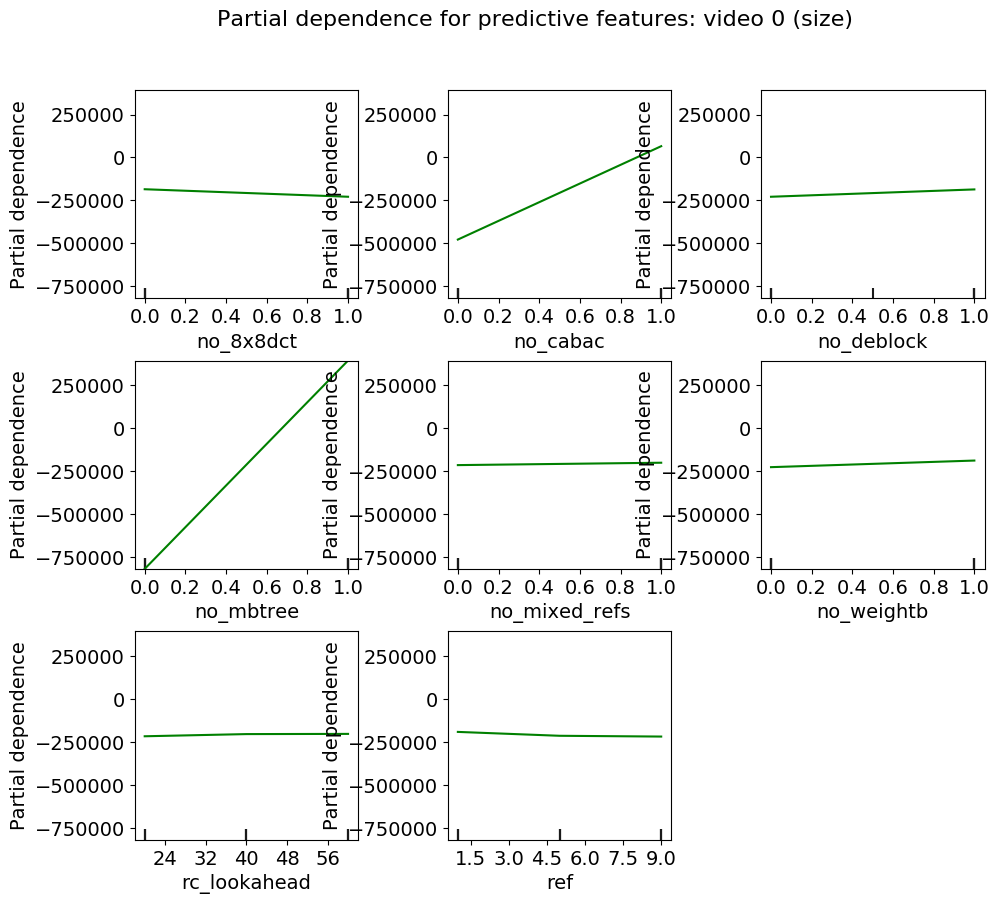

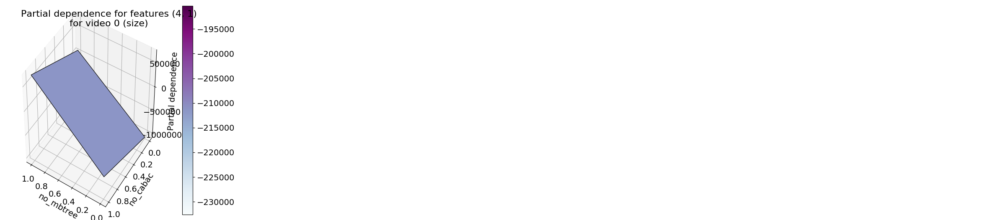

                    x       y       x/y
no_8x8dct     -185509 -229314  0.808977
no_cabac      -478836   65380  -7.32388
no_deblock    -229312 -186585     1.229
no_fast_pskip -214968 -200710   1.07104
no_mbtree     -819715  394468  -2.07802
no_mixed_refs -214876 -200984   1.06912
no_weightb    -226831 -188356   1.20427
rc_lookahead  -216780 -204105    1.0621
ref           -191348 -213948   0.89437
Video1


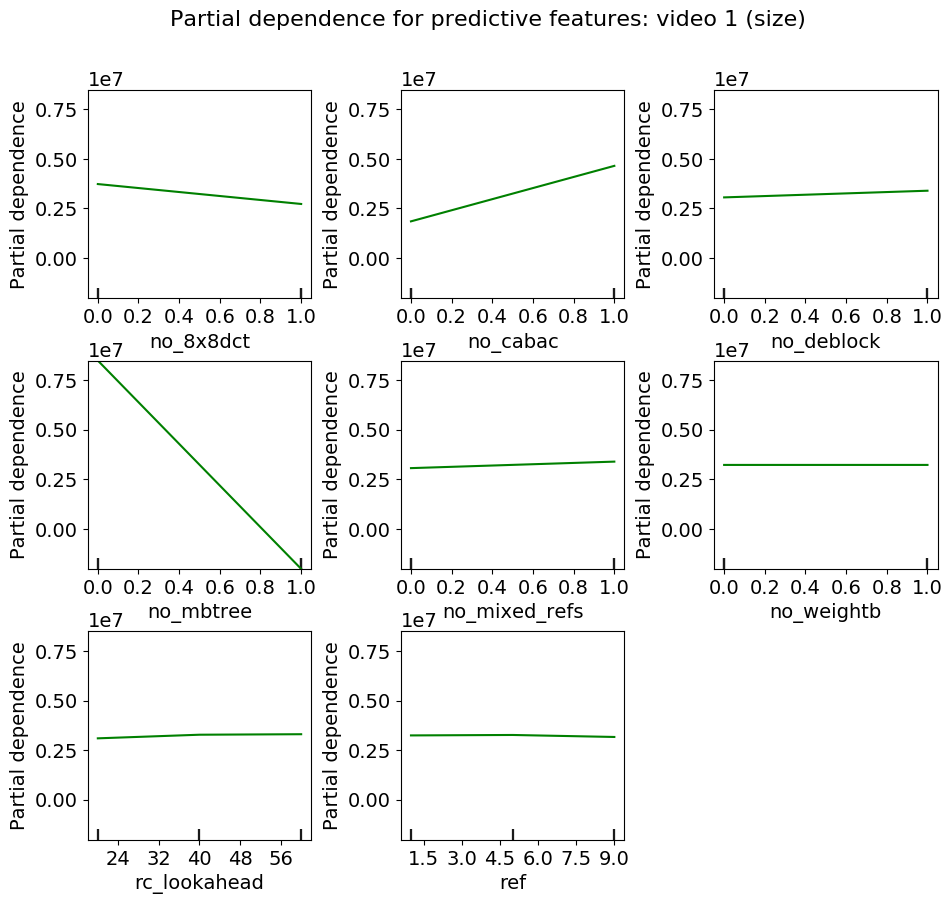

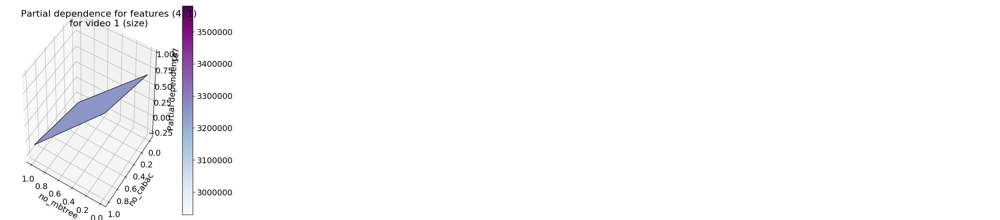

                         x            y       x/y
no_8x8dct      3.72802e+06  2.72258e+06    1.3693
no_cabac       1.84472e+06  4.64704e+06  0.396966
no_deblock     3.05492e+06  3.39185e+06  0.900664
no_fast_pskip  3.22185e+06  3.22133e+06   1.00016
no_mbtree      8.49134e+06 -2.02803e+06  -4.18699
no_mixed_refs  3.05992e+06  3.38796e+06  0.903174
no_weightb      3.2214e+06  3.22175e+06  0.999892
rc_lookahead   3.09144e+06  3.27402e+06  0.944232
ref            3.23875e+06  3.26113e+06  0.993137
Video2


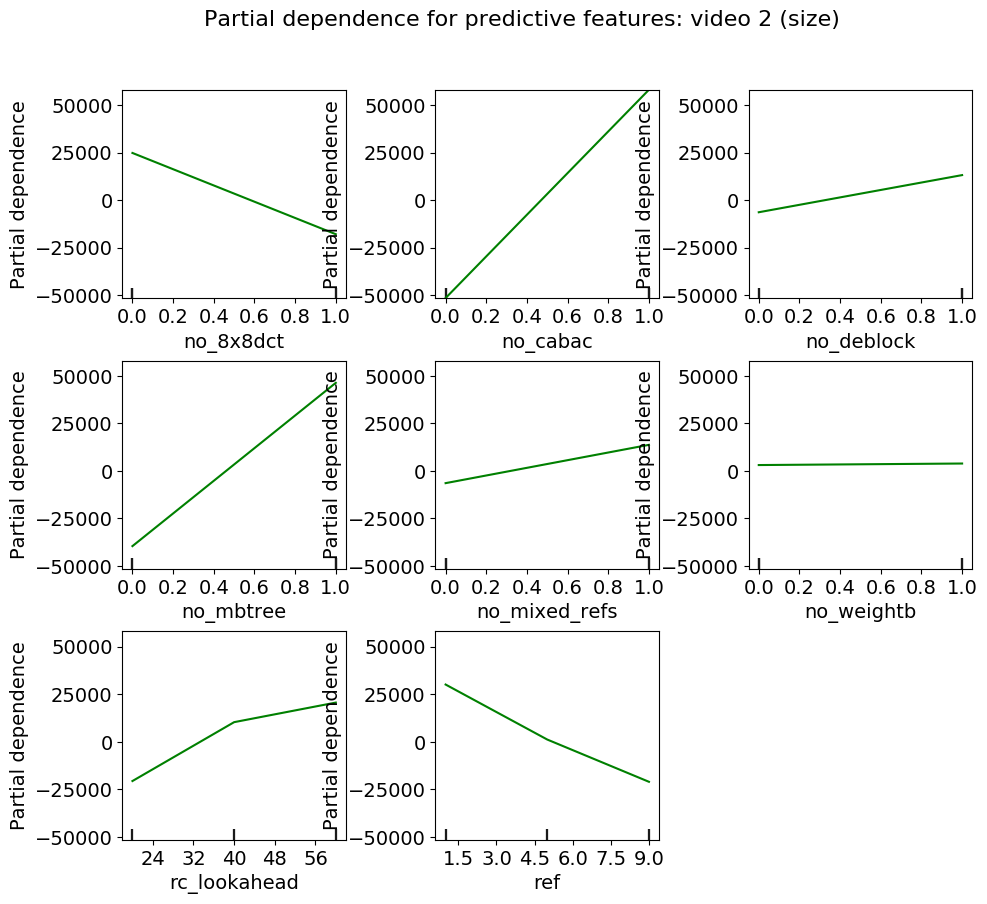

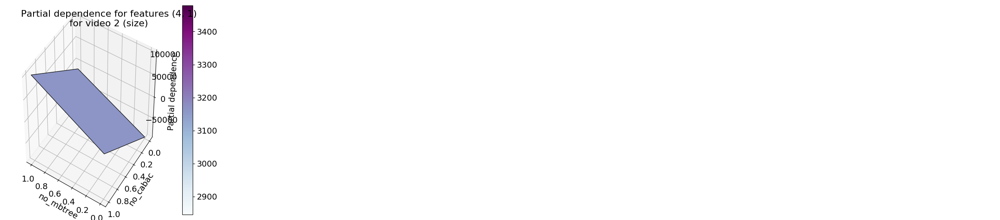

                     x        y       x/y
no_8x8dct      24769.8 -17939.5  -1.38074
no_cabac      -51502.4  58010.6 -0.887811
no_deblock    -6398.62  13129.9 -0.487331
no_fast_pskip  1755.99  5241.48  0.335019
no_mbtree     -39528.4  46302.5 -0.853699
no_mixed_refs  -6430.2  13703.7 -0.469232
no_weightb     3080.63  3886.23  0.792704
rc_lookahead  -20649.9    10295  -2.00582
ref            30075.6  1152.24   26.1019
Video3


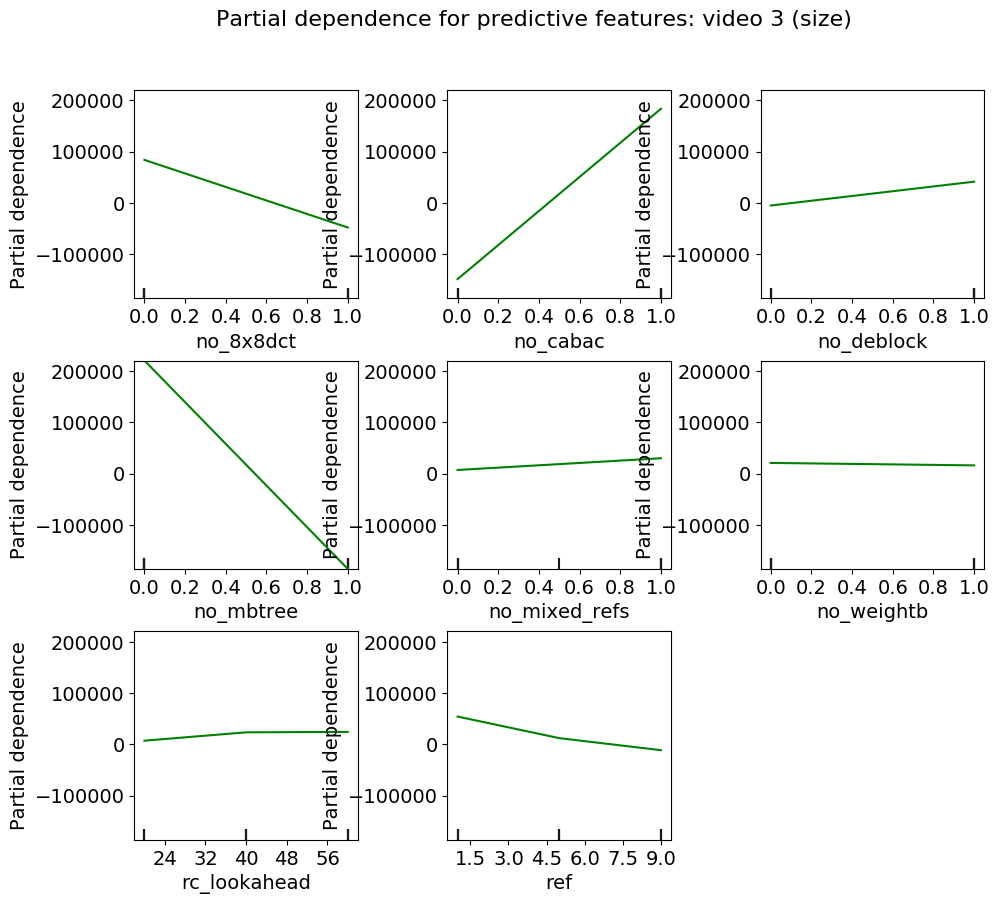

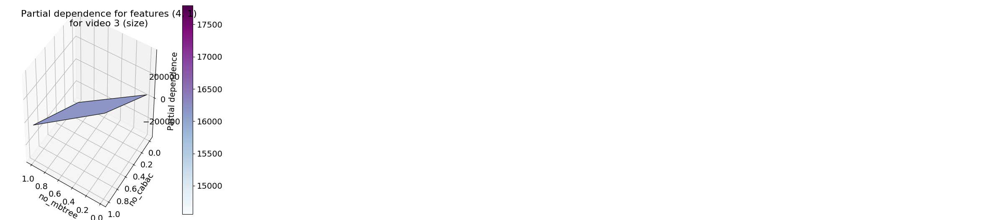

                     x        y       x/y
no_8x8dct      83848.9 -48264.9  -1.73726
no_cabac       -149068   183792  -0.81107
no_deblock    -5272.54  41307.7 -0.127641
no_fast_pskip  13531.2  23716.8  0.570531
no_mbtree       221030  -186135  -1.18747
no_mixed_refs   7213.4  30069.6   0.23989
no_weightb     20970.5  16161.9   1.29753
rc_lookahead   7439.84  23760.7  0.313115
ref            54594.9  12385.1   4.40811
Video4


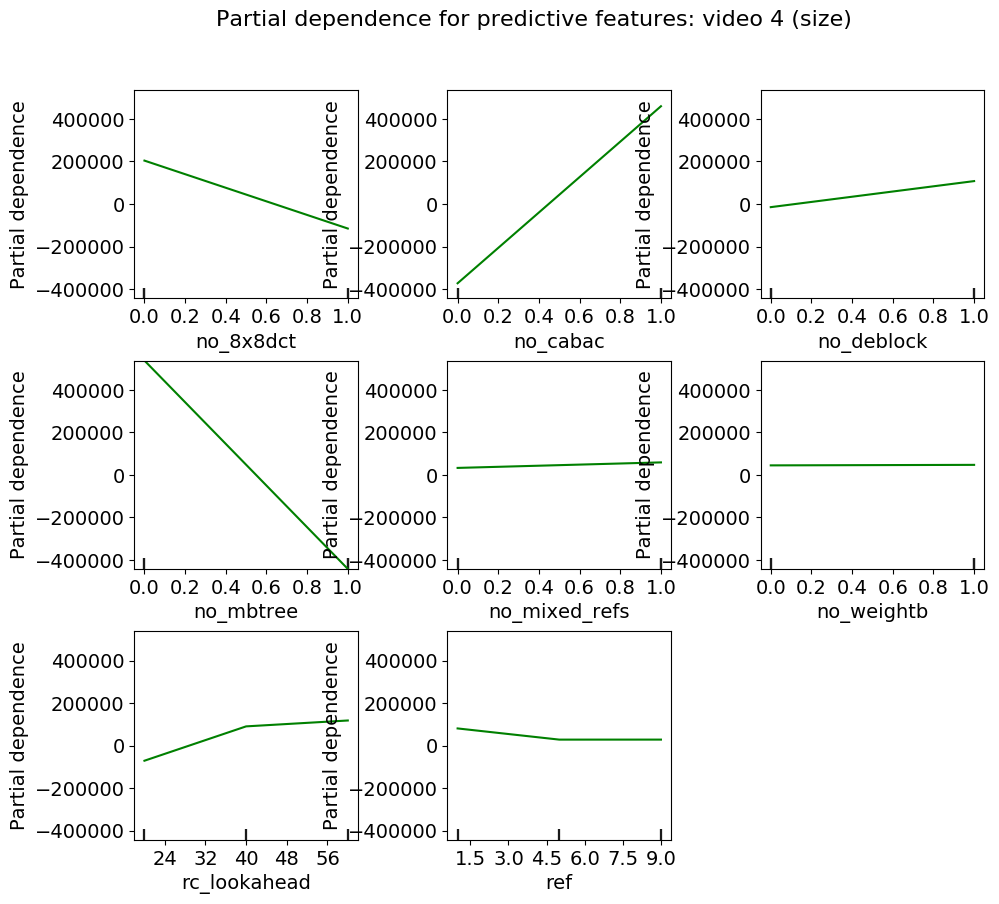

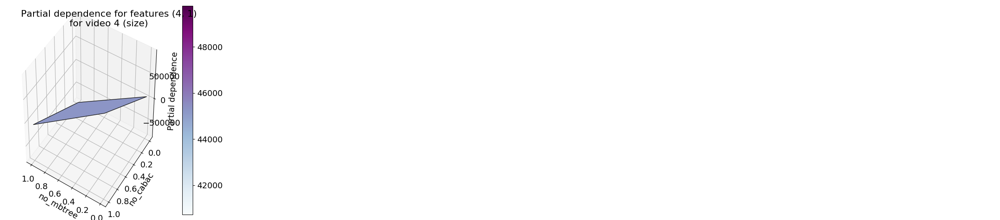

                     x        y       x/y
no_8x8dct       204043  -115432  -1.76764
no_cabac       -372856   459741 -0.811014
no_deblock    -14854.1   107639    -0.138
no_fast_pskip  32056.3  59234.5  0.541175
no_mbtree       537401  -442420  -1.21468
no_mixed_refs  32493.7  58443.2  0.555987
no_weightb     44416.7  46834.7  0.948372
rc_lookahead  -70857.2  90666.7 -0.781513
ref            80983.3  28381.1   2.85342
Video5


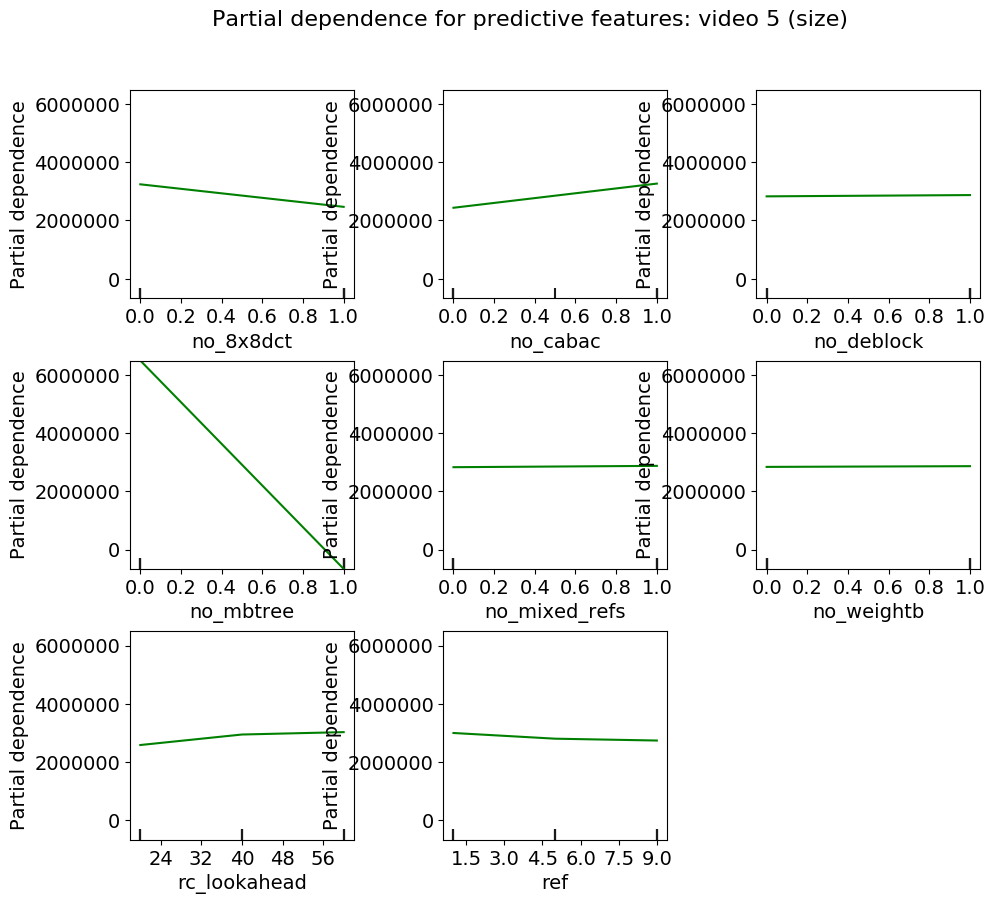

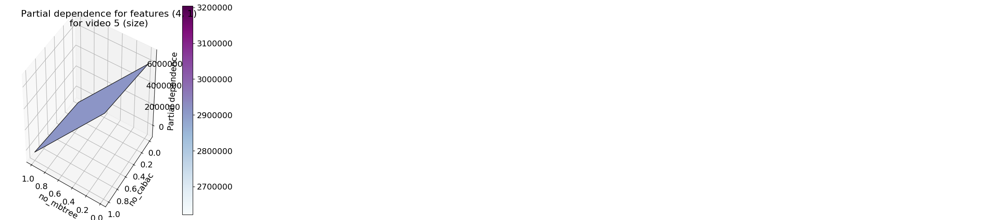

                         x            y       x/y
no_8x8dct      3.24138e+06  2.46827e+06   1.31322
no_cabac       2.43679e+06  3.26617e+06  0.746071
no_deblock      2.8285e+06  2.87231e+06  0.984749
no_fast_pskip  2.85077e+06  2.85082e+06  0.999984
no_mbtree       6.4879e+06      -662026  -9.80007
no_mixed_refs  2.82829e+06   2.8737e+06  0.984199
no_weightb     2.83831e+06  2.86327e+06  0.991283
rc_lookahead   2.58834e+06  2.94869e+06  0.877794
ref            3.00083e+06  2.80542e+06   1.06966
Video6


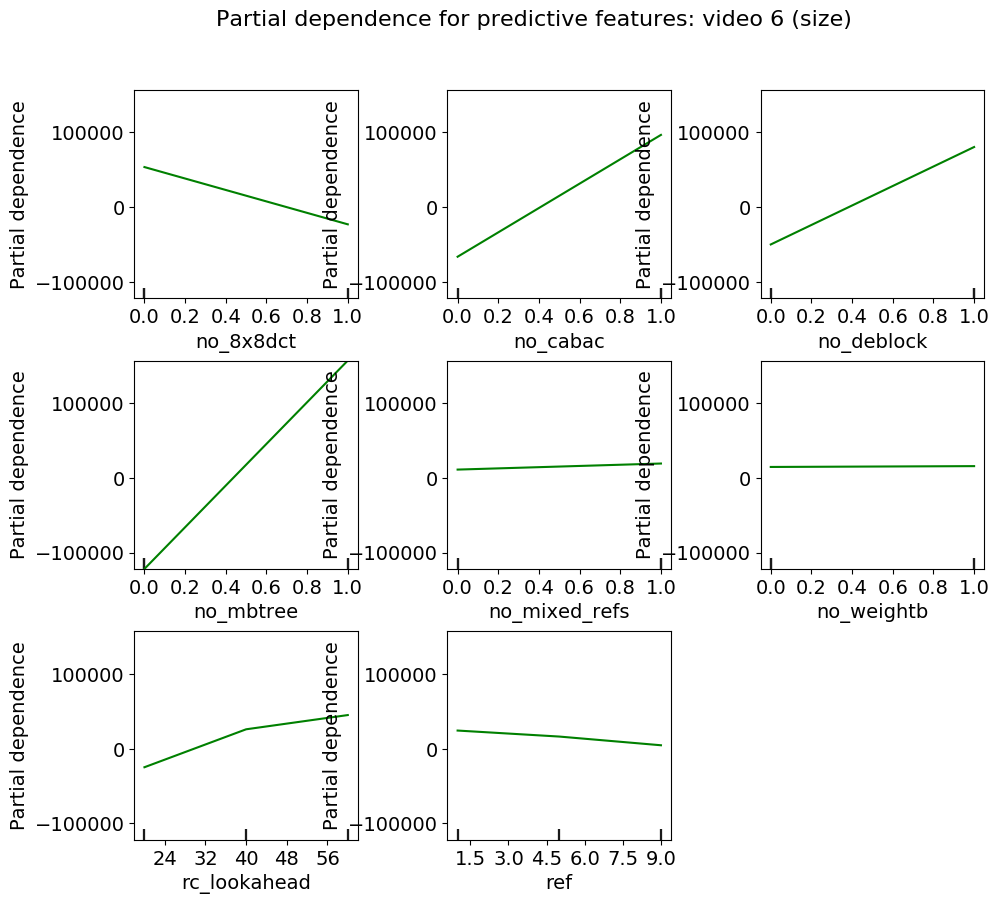

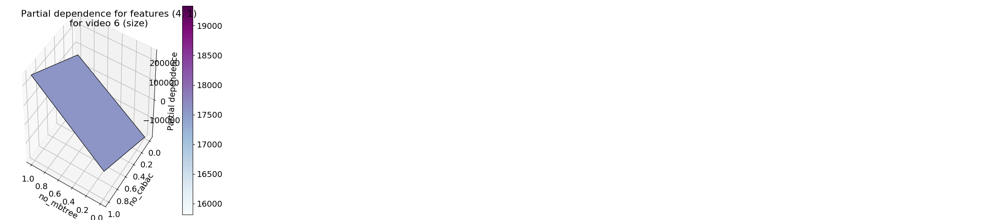

                     x        y       x/y
no_8x8dct      53634.4 -23061.9  -2.32568
no_cabac      -66448.1  96727.7 -0.686961
no_deblock    -50016.2    80486 -0.621427
no_fast_pskip -11475.5  41976.1 -0.273382
no_mbtree      -121801   157233 -0.774652
no_mixed_refs  11198.5  19326.4   0.57944
no_weightb     14723.6  15831.7  0.930007
rc_lookahead  -24708.4    26097 -0.946794
ref            24415.2  16370.1   1.49145
Video7


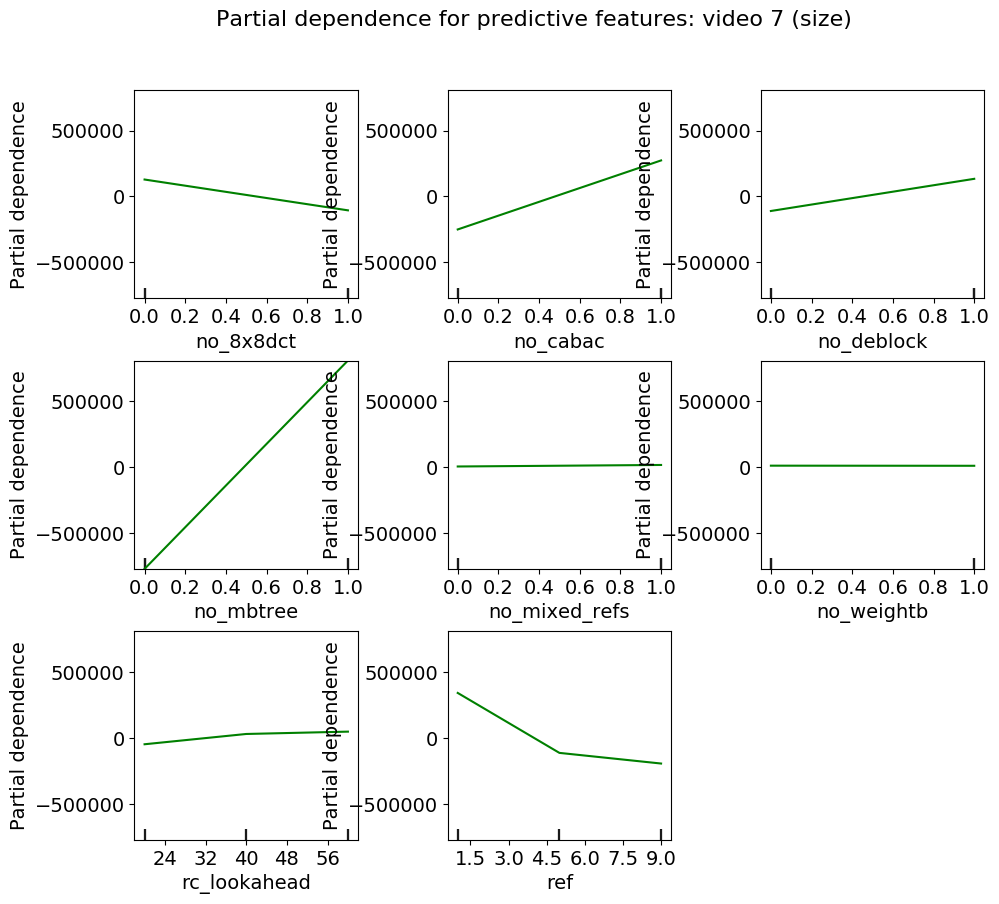

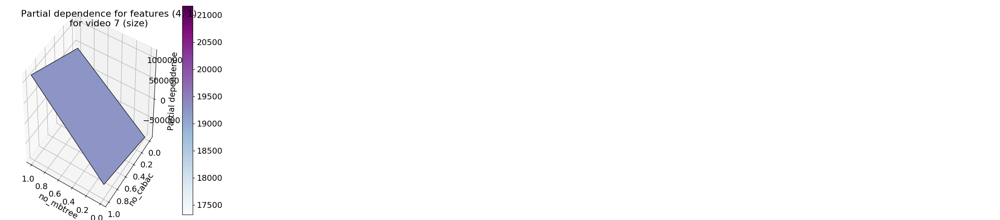

                     x        y       x/y
no_8x8dct       128531  -105125  -1.22265
no_cabac       -250051   273348 -0.914771
no_deblock     -110027   133891 -0.821765
no_fast_pskip  7111.73  16942.3  0.419761
no_mbtree      -770243   809504   -0.9515
no_mixed_refs  6253.56  17796.2  0.351398
no_weightb     12471.3  11580.1   1.07696
rc_lookahead  -46353.6  31627.4  -1.46562
ref             342824  -111788  -3.06672
Video8


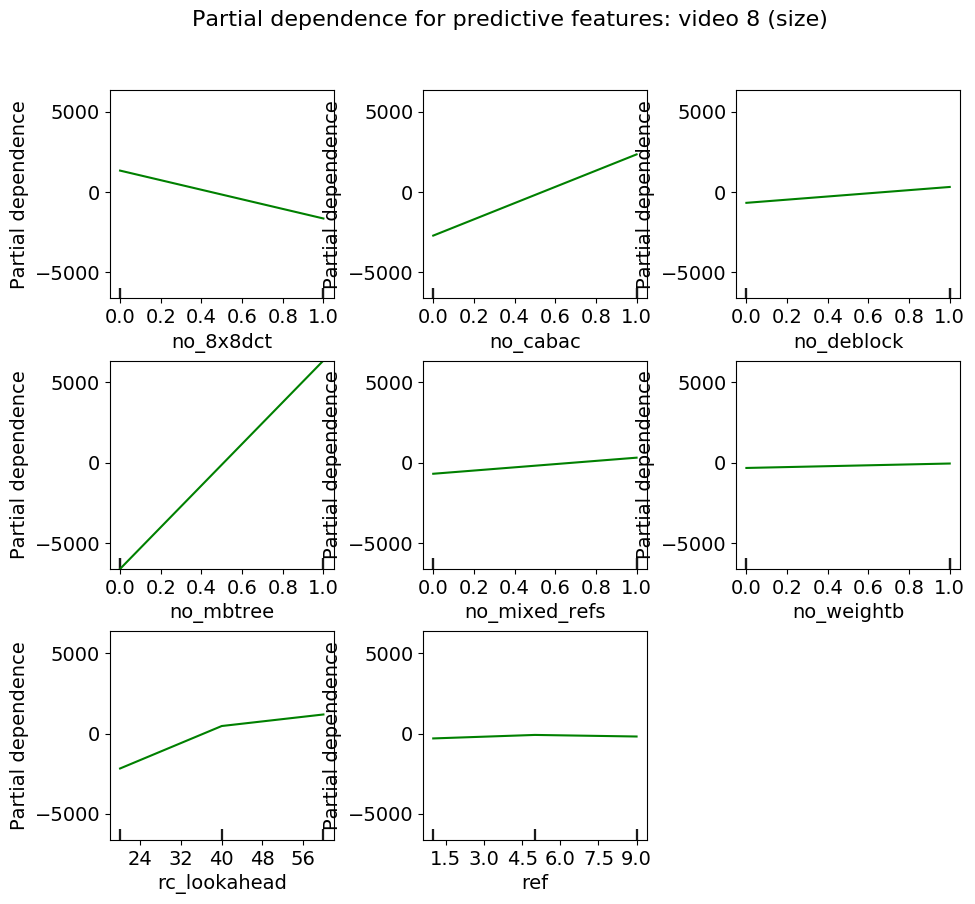

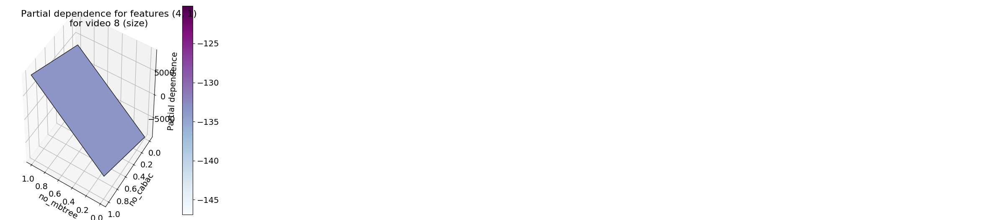

                     x        y       x/y
no_8x8dct      1325.64  -1660.6 -0.798289
no_cabac      -2727.54  2335.87  -1.16768
no_deblock     -684.61  304.956  -2.24495
no_fast_pskip -1181.09  797.093  -1.48175
no_mbtree     -6621.56  6368.14   -1.0398
no_mixed_refs -690.329  312.531  -2.20883
no_weightb    -328.397 -51.8391   6.33494
rc_lookahead  -2179.46  468.007   -4.6569
ref           -305.419 -87.7448   3.48077
Video9


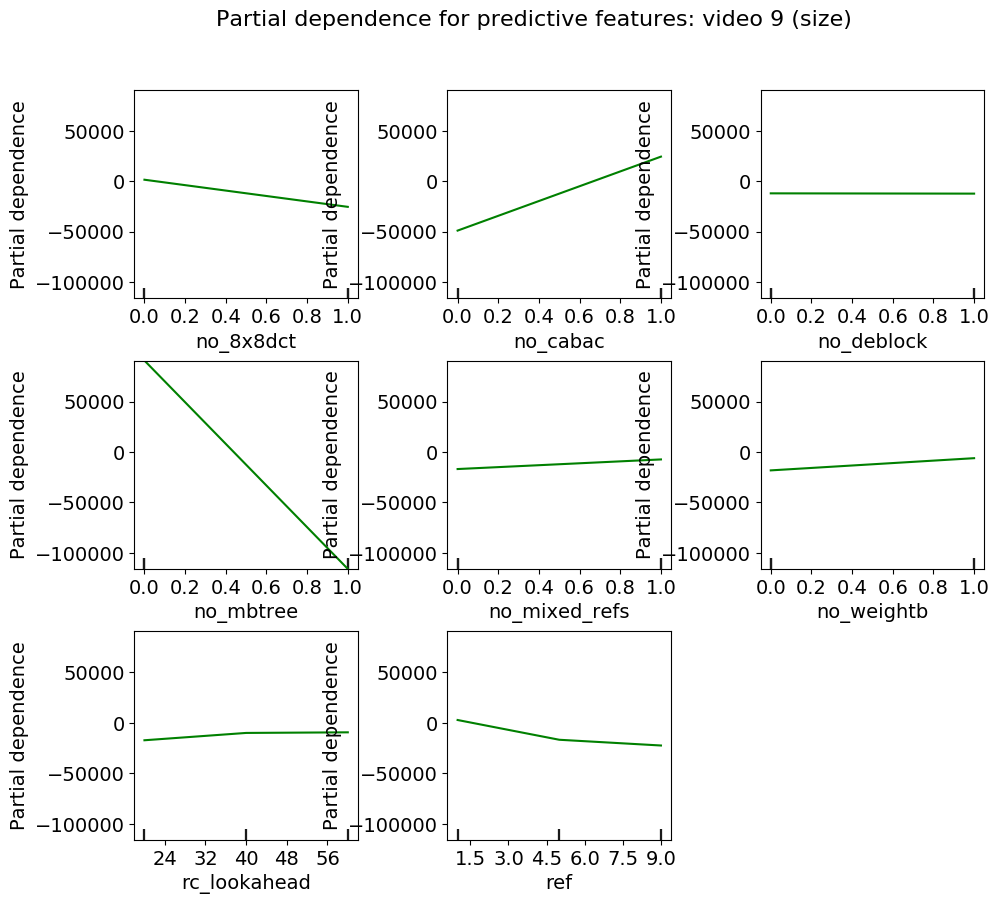

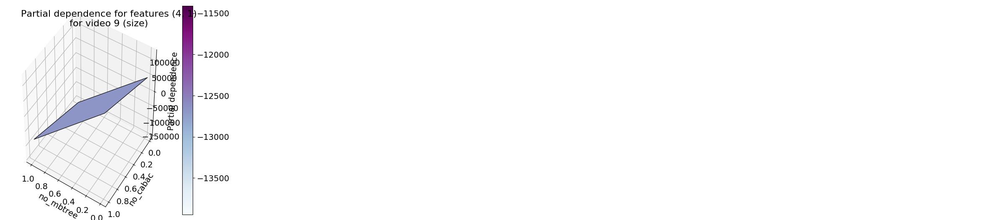

                     x        y        x/y
no_8x8dct      1503.95 -25397.7 -0.0592159
no_cabac      -48957.7    24407   -2.00589
no_deblock    -12009.1 -12284.2   0.977606
no_fast_pskip -12173.6   -12120    1.00443
no_mbtree      90763.5  -115855  -0.783421
no_mixed_refs -16831.4 -7295.97    2.30694
no_weightb    -18156.3 -6062.38    2.99492
rc_lookahead  -17210.7 -9942.35    1.73105
ref            2878.17 -16717.3  -0.172167
Video10


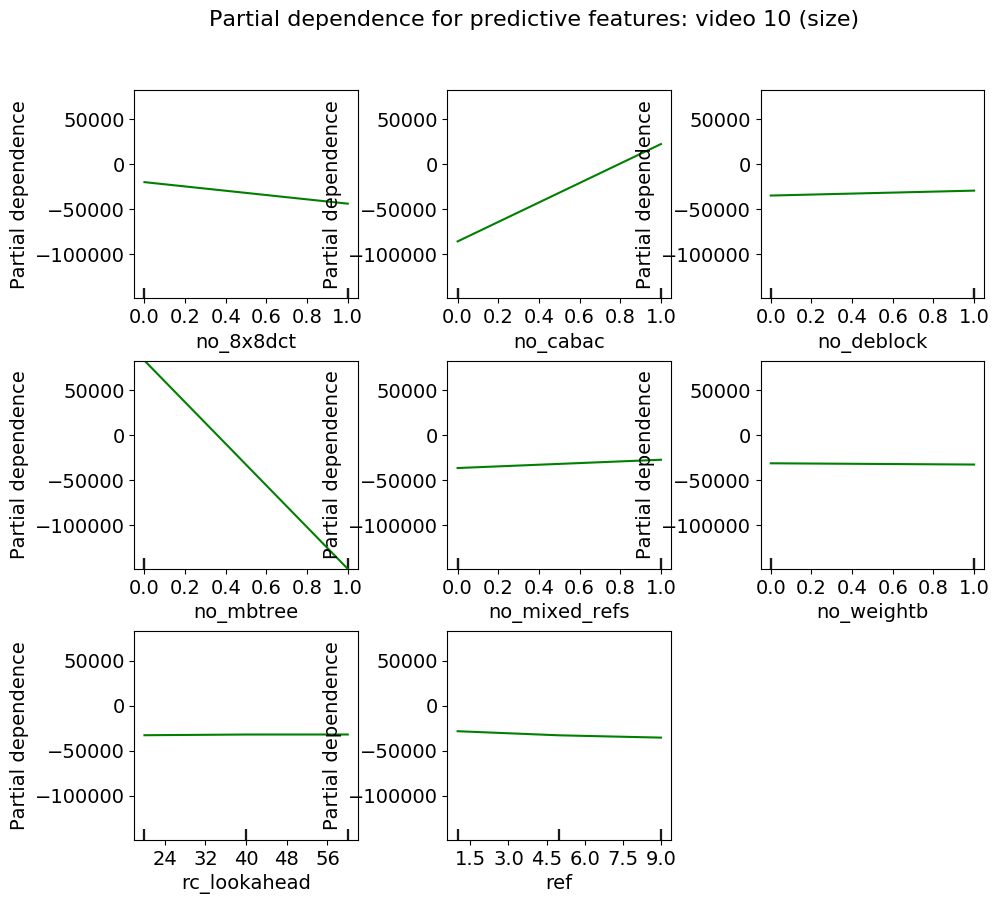

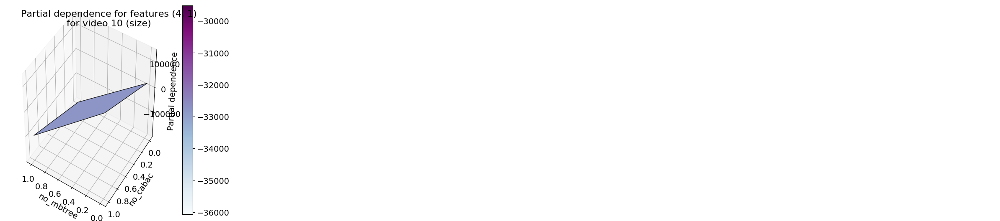

                     x        y       x/y
no_8x8dct     -20139.8 -44047.7  0.457228
no_cabac      -85966.7  22176.5  -3.87647
no_deblock    -35028.5 -29569.3   1.18462
no_fast_pskip -32822.1 -31748.4   1.03382
no_mbtree      82509.5  -148885 -0.554183
no_mixed_refs -36861.4 -27667.3   1.33231
no_weightb    -31594.4   -32986  0.957812
rc_lookahead  -32815.2 -32040.8   1.02417
ref           -28366.7 -32923.1  0.861606
Video11


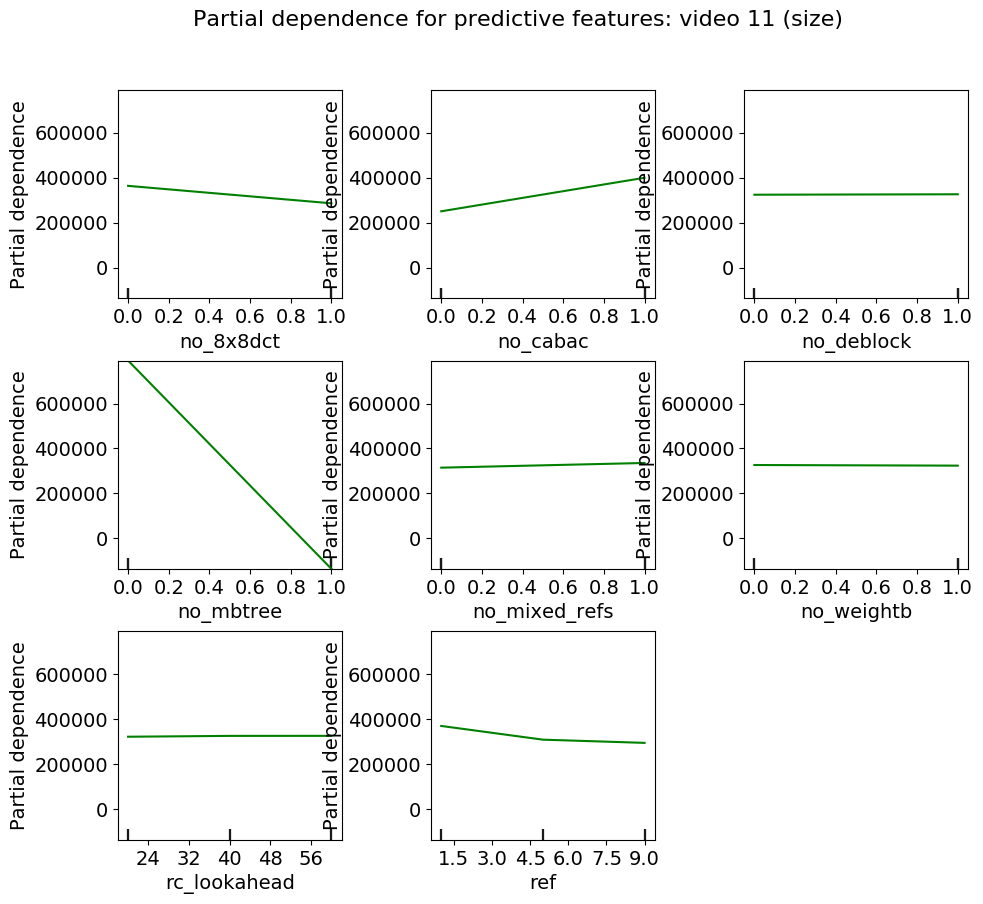

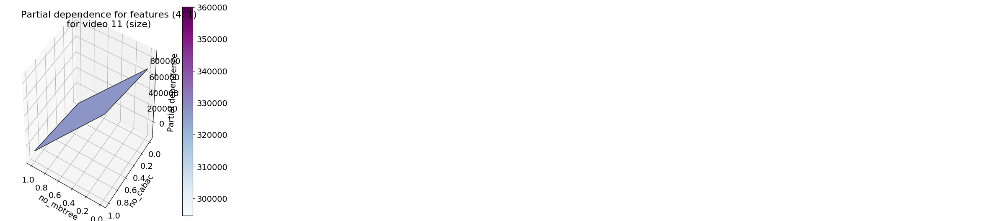

                    x       y       x/y
no_8x8dct      363312  285714   1.27159
no_cabac       250146  399347  0.626388
no_deblock     323914  325871  0.993993
no_fast_pskip  324867  324929  0.999808
no_mbtree      791095 -135899   -5.8212
no_mixed_refs  314513  335372  0.937804
no_weightb     326297  323537   1.00853
rc_lookahead   322374  326124  0.988501
ref            370330  309339   1.19717
Video12


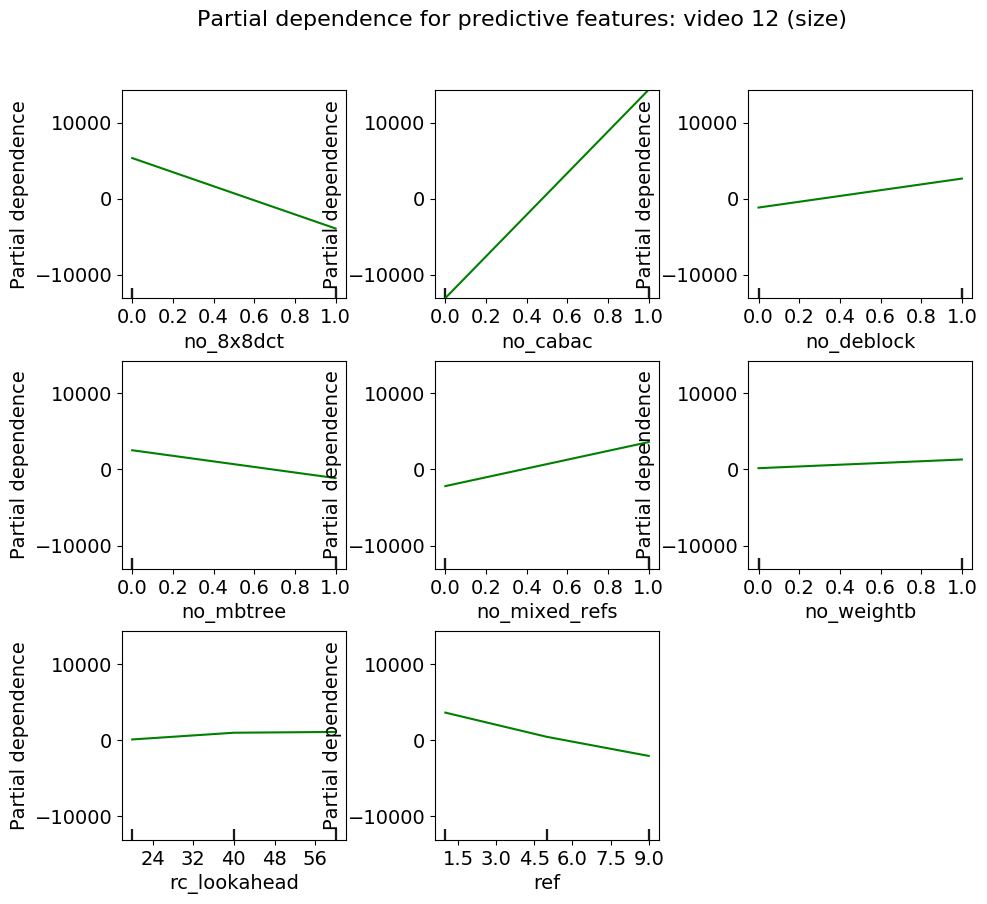

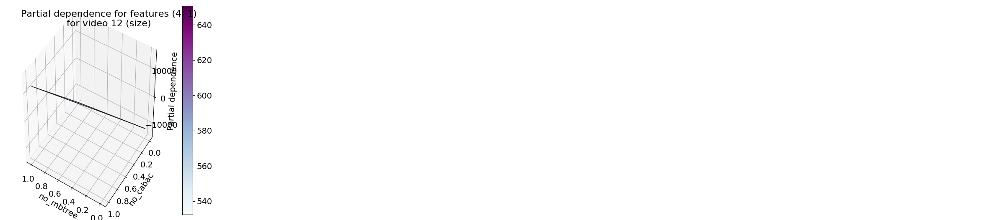

                     x        y       x/y
no_8x8dct      5338.59 -3923.56  -1.36065
no_cabac      -13070.9  14322.4 -0.912617
no_deblock    -1170.73  2635.17  -0.44427
no_fast_pskip -383.196  1872.07 -0.204691
no_mbtree      2528.91  -1129.5  -2.23897
no_mixed_refs -2184.18  3602.29 -0.606331
no_weightb     170.253  1313.25  0.129643
rc_lookahead   113.045  996.588  0.113432
ref            3641.29  452.555   8.04606
Video13


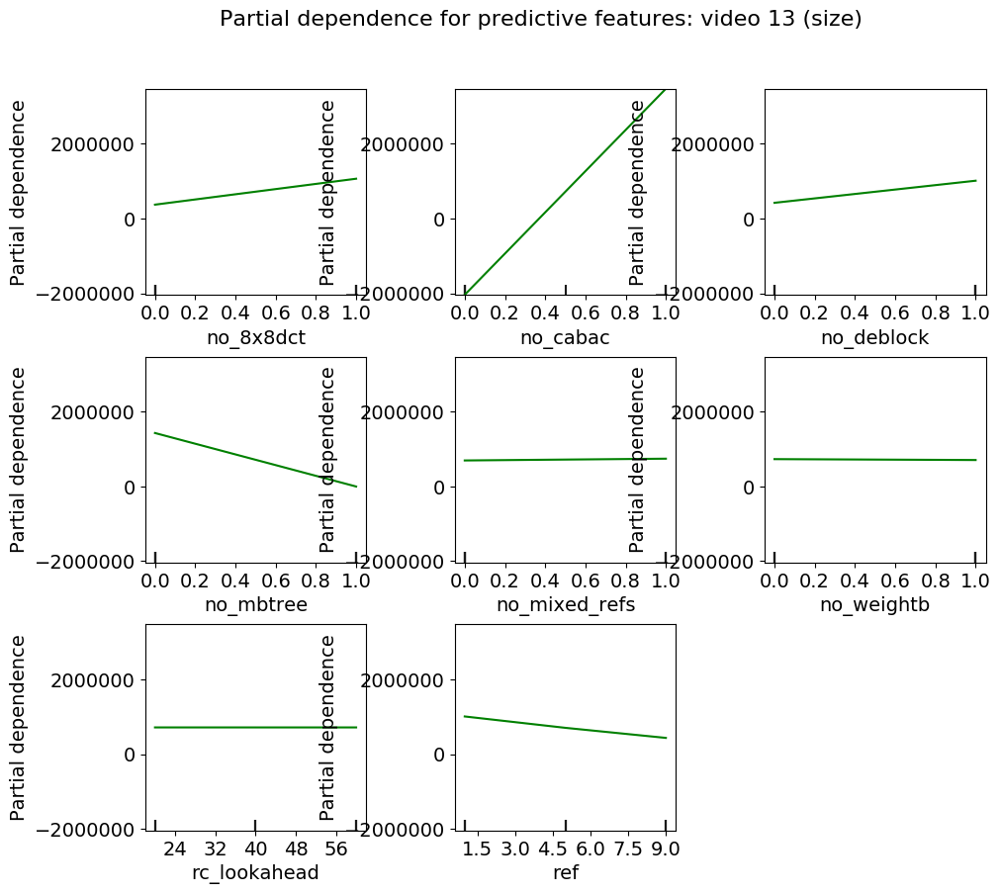

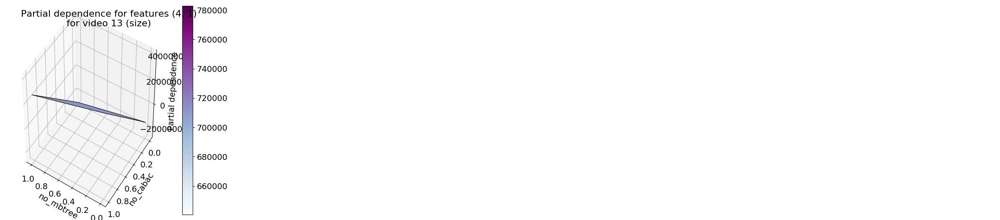

                         x            y       x/y
no_8x8dct           371443  1.06543e+06  0.348632
no_cabac      -2.03906e+06  3.47268e+06 -0.587173
no_deblock          420840  1.01185e+06  0.415913
no_fast_pskip       716824       716824         1
no_mbtree      1.42748e+06     -3776.68  -377.971
no_mixed_refs       693354       740885  0.935845
no_weightb          728959       705005   1.03398
rc_lookahead        716865       716805   1.00008
ref            1.00993e+06       705944   1.43061
Video14


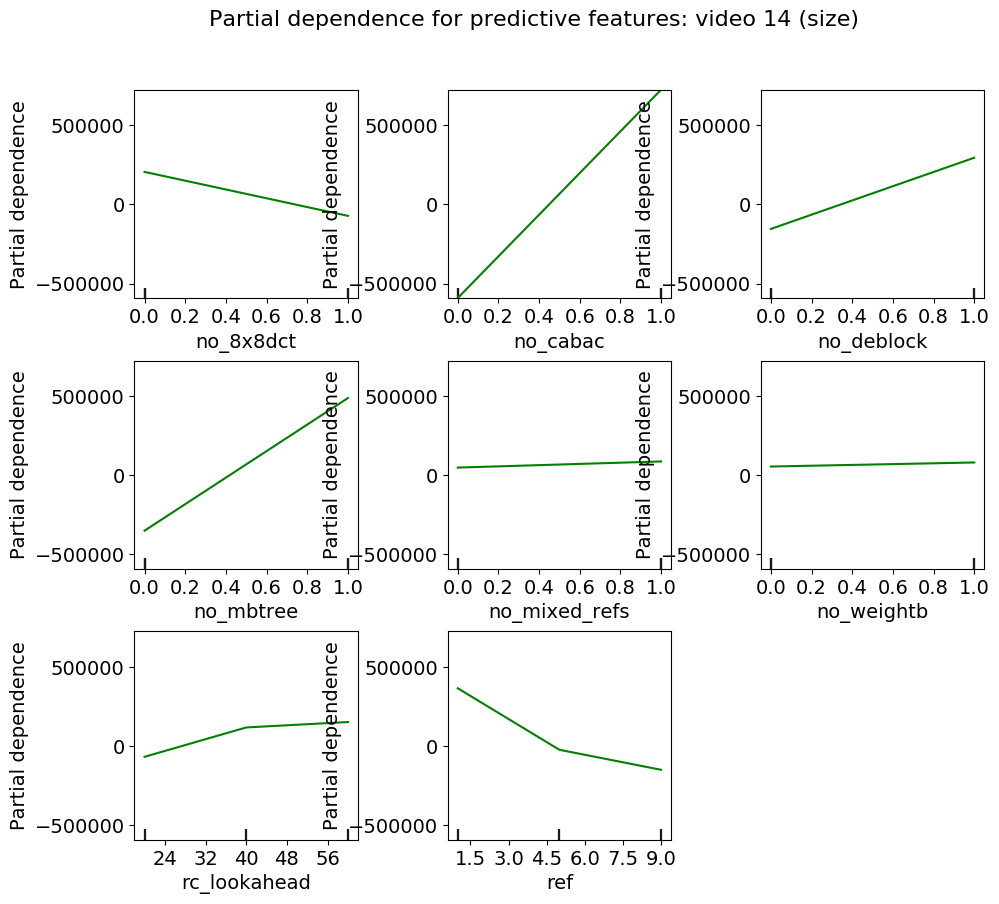

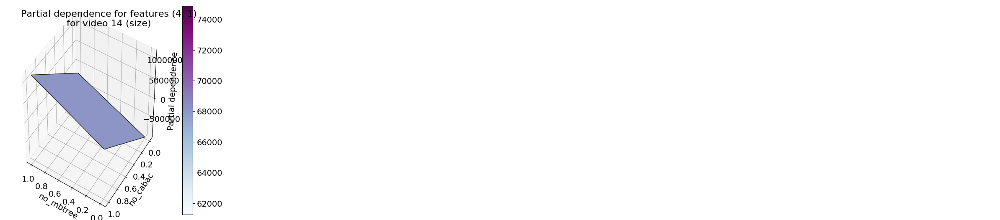

                     x        y       x/y
no_8x8dct       206156 -71909.9  -2.86687
no_cabac       -592056   726269 -0.815202
no_deblock     -154558   295830 -0.522455
no_fast_pskip    44031  92995.1  0.473476
no_mbtree      -350254   488978 -0.716299
no_mixed_refs    48994  87771.5  0.558199
no_weightb     55622.4  81297.4  0.684184
rc_lookahead  -67366.1   118403 -0.568954
ref             366512 -22981.3  -15.9483
Video15


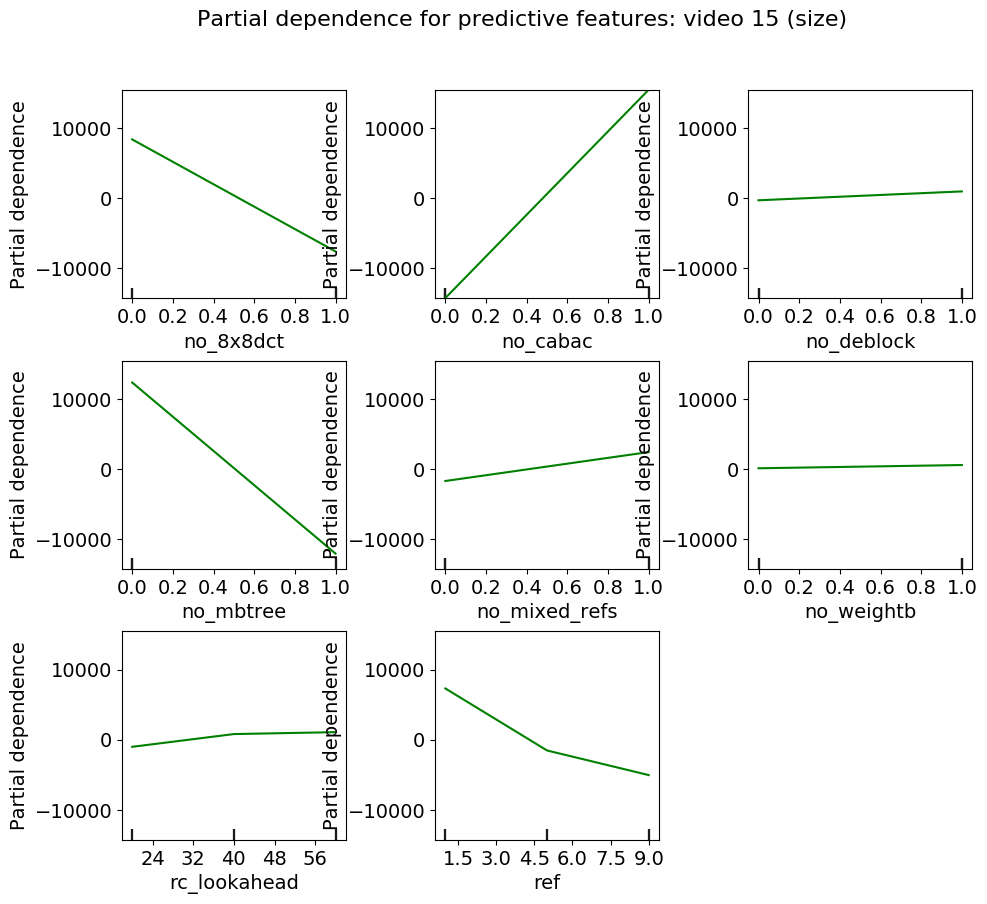

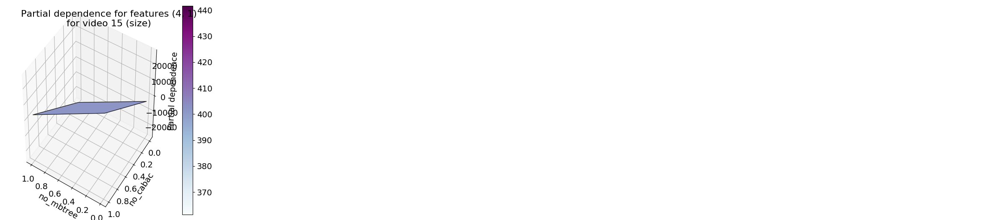

                     x        y       x/y
no_8x8dct      8358.98 -7622.69  -1.09659
no_cabac      -14268.4  15447.9 -0.923643
no_deblock    -322.263   943.41 -0.341594
no_fast_pskip  246.468  362.623  0.679682
no_mbtree      12316.8 -12088.5  -1.01888
no_mixed_refs -1731.48   2392.9 -0.723592
no_weightb      83.112  546.531  0.152072
rc_lookahead  -1015.44  801.147  -1.26748
ref            7307.41  -1537.4  -4.75309
Video16


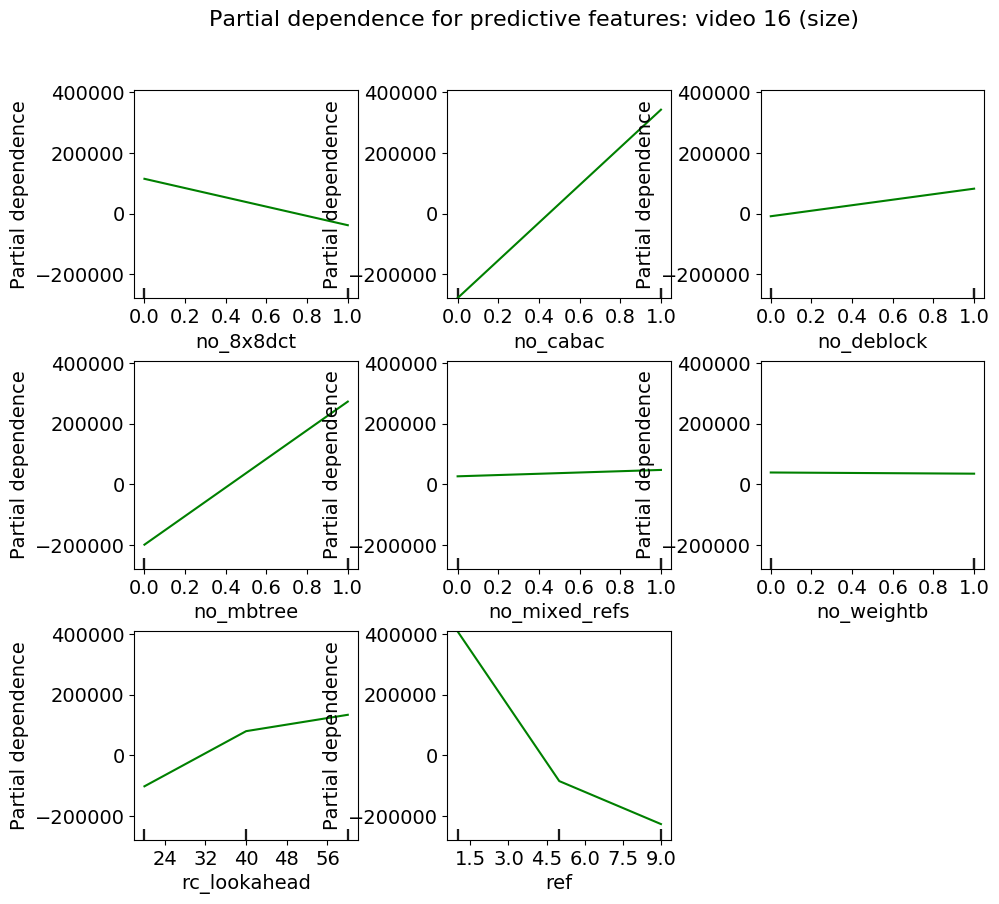

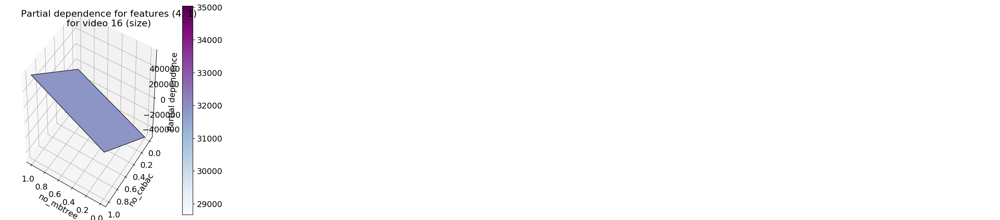

                     x        y       x/y
no_8x8dct       114576 -38269.8   -2.9939
no_cabac       -278266   342338 -0.812841
no_deblock    -8732.51  82103.8 -0.106359
no_fast_pskip  36901.4  37806.5   0.97606
no_mbtree      -198475   272920 -0.727228
no_mixed_refs  26726.5  47748.3  0.559737
no_weightb     39313.8  35425.3   1.10976
rc_lookahead   -102274  79403.9  -1.28803
ref             408095 -85111.6  -4.79482
Video17


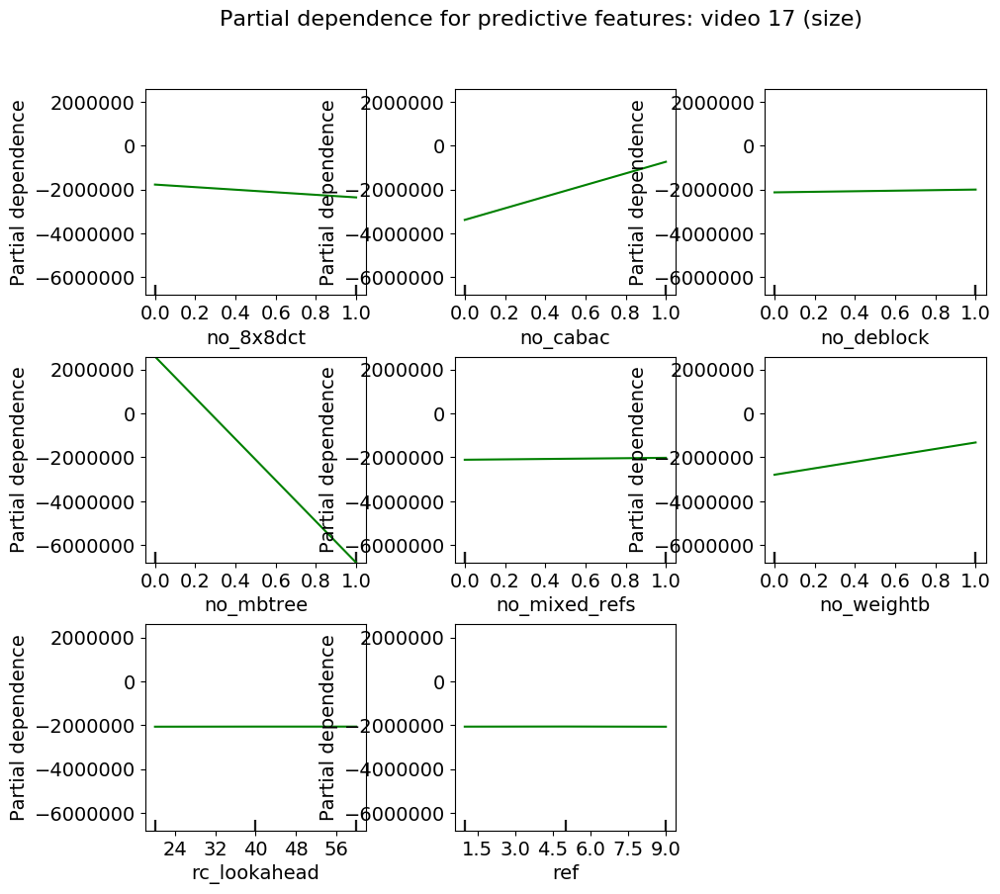

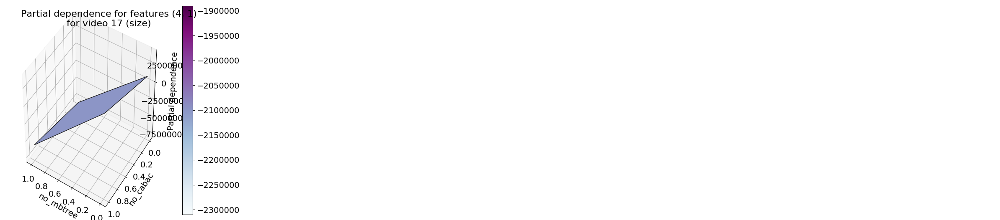

                         x            y       x/y
no_8x8dct     -1.77754e+06  -2.3625e+06  0.752401
no_cabac      -3.38788e+06      -738896   4.58506
no_deblock    -2.13242e+06 -2.00532e+06   1.06338
no_fast_pskip -2.06889e+06 -2.06805e+06   1.00041
no_mbtree      2.59231e+06 -6.80177e+06 -0.381123
no_mixed_refs -2.11201e+06 -2.02372e+06   1.04363
no_weightb    -2.79505e+06 -1.32515e+06   2.10923
rc_lookahead  -2.07134e+06   -2.067e+06    1.0021
ref           -2.06864e+06 -2.06365e+06   1.00242
Video18


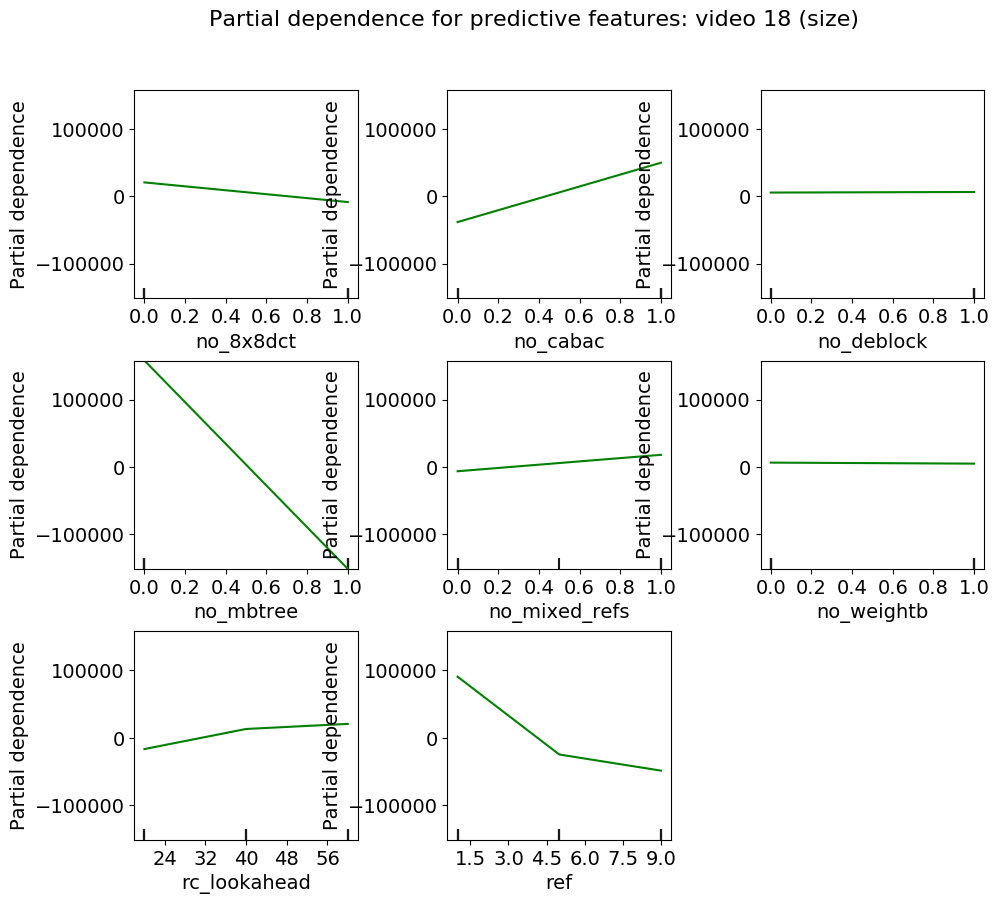

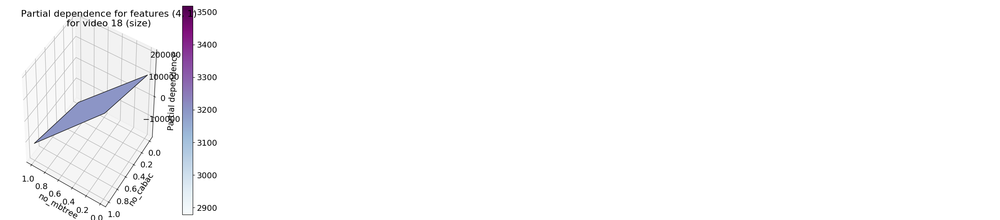

                     x        y       x/y
no_8x8dct      20419.9 -8739.37  -2.33654
no_cabac      -38474.9  49661.5 -0.774742
no_deblock     5337.18   6183.8   0.86309
no_fast_pskip  5816.95  5713.08   1.01818
no_mbtree       158044  -151299  -1.04458
no_mixed_refs -6312.71    18075 -0.349252
no_weightb     6511.94  4992.83   1.30426
rc_lookahead  -16667.8  13153.9  -1.26713
ref            90758.7 -24761.4  -3.66533
Video19


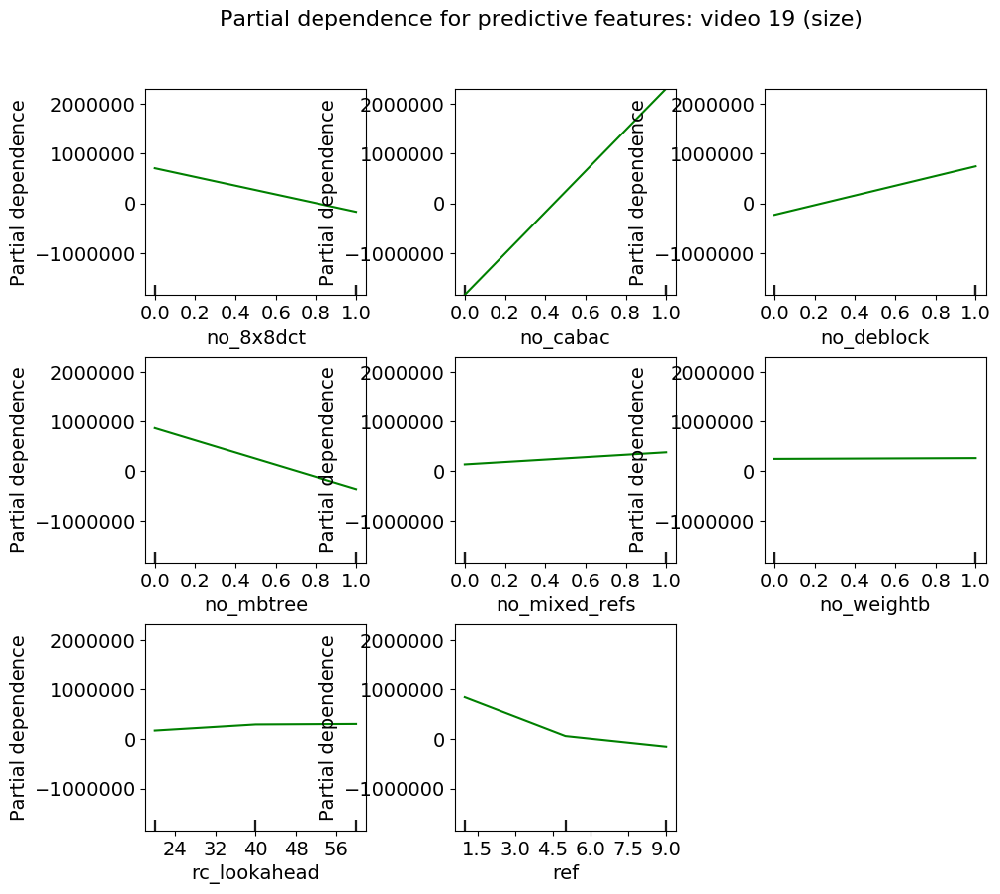

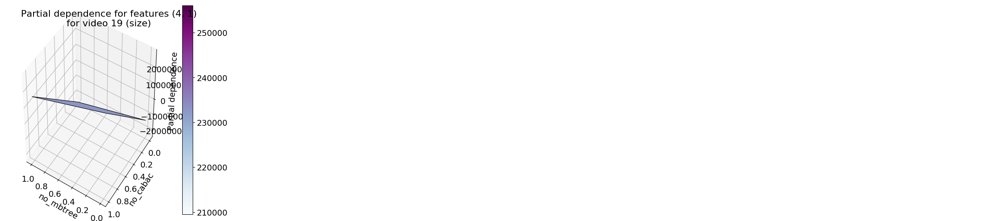

                         x            y       x/y
no_8x8dct           707027      -169614  -4.16844
no_cabac      -1.83813e+06  2.30605e+06 -0.797091
no_deblock         -230465       745374 -0.309194
no_fast_pskip       224347       290963   0.77105
no_mbtree           867824      -354575  -2.44751
no_mixed_refs       139657       382017  0.365578
no_weightb          250068       265797  0.940824
rc_lookahead        174316       296278  0.588353
ref                 840978      64175.9   13.1043
Video20


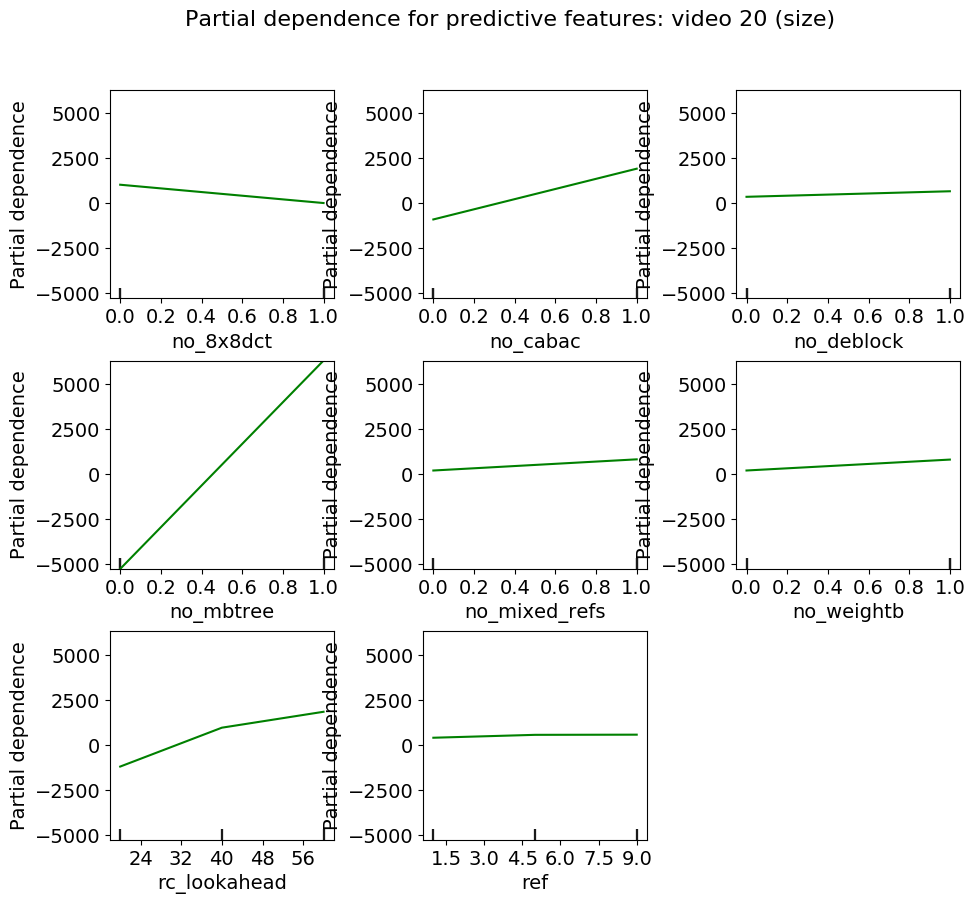

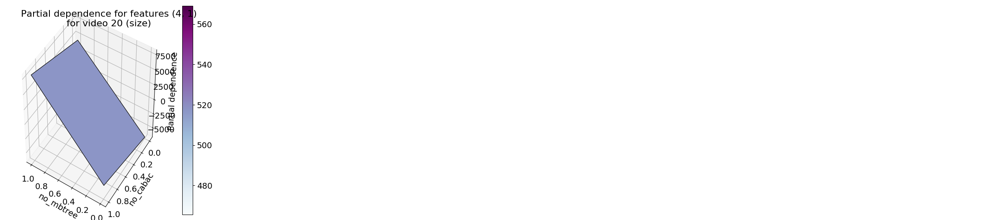

                     x        y       x/y
no_8x8dct      1025.89  7.37821   139.043
no_cabac      -905.259  1917.58 -0.472085
no_deblock     353.602  662.275   0.53392
no_fast_pskip  395.055  608.615  0.649106
no_mbtree     -5277.32  6309.52 -0.836406
no_mixed_refs  194.226  815.351  0.238211
no_weightb     195.083  801.729  0.243328
rc_lookahead  -1208.58  953.705  -1.26724
ref            394.676   556.04  0.709798
Video21


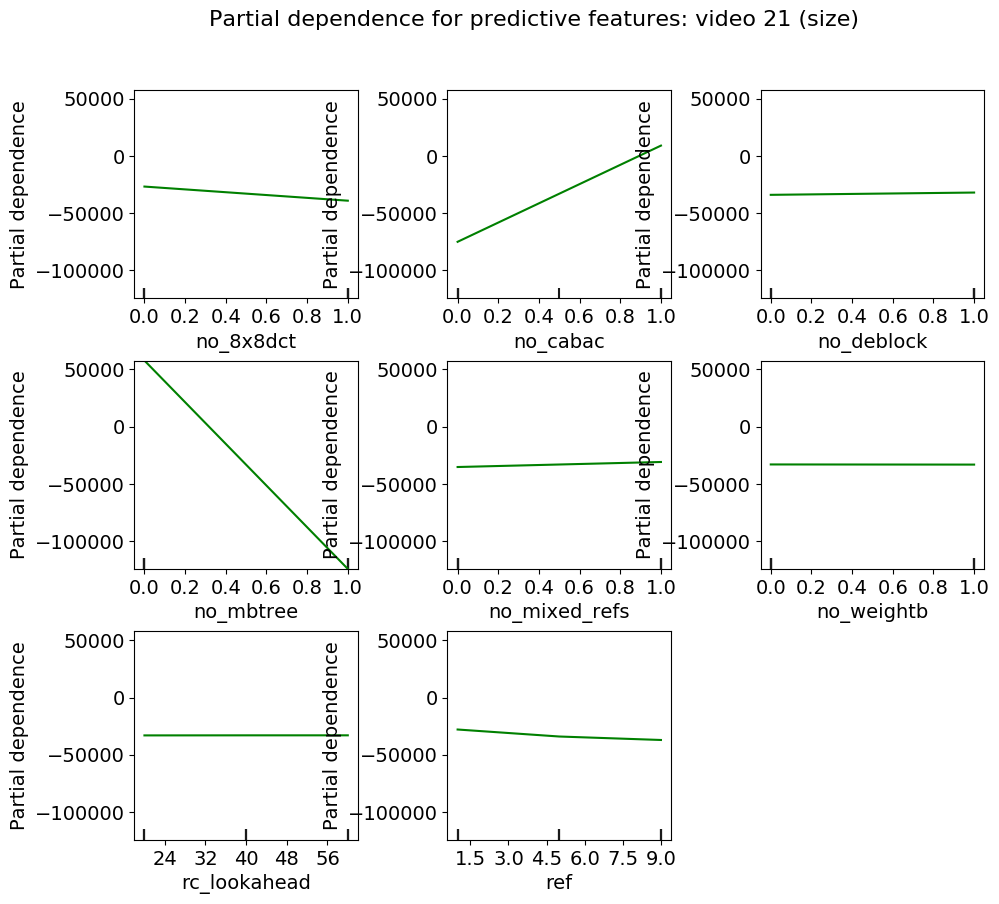

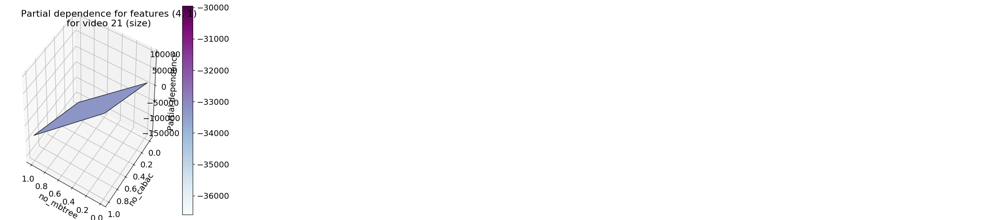

                     x        y       x/y
no_8x8dct     -26856.5 -39200.2  0.685111
no_cabac      -75143.6  8952.71  -8.39339
no_deblock    -34086.1 -32084.7   1.06238
no_fast_pskip -33179.4 -32982.4   1.00597
no_mbtree      57798.5  -124309 -0.464958
no_mixed_refs -35260.4   -30867   1.14233
no_weightb    -33015.6 -33143.2  0.996151
rc_lookahead  -33121.4 -33062.2   1.00179
ref           -27972.1 -34093.7  0.820448
Video22


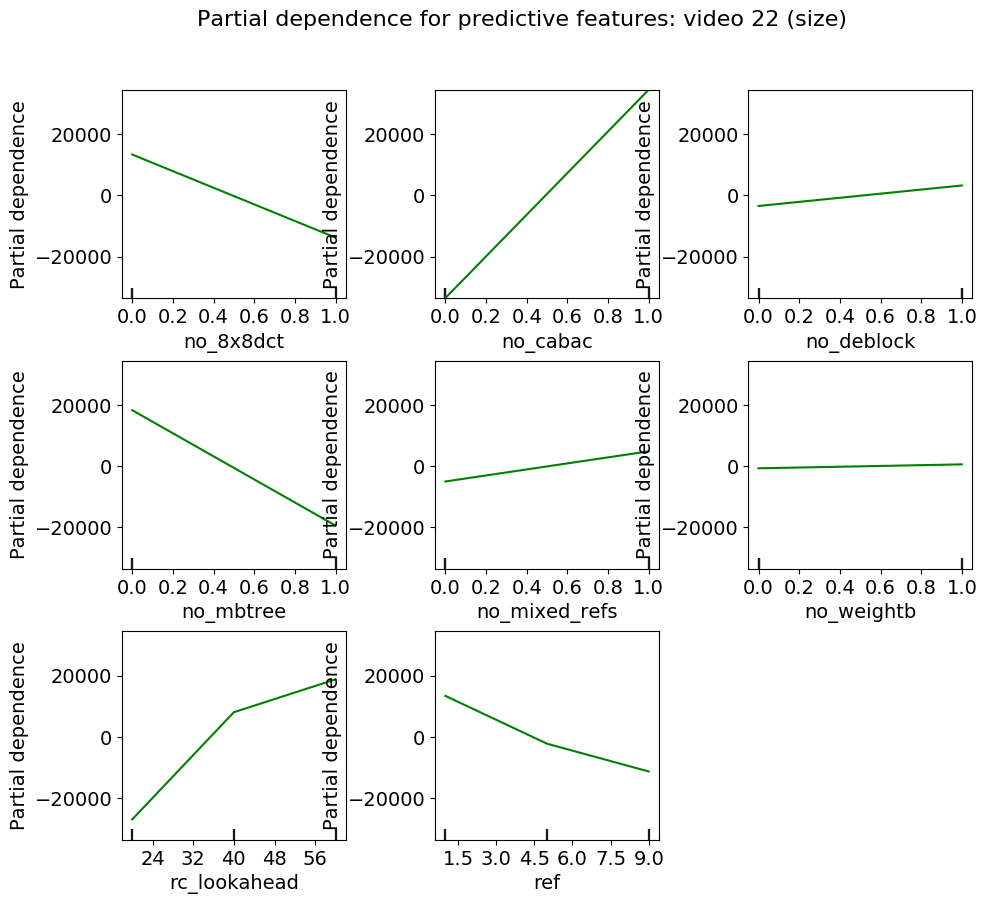

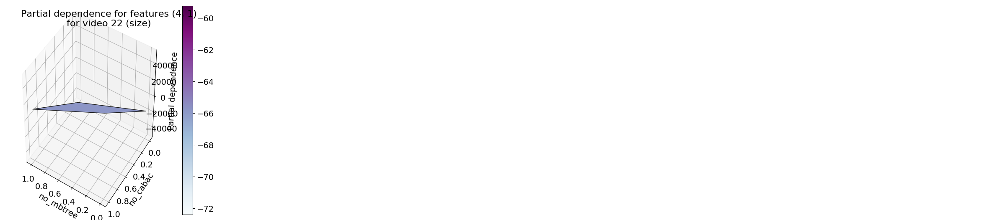

                     x        y       x/y
no_8x8dct        13279 -13825.8 -0.960449
no_cabac      -33551.4  34422.4 -0.974696
no_deblock    -3509.04  3181.42  -1.10298
no_fast_pskip -1572.42  1405.45   -1.1188
no_mbtree      18232.4 -19412.9 -0.939187
no_mixed_refs  -5035.2   4799.9  -1.04902
no_weightb    -732.372  551.143  -1.32882
rc_lookahead  -26929.3  8050.74  -3.34495
ref            13382.2 -2224.94  -6.01466
Video23


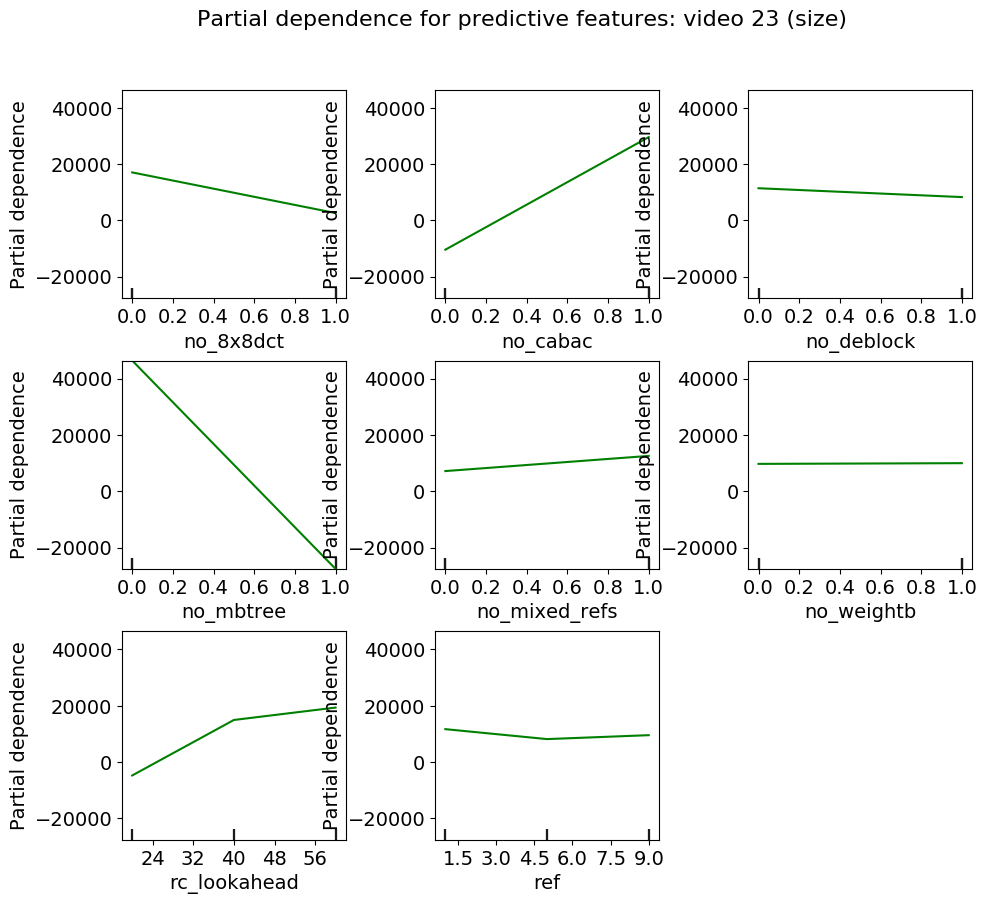

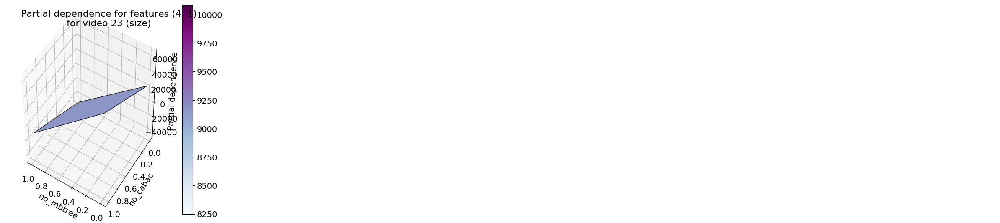

                     x        y       x/y
no_8x8dct      17051.3  2608.12   6.53777
no_cabac        -10407    29593 -0.351672
no_deblock     11428.5  8286.21   1.37922
no_fast_pskip  9933.85  9756.24    1.0182
no_mbtree      46432.6 -27592.4   -1.6828
no_mixed_refs  7163.56  12547.8    0.5709
no_weightb     9720.29   9970.7  0.974885
rc_lookahead  -4762.23  14956.8 -0.318399
ref            11692.6  8163.89   1.43224
Video24


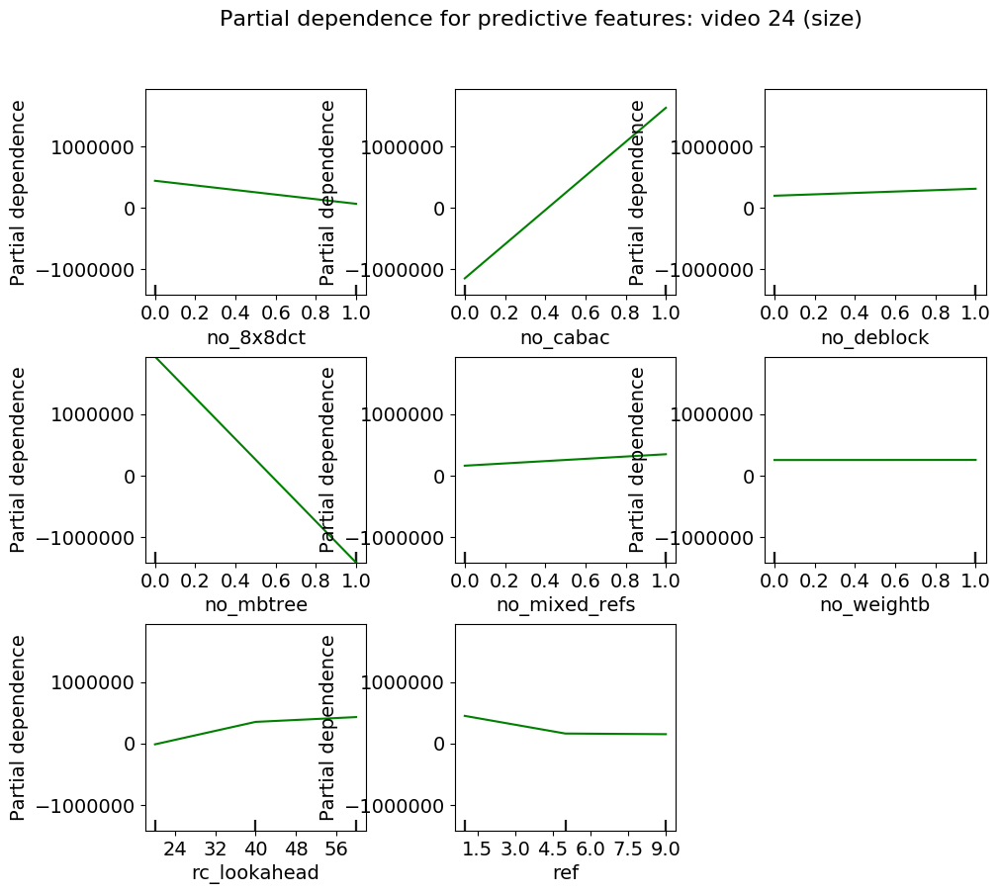

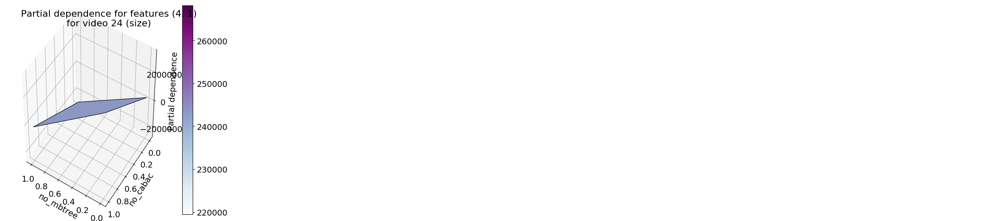

                         x            y        x/y
no_8x8dct           437563      63280.8    6.91462
no_cabac      -1.15013e+06  1.62528e+06  -0.707649
no_deblock          194425       308103    0.63104
no_fast_pskip       188349       319685   0.589168
no_mbtree      1.93515e+06 -1.41681e+06   -1.36585
no_mixed_refs       159795       346091   0.461713
no_weightb          251940       253588   0.993503
rc_lookahead      -15838.5       349322 -0.0453407
ref                 447089       159777     2.7982


,pdp_cabac_x,pdp_cabac_y,pdp_mbtree_x,pdp_mbtree_y
0,-1.049383e+06,-5.900331e+05,8.297429e+04,7.107567e+05
1,6.905004e+06,1.013363e+07,-3.196266e+06,-8.185042e+05
2,-9.177538e+04,1.231806e+04,-1.036852e+04,1.024746e+05
3,4.290168e+04,3.970902e+05,-3.433163e+05,-3.198193e+04
4,7.738931e+04,9.769759e+05,-8.194705e+05,-5.383853e+04
5,6.007248e+06,6.972714e+06,-1.011642e+06,-3.137255e+05
6,-1.943723e+05,-4.944946e+04,6.603820e+04,2.480973e+05
7,-9.453541e+05,-5.960043e+05,4.587436e+05,1.159608e+06
8,-9.041952e+03,-4.213584e+03,3.708656e+03,9.012804e+03
9,5.224072e+04,1.295732e+05,-1.509428e+05,-8.157061e+04


In [86]:
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble.partial_dependence import plot_partial_dependence
from sklearn.ensemble.partial_dependence import partial_dependence
from sklearn.datasets.california_housing import fetch_california_housing

def ftImportancesWithPartialDependence(idVideo, ftsOfInterest, pairFtToAnalyze):     

    print('Video' + str(idVideo))
    X, y = listeVideo[idVideo][:], listeVideo[idVideo][predDimension][:]
    X = X.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'elapsedtime', 'size', 'no_asm'], axis=1)
    clf = GradientBoostingRegressor(n_estimators=100, max_depth=4,
                                    learning_rate=0.1, loss='huber',
                                    random_state=None)
    
    # RandomForestRegressor(n_estimators=500)
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=None)  

    clf.fit(X_train, y_train)


    features = [X_train.columns.get_loc(c) for c in X_train.columns if c in ftsOfInterest]
#    X_train.columns.get_loc("ref") #, "no_mbtree") # list(range(len(X_train.columns))) 
    # features.append((5, 1))
  #  print(features)
    names = X_train.columns# .values # cols.index # X_train.columns.filter(items=cols)
  #  print(X_train.columns)
    # cols # X_train.columns
   # print(names)
    fig, axs = plot_partial_dependence(clf, X_train, features,
                                       feature_names=names,
                                       n_jobs=3, grid_resolution=50, figsize=(10, 10))
    fig.suptitle('Partial dependence for predictive features: video ' + str(idVideo) + ' (' + predDimension + ')')
    plt.subplots_adjust(top=0.9)  # tight_layout causes overlap with suptitle
      

    fig = plt.figure(figsize=(5, 5))
    
    target_feature = (X_train.columns.get_loc(pairFtToAnalyze[0]), X_train.columns.get_loc(pairFtToAnalyze[1]))
#    target_feature = (5, 8)
    pdp, axes = partial_dependence(clf, target_feature,
                                   X=X_train, grid_resolution=50)
    
    XX, YY = np.meshgrid(axes[0], axes[1])
    Z = pdp[0].reshape(list(map(np.size, axes))).T
    ax = Axes3D(fig)
    surf = ax.plot_surface(XX, YY, Z, rstride=1, cstride=1,
                           cmap=plt.cm.BuPu, edgecolor='k')
    ax.set_xlabel(names[target_feature[0]])
    ax.set_ylabel(names[target_feature[1]])
    ax.set_zlabel('Partial dependence')
    #  pretty init view
    ax.view_init(elev=42, azim=122)
    plt.colorbar(surf)
    fig.suptitle('Partial dependence for features ' + str(target_feature) + '\n' +  
                'for video ' + str(idVideo) + ' (' + predDimension + ')')
    plt.subplots_adjust(top=0.9)

    plt.show()
    pds_per_feature = pd.DataFrame(columns=["x", "y", "x/y"], index=X_train.columns)
    for ft in range(len(X_train.columns)):
        ft_name = X_train.columns[ft]
        pdp_f, ax_f = partial_dependence(clf, ft, X=X_train, grid_resolution=50)       
#        pds_per_feature = pds_per_feature.append({ft_name : pdp_f[0]}, ignore_index=True)
        pds_per_feature.loc[ft_name] = { "x" : pdp_f[0][0], "y": pdp_f[0][1], "x/y": pdp_f[0][0] / pdp_f[0][1] }        
    print(pds_per_feature)
    
    return pdp

partial_dependencies = pd.DataFrame(columns=['pdp_cabac_x',  'pdp_cabac_y', 'pdp_mbtree_x', 'pdp_mbtree_y'])
for i in range(len(listeVideo)):
    # for time?
    if (predDimension == "elapsedtime"):
        pdp_v = ftImportancesWithPartialDependence(i, ["ref", "no_cabac", "no_mbtree", "no_mixed_refs", "rc_lookahead", "ref", "no_8x8dct", "no_deblock", "no_weightb"], ("no_mixed_refs", "no_mbtree")) # no_mixed_refs
        partial_dependencies.loc[i] = pdp_v[0]
    elif (predDimension == "size"):
        pdp_v = ftImportancesWithPartialDependence(i, ["ref", "no_cabac", "no_mbtree", "no_mixed_refs", "rc_lookahead", "ref", "no_8x8dct", "no_deblock", "no_weightb"], ("no_mbtree", "no_cabac"))
        partial_dependencies.loc[i] = pdp_v[0]

partial_dependencies


In [31]:
def color_negative(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    strings, black otherwise.
    """
    color = 'red' if val < 0 else 'black'
    return 'color: %s' % color

HTML(partial_dependencies.style.applymap(color_negative).render())

,pdp_cabac_x,pdp_cabac_y,pdp_mbtree_x,pdp_mbtree_y
0,-1.05373e+06,-592959,77425.5,705266
1,1.26415e+06,4.49856e+06,-8.81037e+06,-6.42439e+06
2,-88642.2,14236.8,-8352.7,104931
3,42772.3,394257,-339663,-29670.4
4,80709.5,980584,-827092,-50012.9
5,6.04976e+06,7.003e+06,-1.02484e+06,-312144
6,-197064,-47467.3,67696.3,247705
7,-983294,-620809,417699,1.11637e+06
8,-9321.86,-4411.56,3602.93,8898.88
9,37785.7,114893,-166262,-96975.7


In [32]:
#nRep = N_REPEAT_EXP+1
#nnf = len(Nf)
#si = len(listeVideo)
#sj = len(listeVideo) + 1
#nLearningMethod = len(list(LearningStrategy))
    # TODO: error method
#meanMethodErrorFoo = [[[[NaN for k in range(nRep)] for j in range(sj)] for i in range(si)] for m in range(nnf)]
#meanMethodErrorFoo
#len(meanMethodErrorFoo[0][0][0])

In [33]:
# pd.Series(corrPearson)[1].remove(1.0)

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


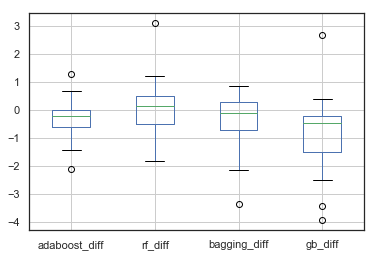

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,0.11,0.44,-0.18,-0.22,0.36
1,-0.72,-1.8,0.06,0.37,-0.11
2,-0.073,-0.84,-0.72,-4,0.22
3,-1.4,-0.67,-1.4,-0.58,0.065
4,0.1,0.64,-0.12,-0.47,-0.34
5,-0.94,-0.069,0.86,-1.1,-1.2
6,-0.26,0.64,-0.41,-0.88,-0.26
7,-0.63,3.1,-3.4,-1.7,-0.6
8,-0.0083,-0.88,-0.00058,-1.3,-0.41
9,-0.58,-1.1,0.28,-2.1,0.22


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.918767,1.02995,2.29114,2.10787,1.15924,0.943274,1.47874,1.83553,1.80415,2.24669
1,2.23685,1.52024,2.33587,2.39576,1.12229,1.49438,1.45662,1.34682,4.18438,2.35701
2,2.61785,2.54502,2.88769,2.16372,5.71582,1.76248,1.47602,1.69631,2.99544,2.15221
3,3.4144,1.98827,4.35613,2.95155,2.32269,1.73829,0.775186,0.839949,3.56527,2.89684
4,2.71188,2.81515,3.28356,3.164,2.31661,1.84564,1.88584,1.54968,2.66914,3.31144
5,3.29483,2.35633,2.02138,2.88227,3.13234,1.99196,3.79192,2.57932,2.7328,2.66369
6,4.43479,4.17896,4.48985,4.07734,4.82463,3.94112,3.01641,2.75994,3.58824,4.22436
7,10.593,9.96221,13.3558,9.9954,11.548,9.87319,8.0535,7.45382,6.71913,9.82406
8,2.33441,2.3261,2.40386,2.40328,3.20024,1.85069,2.71593,2.31035,3.40687,2.52721
9,2.53641,1.9581,2.04992,2.32549,3.81978,1.731,1.25722,1.4778,3.28545,2.19627


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

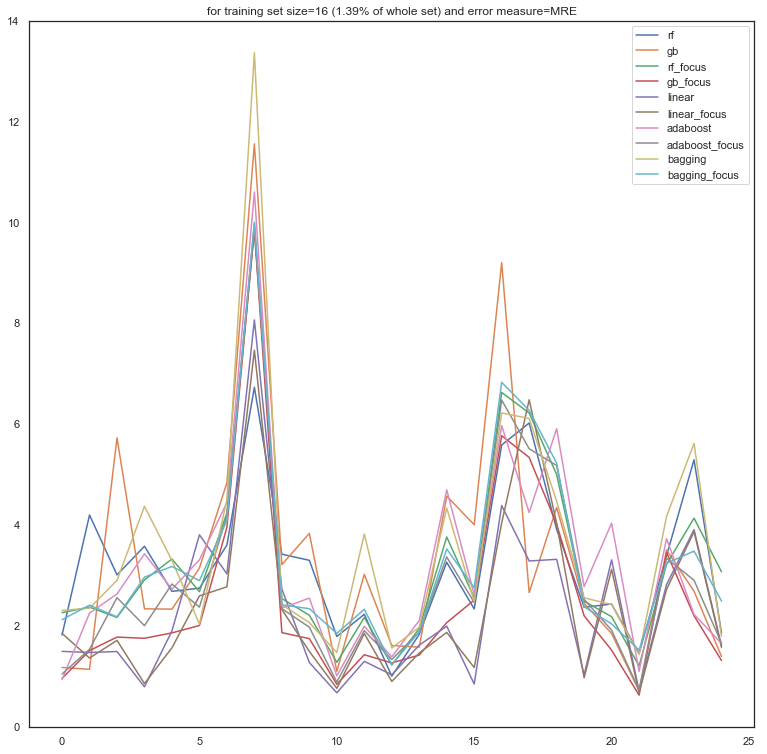

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


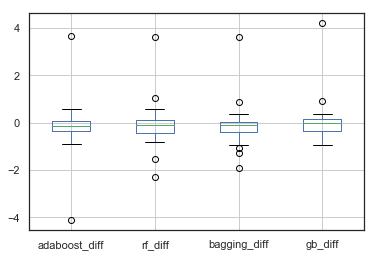

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,-0.056,-0.076,-0.084,0.021,-0.018
1,0.2,-0.064,-0.31,-0.18,-0.32
2,0.57,-0.19,-0.13,0.34,-0.084
3,-0.16,-0.6,-0.36,-0.05,0.034
4,-0.17,-0.052,-0.94,-0.1,-0.45
5,-0.88,-0.81,-0.44,-0.61,-0.33
6,-0.44,0.37,-0.41,0.92,-0.31
7,-4.1,-2.3,-1.9,-0.56,-1.2
8,-0.18,-0.12,0.029,0.058,-0.076
9,-0.32,-0.29,-0.043,-0.52,0.28


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.839495,0.783475,0.779848,0.695389,0.64025,0.661354,1.15089,1.13271,0.761421,0.685809
1,1.02103,1.22406,1.39618,1.08284,0.903071,0.724508,1.32148,0.99701,1.1437,1.0795
2,1.7464,2.31713,2.30505,2.17984,1.33028,1.67337,1.36071,1.27712,2.21402,2.02739
3,1.46218,1.30111,1.39637,1.03438,1.06942,1.01965,0.659526,0.693365,1.64169,1.04428
4,1.94408,1.77092,2.15272,1.21182,0.934942,0.833439,1.82605,1.37368,1.38183,1.32957
5,2.4909,1.6071,1.59393,1.15887,1.11898,0.506949,2.28252,1.95612,2.2154,1.40507
6,3.5021,3.05947,3.42957,3.02002,1.64996,2.57362,2.43585,2.13049,2.73683,3.1113
7,9.63295,5.50346,7.25874,5.32758,3.90269,3.34406,6.53402,5.31324,8.19993,5.91236
8,1.93486,1.75215,1.75251,1.78179,1.37337,1.43176,1.77382,1.69735,1.99624,1.87283
9,1.87834,1.55567,1.39749,1.35473,1.64805,1.12317,0.948612,1.23103,1.60898,1.3161


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

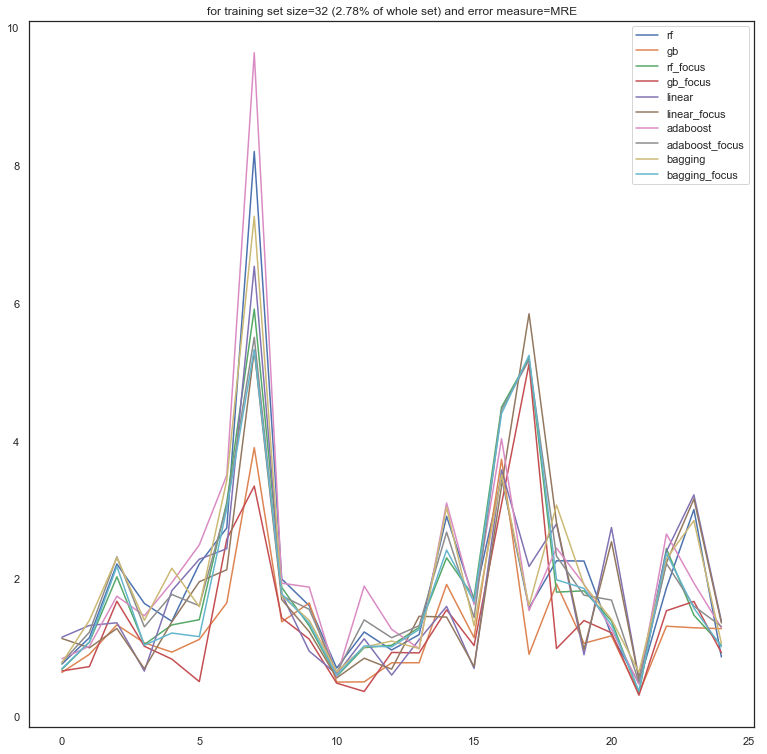

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


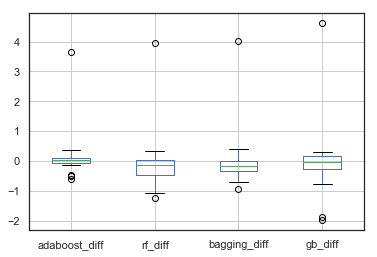

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,-0.024,0.029,-0.06,0.18,0.077
1,0.089,-0.061,-0.13,-0.27,-0.12
2,-0.006,-0.33,-0.35,-0.64,-0.055
3,0.023,-0.28,-0.19,-0.016,-0.05
4,0.11,-0.86,-0.15,-0.24,-0.031
5,-0.045,-0.31,0.11,0.15,-0.12
6,0.1,-0.059,-0.49,-0.77,0.0079
7,-0.51,-1,-0.58,-1.9,-1.6
8,0.081,0.072,-0.2,-0.37,0.0044
9,0.12,0.091,0.079,0.012,0.38


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.799052,0.774714,0.753081,0.692778,0.413879,0.590073,1.12062,1.19786,0.657042,0.686327
1,0.953389,1.04277,0.902123,0.77338,0.669063,0.396477,1.08436,0.967424,0.818957,0.75819
2,1.53691,1.53095,1.54122,1.18965,1.48253,0.838486,1.29711,1.24177,1.56177,1.2351
3,1.16717,1.18995,1.12551,0.936976,0.715547,0.699796,0.719626,0.669858,1.23262,0.949478
4,1.48928,1.59894,1.11054,0.958385,0.750993,0.515451,1.36576,1.33505,1.77921,0.921698
5,1.39511,1.35017,1.00272,1.1105,0.439495,0.588604,1.97922,1.86402,1.40779,1.09847
6,2.30647,2.40621,2.26004,1.76925,1.78572,1.01123,2.10324,2.11113,1.85985,1.80041
7,5.8698,5.35595,4.92437,4.33985,3.93626,2.0665,6.35644,4.7315,5.25399,4.23435
8,1.43681,1.51803,1.40145,1.2006,1.30131,0.929074,1.67737,1.68179,1.1169,1.18884
9,1.45398,1.57826,1.27096,1.35034,1.08526,1.09721,0.889459,1.26627,1.26489,1.35618


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

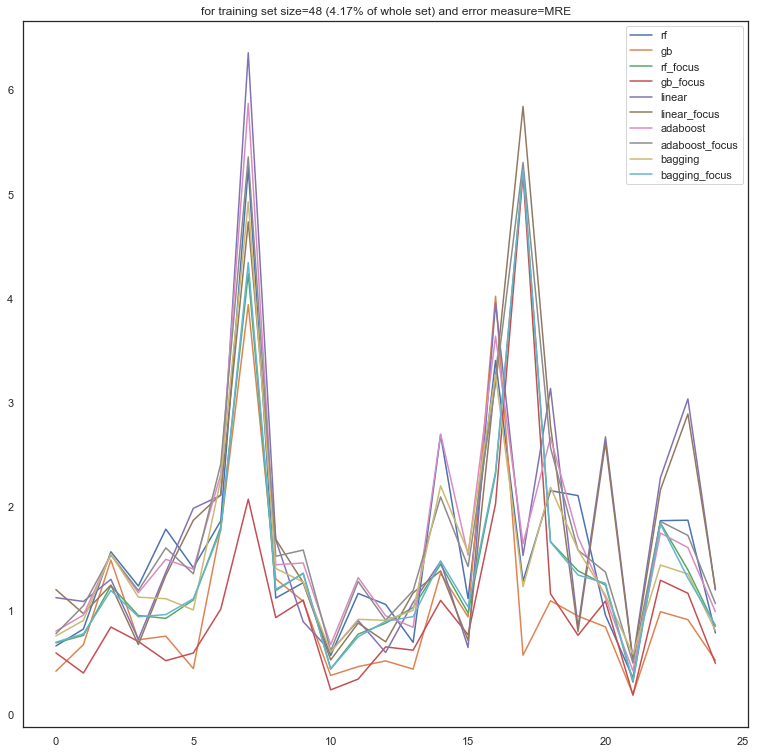

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


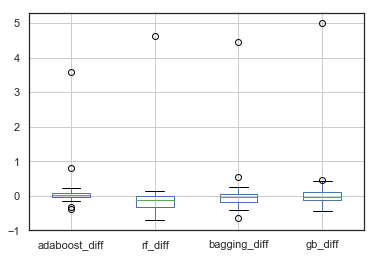

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,-0.0039,0.14,0.05,0.24,0.043
1,0.08,-0.0062,-0.014,-0.13,-0.11
2,-0.16,0.0098,-0.64,-0.13,-0.077
3,0.014,-0.065,-0.19,-0.079,-0.033
4,-0.035,-0.38,-0.044,-0.2,-0.064
5,0.074,0.031,-0.38,0.04,0.063
6,0.13,-0.52,0.061,0.1,-0.12
7,0.81,-0.71,0.54,0.47,-0.27
8,-0.11,-0.2,-0.22,-0.25,-0.06
9,0.028,-0.017,0.25,0.43,0.41


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.701234,0.697339,0.61794,0.667562,0.340256,0.577697,1.09255,1.13531,0.522915,0.659472
1,0.939325,1.0191,0.733417,0.719318,0.481818,0.348585,1.08642,0.971426,0.742052,0.73583
2,1.5965,1.43886,1.75519,1.11588,0.804256,0.675663,1.33433,1.25756,1.10618,1.11601
3,1.15139,1.16526,1.06208,0.874355,0.620194,0.54168,0.693225,0.660711,0.916355,0.85149
4,1.39231,1.35742,0.800191,0.756306,0.517516,0.322337,1.44516,1.38088,1.12961,0.751958
5,1.16765,1.24206,1.14391,0.765093,0.37662,0.416786,1.89757,1.96023,0.736019,0.766759
6,2.46726,2.60203,1.65922,1.72015,0.786731,0.88652,2.14083,2.01804,2.27653,1.75572
7,4.87648,5.68873,3.21996,3.76087,1.30236,1.77205,4.90504,4.63694,4.23547,3.52496
8,1.69302,1.58527,1.28795,1.07071,0.926388,0.677674,1.75375,1.69364,1.23839,1.04027
9,1.43412,1.46246,0.981125,1.22646,0.500415,0.929491,0.840837,1.2494,1.26233,1.24572


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

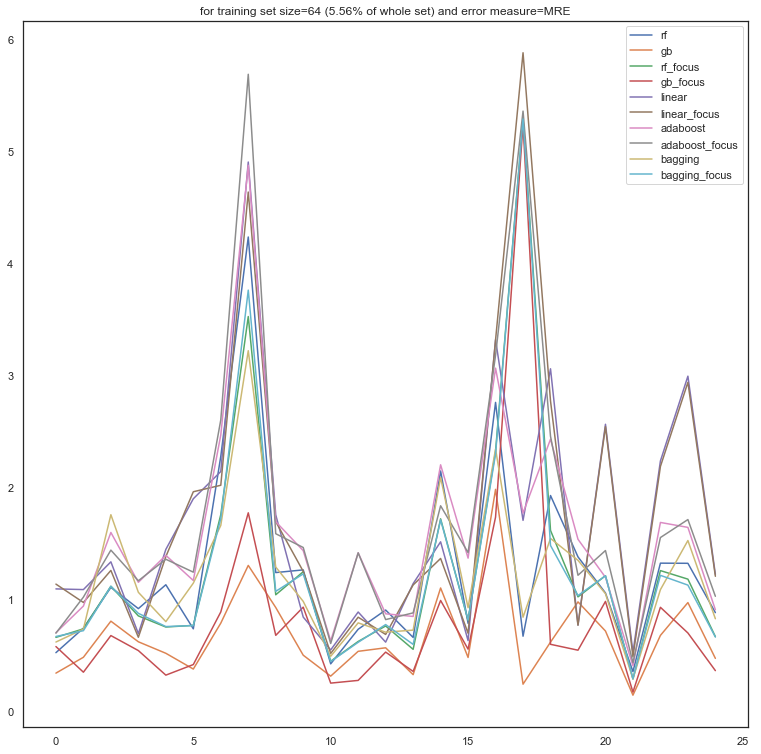

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


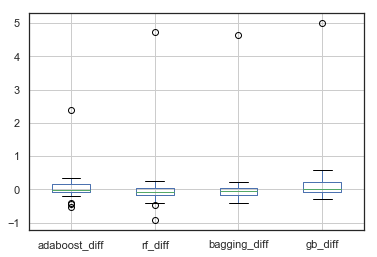

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,-0.02,0.19,0.2,0.35,0.022
1,-0.0062,-0.019,-0.053,-0.2,-0.08
2,-0.094,-0.14,-0.21,-0.07,-0.076
3,-0.039,-0.11,-0.16,-0.012,-0.016
4,-0.53,-0.16,0.032,-0.13,0.0041
5,0.077,0.056,-0.25,0.2,-0.13
6,0.25,-0.3,-0.015,0.057,-0.12
7,0.34,-0.94,-0.38,0.29,-0.03
8,0.21,0.089,-0.13,-0.31,-0.086
9,0.25,-0.12,0.23,0.57,0.38


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.70936,0.689338,0.46966,0.667249,0.241074,0.590434,1.10762,1.12929,0.486759,0.675053
1,0.990276,0.984077,0.748468,0.695352,0.446798,0.244581,1.04988,0.969994,0.702578,0.683297
2,1.5399,1.44607,1.19911,0.990234,0.746139,0.67654,1.31907,1.24344,1.08673,0.947021
3,1.13615,1.09727,0.967174,0.805032,0.502944,0.490848,0.676698,0.660935,0.888969,0.776101
4,1.90902,1.37539,0.638686,0.670319,0.49704,0.368899,1.38098,1.38509,0.821338,0.662697
5,1.23621,1.3137,0.885527,0.635028,0.20762,0.407196,2.05513,1.92904,0.5522,0.608403
6,2.49905,2.75339,1.57013,1.55509,0.722925,0.779752,2.12168,2.0009,1.80343,1.50795
7,5.42815,5.77153,3.35872,2.97542,1.06071,1.3543,4.63225,4.60249,3.76254,2.82634
8,1.29249,1.49835,1.11663,0.988992,0.920992,0.615176,1.74815,1.66196,0.908843,0.997475
9,1.17537,1.42917,0.857155,1.09191,0.332949,0.905666,0.88742,1.26674,1.23615,1.1208


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

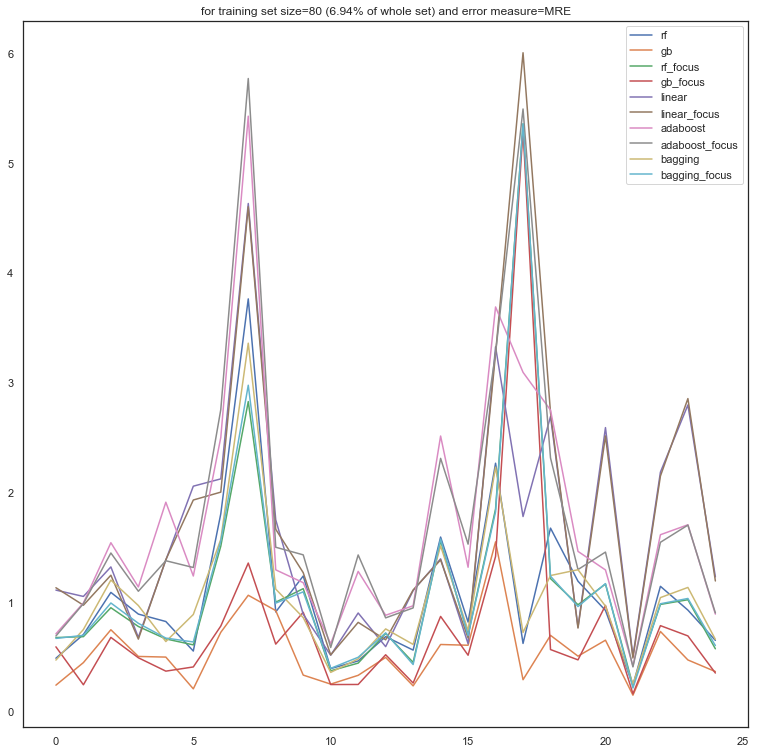

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


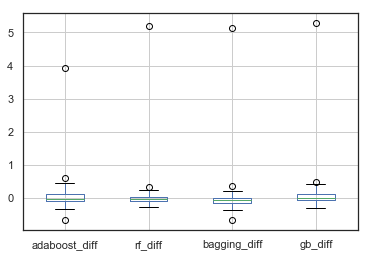

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,0.17,0.23,0.2,0.42,0.061
1,-0.023,-0.13,-0.082,-0.036,0.01
2,-0.02,-0.089,-0.21,0.0096,-0.026
3,-0.054,-0.018,-0.064,0.15,0.031
4,-0.13,-0.072,-0.13,-0.085,0.031
5,-0.17,-0.26,-0.1,0.011,-0.034
6,0.14,0.13,-0.35,-0.08,-0.085
7,-0.33,0.012,-0.65,-0.3,0.16
8,-0.063,-0.068,-0.13,-0.071,-0.031
9,0.44,0.2,0.17,0.44,0.42


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.518866,0.685954,0.46342,0.667877,0.165319,0.583048,1.11629,1.17754,0.435302,0.665658
1,1.00851,0.985299,0.612882,0.53047,0.240432,0.204203,0.957134,0.967138,0.67228,0.541149
2,1.29706,1.27746,1.06603,0.853125,0.40539,0.415014,1.24644,1.22024,0.89252,0.803971
3,1.21461,1.16017,0.718895,0.654503,0.293409,0.443576,0.634632,0.665824,0.682357,0.664698
4,1.59645,1.46492,0.553272,0.42259,0.36642,0.281769,1.30827,1.33902,0.478135,0.405642
5,1.28512,1.11039,0.474234,0.370829,0.227857,0.238664,1.98984,1.95622,0.643915,0.382677
6,2.34415,2.48217,1.38659,1.0377,0.630841,0.550789,2.09473,2.00974,1.00352,1.13254
7,5.34847,5.01456,3.03124,2.38189,1.43454,1.13283,4.65412,4.81468,2.37615,2.38863
8,1.47785,1.41467,1.02329,0.891841,0.593719,0.522277,1.70142,1.67015,0.972182,0.904455
9,1.11148,1.55532,0.776825,0.949452,0.448355,0.888237,0.844029,1.26255,0.746067,0.947562


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

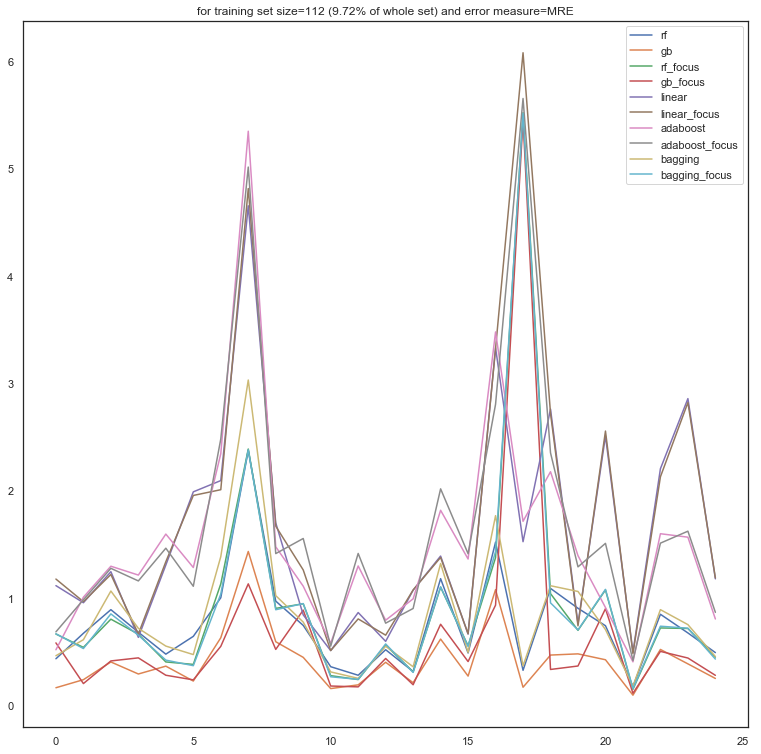

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


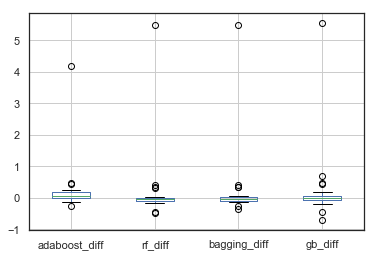

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,0.25,0.33,0.35,0.45,0.1
1,0.021,-0.11,-0.096,-0.058,-0.0024
2,-0.041,-0.16,-0.13,-0.17,-0.072
3,0.0067,-0.05,0.0092,0.043,0.044
4,0.073,-0.0086,0.0074,-0.048,0.045
5,-0.14,-0.078,-0.056,0.0032,0.16
6,0.17,-0.057,-0.15,-0.038,-0.058
7,-0.27,-0.47,-0.11,-0.46,-0.26
8,0.13,-0.027,-0.02,-0.11,-0.0018
9,0.25,0.4,0.42,0.68,0.43


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.488448,0.741331,0.322753,0.669275,0.155423,0.604732,1.09021,1.19121,0.341906,0.669986
1,0.952668,0.973791,0.537225,0.441221,0.209843,0.151736,0.997891,0.995479,0.555293,0.442797
2,1.30716,1.26614,0.76815,0.639124,0.390423,0.220936,1.2974,1.22529,0.787732,0.625596
3,1.16848,1.17519,0.509031,0.518208,0.310506,0.353515,0.620374,0.664845,0.560795,0.51092
4,1.47002,1.54314,0.332338,0.339721,0.21622,0.168711,1.30352,1.34845,0.340093,0.331529
5,1.24205,1.10628,0.288503,0.232794,0.180735,0.183897,1.83585,1.9927,0.301452,0.223394
6,2.46131,2.63223,0.993936,0.843985,0.500516,0.462536,2.07445,2.01606,0.914485,0.857892
7,5.75838,5.48754,1.70188,1.59463,1.07983,0.620492,5.32551,5.06223,2.05065,1.5772
8,1.29883,1.43237,0.835381,0.815549,0.528253,0.419571,1.67597,1.67418,0.835544,0.808215
9,1.17776,1.42775,0.526504,0.942945,0.22667,0.905296,0.820297,1.24947,0.540383,0.943757


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

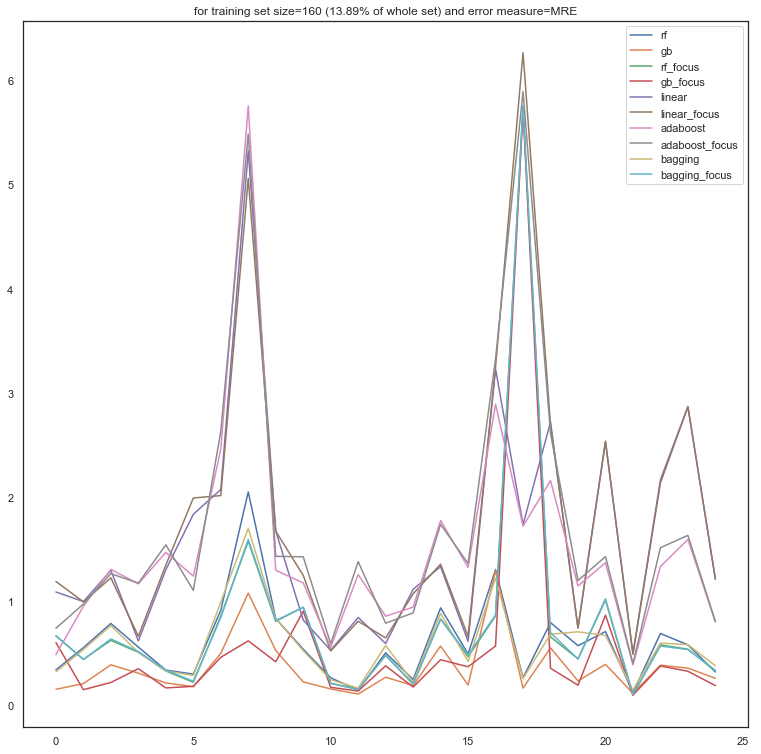

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


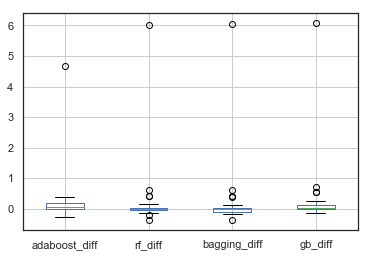

,adaboost_diff,rf_diff,bagging_diff,gb_diff,linear_diff
0,0.29,0.41,0.38,0.54,0.098
1,0.036,-0.063,-0.028,-0.027,0.0085
2,0.18,-0.14,-0.15,-0.088,-0.0047
3,0.056,0.078,0.078,0.12,0.028
4,0.13,-0.0088,-0.00049,-0.026,-0.074
5,-0.042,0.023,-0.014,0.049,-0.00036
6,-0.15,-0.11,-0.19,-0.048,-0.02
7,0.18,-0.39,-0.37,-0.13,0.18
8,0.24,-0.033,-0.062,-0.0084,-0.0079
9,0.37,0.6,0.62,0.71,0.43


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


,adaboost,adaboost_focus,bagging,bagging_focus,gb,gb_focus,linear,linear_focus,rf,rf_focus
0,0.475077,0.76546,0.293046,0.676308,0.11072,0.645842,1.10211,1.19987,0.270039,0.679375
1,0.938768,0.9743,0.309077,0.281444,0.211279,0.184277,0.954849,0.963384,0.342942,0.280093
2,1.1878,1.37263,0.622024,0.470802,0.30849,0.220839,1.24644,1.24171,0.620557,0.478925
3,1.12541,1.18162,0.376374,0.454107,0.235676,0.352385,0.634426,0.662431,0.376243,0.453875
4,1.44084,1.57091,0.246185,0.245693,0.195876,0.169907,1.40339,1.32967,0.251778,0.242971
5,1.22447,1.18228,0.228344,0.214038,0.146709,0.196048,1.94732,1.94696,0.190446,0.212999
6,2.75269,2.60661,0.779711,0.585395,0.419482,0.371753,2.04412,2.02409,0.704796,0.596517
7,5.45048,5.62964,1.11299,0.740178,0.549342,0.414844,4.76478,4.94002,1.11904,0.73078
8,1.21808,1.45811,0.708788,0.646323,0.412634,0.404215,1.67957,1.67164,0.684302,0.651507
9,1.08945,1.46347,0.343305,0.958873,0.262291,0.970153,0.840062,1.27248,0.360793,0.961068


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


<Figure size 432x288 with 0 Axes>

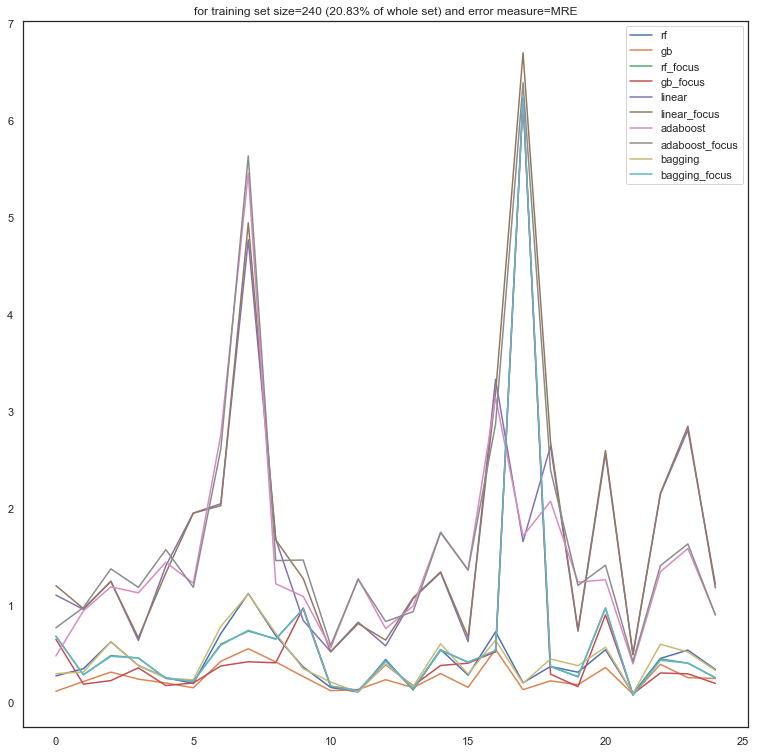

In [34]:
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor

# predDimension: either size or elapsedtime 
# features to focus (for linear regression says)
# TODO: ftsToFocus seems deprecated!
def noTransferBetweenVideosLinear(v1ID, perc, ftsToFocus, learningStrategy, focusSampling=[]):
    vSource = listeVideo[v1ID].copy()
    
    vCleanSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1)


    if (len(focusSampling) > 0):
        x_target_train, x_target_test, y_target_train, y_target_test = ftfocus_train_test_split(v1ID, perc, focusSampling)
    else: # focusSamplig == 0 (ie no focus)
        x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource, 
                                                       vSource[predDimension], test_size=perc, random_state=None)
        #x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource[ftsToFocus], 
        #                                               vSource[predDimension], test_size=perc, random_state=None)
  


    n_degree = mkDegree(learningStrategy)
    polynomial_features = PolynomialFeatures(degree=n_degree)
    linear_regression = LinearRegression()
    regr = Pipeline([("polynomial_features", polynomial_features),
                     ("linear_regression", linear_regression)])
    regr.fit(x_target_train, y_target_train)
        

    y_target_pred = regr.predict(x_target_test)
    mseMLTarget, r2MLTarget, mreMLTarget, maeMLTarget = evalPrediction(y_target_test, y_target_pred)
    return {LearningError.MSE: mseMLTarget, LearningError.R2: r2MLTarget, LearningError.MRE: mreMLTarget, LearningError.MAE: maeMLTarget}


def mkRandomForestWithCV(): 
    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start = 100, stop = 300, num = 5)]
    # Number of features to consider at every split
    max_features = ['auto', 'sqrt']
    # Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
    max_depth.append(None)
    # Minimum number of samples required to split a node
    min_samples_split = [2, 5, 10]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1, 2, 4]
    # Method of selecting samples for training each tree
    bootstrap = [True, False]

    # Set the parameters by cross-validation
    tuned_parameters = {'n_estimators': n_estimators,
                 #  'max_features': max_features,
                   'max_depth': max_depth,
                 #  'min_samples_split': min_samples_split,
                 #  'min_samples_leaf': min_samples_leaf,
                   'bootstrap': bootstrap}

    score = 'r2'
    clf = GridSearchCV(RandomForestRegressor(), tuned_parameters, cv=5, scoring='%s' % score, iid=False)
    return clf 


# withCV means with cross validation and hyperparameter tuning 
def mk_learning_algorithm(algo_name, withCV, nEstimators=100):
    if (algo_name == "rf"):
        if (withCV):
            clf = mkRandomForestWithCV()
        else:
            clf = RandomForestRegressor(n_estimators=nEstimators)
    elif (algo_name == "gb"):
        clf = GradientBoostingRegressor(n_estimators=nEstimators) # , learning_rate=0.1, max_depth=1, random_state=0, loss='ls')
    elif (algo_name == "boost"):
        clf = AdaBoostRegressor(n_estimators=nEstimators) # , learning_rate=0.1, max_depth=1, random_state=0, loss='ls')
    elif (algo_name == "bagging"):
        clf = BaggingRegressor(n_estimators=nEstimators)
    elif (algo_name == "svm"):
        print("deprecated") # hard to tune hyperparams and SVM is mostly interesting for classification (we prefer to give up with this algo)
        pass
#        clf = SVR(kernel='rbf', gamma='scale') # SVR(kernel='poly', degree=2)# C=1, 
#        if (predDimension == "size"):
#            clf = SVR(kernel='rbf', gamma='scale', C=1e7) #TODO
    else:
        print("Unknown learning method " + algo_name)
        return None
    return clf 
        #    RandomForestRegressor(n_estimators=nRF)
    
    
# predDimension: either size or elapsedtime 
# TODO: hyper-parameterizations
def noTransferBetweenRF(v1ID, perc, lMethod="rf", focusSampling=[], withCV=False):
    vSource = listeVideo[v1ID].copy()
    
    vCleanSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1)

    
    if (len(focusSampling) > 0):
        x_target_train, x_target_test, y_target_train, y_target_test = ftfocus_train_test_split(v1ID, perc, focusSampling)
    else: # focusSamplig == 0 (ie no focus)
        x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource, vSource[predDimension], test_size=perc, random_state=None)
  
    clfTarget = mk_learning_algorithm(lMethod, withCV)   

    clfTarget.fit(x_target_train, y_target_train)
 

    y_target_pred = clfTarget.predict(x_target_test)
    mseMLTarget, r2MLTarget, mreMLTarget, maeMLTarget = evalPrediction(y_target_test, y_target_pred)
    
    
    
    return {LearningError.MSE: mseMLTarget, LearningError.R2: r2MLTarget, LearningError.MRE: mreMLTarget, LearningError.MAE: maeMLTarget}

nVideo = len(listeVideo)
# TODO: 100 refers to n_estimators 
ml_algo_names = ["rf", "gb", "rf_focus", "gb_focus", #"rf_tuned", 
                    "linear", 
                    # "linear_poly2", # "linear_poly3",
                             "linear_focus", 
                            # "linear_poly2_focus", # "linear_poly3_focus", 
                             "adaboost", "adaboost_focus", "bagging", "bagging_focus" # , "svmr", "svmr_focus"
                            ]



if (predDimension == "elapsedtime"):
    ftfocussampling = ['no_weightb'] # ['no_weightb'] # ['no_deblock'] # 'no_weightb', 'no_deblock' is also a strong candidate but has little effect
elif(predDimension == "size"):
    ftfocussampling = ['no_weightb'] #, ['no_fast_pskip'] is also a strong candidate # 
else:
    raise RuntimeError("Impossible case")





N_REPEAT_PRE = 1
for ni in Nf:
    perc = ((1152 - N*ni) / 1152)  # says
    # perc = ((1152 - ((N*ni) / 2)) / 1152)  # says
    errorMeasure=LearningError.MRE
    lreg = pd.DataFrame(columns=ml_algo_names)
    for vID in range(nVideo):
        # focusSampling actually removes uninteresting features (~zero effect)
        res = {'rf': np.mean([noTransferBetweenRF(vID, perc, "rf")[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         #'rf_tuned' : np.mean([noTransferBetweenRF(vID, perc, "rf", withCV=True)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'gb' : np.mean([noTransferBetweenRF(vID, perc, "gb")[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'rf_focus': np.mean([noTransferBetweenRF(vID, perc, "rf", ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'gb_focus' : np.mean([noTransferBetweenRF(vID, perc, "gb", ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'linear': np.mean([noTransferBetweenVideosLinear(vID, perc, allPossibleFts, TransferLearningStrategy.REGLIN_POLY1)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
       #  poly 2 is too unstable
       #  'linear_poly2': np.mean([noTransferBetweenVideosLinear(vID, perc, allPossibleFts, TransferLearningStrategy.REGLIN_POLY2)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
       #  'linear_poly3': np.mean([noTransferBetweenVideosLinear(vID, perc, allPossibleFts, TransferLearningStrategy.REGLIN_POLY3)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'linear_focus': np.mean([noTransferBetweenVideosLinear(vID, perc, allPossibleFts, TransferLearningStrategy.REGLIN_POLY1, ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
       #  'linear_poly2_focus': np.mean([noTransferBetweenVideosLinear(vID, perc, allPossibleFts, TransferLearningStrategy.REGLIN_POLY2, ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
       #  'linear_poly3_focus': np.mean([noTransferBetweenVideosLinear(vID, perc, allPossibleFts, TransferLearningStrategy.REGLIN_POLY3, ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
          'adaboost': np.mean([noTransferBetweenRF(vID, perc, "boost")[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'adaboost_focus': np.mean([noTransferBetweenRF(vID, perc, "boost", ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'bagging': np.mean([noTransferBetweenRF(vID, perc, "bagging")[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
         'bagging_focus': np.mean([noTransferBetweenRF(vID, perc, "bagging", ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
        # 'svmr': np.mean([noTransferBetweenRF(vID, perc, "svm")[errorMeasure] for nReap in range(N_REPEAT_PRE)]),
        # 'svmr_focus': np.mean([noTransferBetweenRF(vID, perc, "svm", ftfocussampling)[errorMeasure] for nReap in range(N_REPEAT_PRE)])
        }
        lreg = lreg.append(res, ignore_index=True)
#    lreg.append({"with RF" : rfreg[LearningError.MAE], "with linear": lnreg[LearningError.MAE]})
    # res = [rfreg100, rf_tuned, gbreg100, rfregFoc100, gbregFoc100, lnreg, lnreg2, lnreg3, lnregFoc100, lnreg2Foc100, lnreg3Foc100, adaboost, adaboostFoc, baggingreg100, baggingreg100Foc, svmreg, svmregfoc]
#        lreg.loc[vID] = res

    #for v1ID in range(nVideo):
     #   for l in [LearningError.MAE]:
      #      rfReg[vID][l]
    lreg_with_diff = lreg.copy() 
    lreg_with_diff['adaboost_diff'] = lreg_with_diff['adaboost_focus'] - lreg_with_diff['adaboost']
    lreg_with_diff['rf_diff'] = lreg_with_diff['rf_focus'] - lreg_with_diff['rf']
    lreg_with_diff['bagging_diff'] = lreg_with_diff['bagging_focus'] - lreg_with_diff['bagging']
    # lreg_with_diff['svmr_diff'] = lreg_with_diff['svmr_focus'] - lreg_with_diff['svmr']    
    lreg_with_diff['gb_diff'] = lreg_with_diff['gb_focus'] - lreg_with_diff['gb']
    lreg_with_diff['linear_diff'] = lreg_with_diff['linear_focus'] - lreg_with_diff['linear']
    #lreg_with_diff['linear_poly2_diff'] = lreg_with_diff['linear_poly2_focus'] - lreg_with_diff['linear_poly2']    
    #lreg_with_diff['linear_poly3_diff'] = lreg_with_diff['linear_poly3_focus'] - lreg_with_diff['linear_poly3']
    
    # 
    plt.figure() 
    lreg_with_diff[list(filter (lambda v: v.endswith("_diff") and not v.startswith("linear"), lreg_with_diff.columns.values))].boxplot() # plot.bar()    
    plt.savefig("focuseffect_diff_" + str(ni * N) + "_" + str(errorMeasure.name) + "-" + predDimension + ".pdf")
    plt.show() 
    
    # applymap(color_negative)
    html_lreg_with_diff = lreg_with_diff[list(filter (lambda v: v.endswith("_diff"), lreg_with_diff.columns.values))].style.set_caption("Focus vs not focued: summary of differences of learning strategies (sampling size " + str(ni * N) + ") (error " + str(errorMeasure.name) + ")").set_precision(2).set_properties(**{'font-size': '14pt'}).bar(align='mid', color=['#d65f5f', '#5fba7d']).render()
    display(HTML(html_lreg_with_diff))
    imgkit.from_string(html_lreg_with_diff, "focuseffect_diffbar_" + str(ni * N) + "_" + str(errorMeasure.name) + "-" + predDimension + ".png")
    #lreg_with_diff[list(filter (lambda v: v.endswith("_diff") and not v.startswith("linear"), lreg_with_diff.columns.values))].boxplot(figsize=(10, 10))
    
    html_lreg = lreg.reindex(sorted(lreg.columns), axis=1).style.set_caption("Summary of learning strategies (sampling size " + str(ni * N) + ") (error " + str(errorMeasure.name) + ")").background_gradient(cmap=sns.light_palette("green", as_cmap=True), axis=1).highlight_min(axis=1).render()
    display(HTML(html_lreg))
    imgkit.from_string(html_lreg, "focuseffect_" + str(ni * N) + "_" + str(errorMeasure.name) + "-" + predDimension + ".png")
  
    
    plt.figure()
    pd.DataFrame(lreg).plot(figsize=(13, 13), title="for training set size=" + str(ni * N) + " (" + str(round((1 - perc) * 100, 2)) + "% of whole set) and error measure=" + str(errorMeasure.name))
    plt.savefig("focuseffect_evo_" + str(ni * N) + "_" + str(errorMeasure.name) + "-" + predDimension + ".pdf")    
    plt.show()

In [35]:
# lreg_with_diff[list(filter (lambda v: v.endswith("_diff") and not v.startswith(("linear")), lreg_with_diff.columns.values))].boxplot() # transpose().plot.barh(color="blue", legend=False)   

,DiffPerfTopvs100
0,2.971978
1,3.780987
2,7.915282
3,3.646684
4,2.657403
5,1.105986
6,8.998776
7,18.238027
8,7.622395
9,4.365644


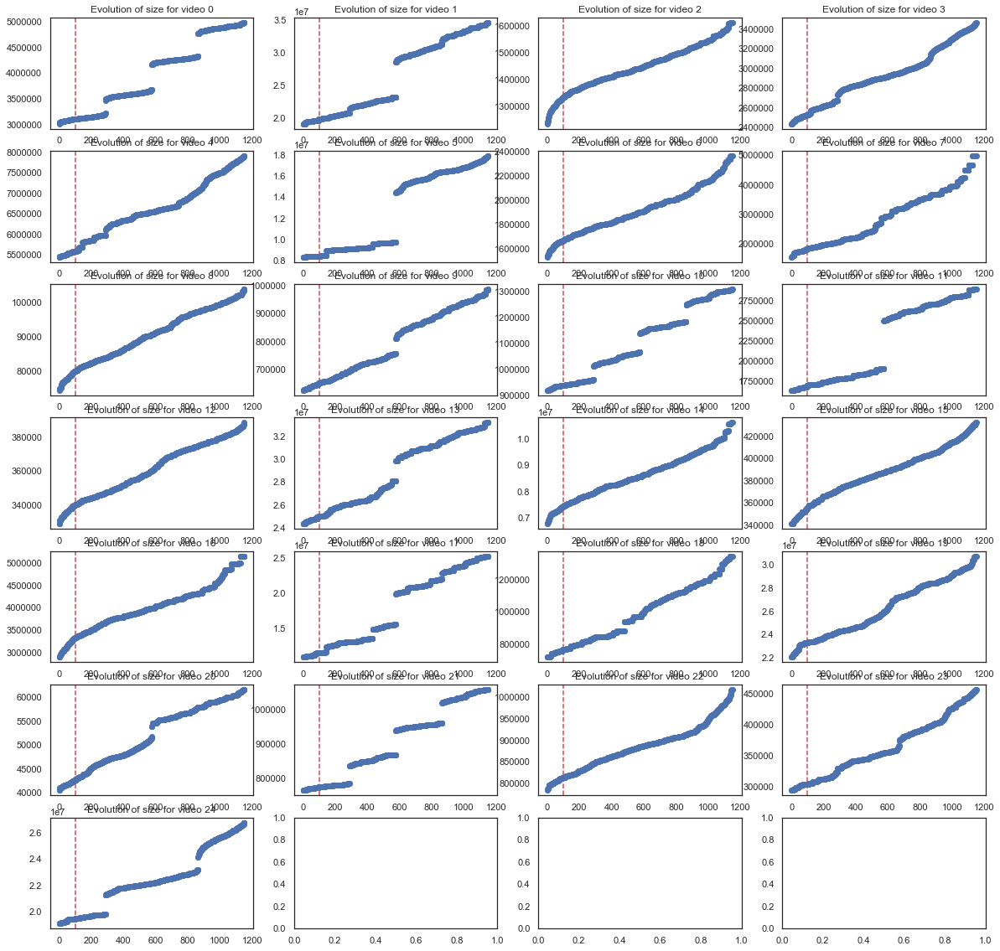

In [36]:
# difference between top performance of the optimal configuration (rank 1) and Xth (eg X=100)
topX=100
diffPerfs = pd.DataFrame(columns=["DiffPerfTopvs" + str(topX)])
nCols=4
nRows=round(len(listeVideo) / nCols) + 1
fig, ax = plt.subplots(nRows, nCols,figsize=(20, 20))
for vid in range(len(listeVideo)):
    perfsVid = listeVideo[vid][predDimension]
    perfsSorted = perfsVid.sort_values()
    diffPerf = ((perfsSorted.iloc[topX-1] * 100) / perfsSorted.iloc[0]) - 100
    diffPerfs.loc[vid] = diffPerf
    #plt.figure()
    if (vid == 0):
        cax=ax[0, 0]
    else:
        cax=ax[math.trunc(vid / nCols), (vid % nCols)]
    cax.axvline(topX-1, color='r', linestyle='--')
    perfsSorted.plot(style="o",use_index=False,title="Evolution of " + predDimension + " for video " + str(vid),ax=cax)
    #plt.show()
    #TODO: subplotting
    
diffPerfs

#plt.figure()
#listeVideo[1][predDimension].sort_values().iloc[100]

#.plot(style="o",use_index=False)#.sort_values()
#sVideo['Rank'] = sVideo.rank() #.plot(style="o")
#pd.DataFrame(sVideo) #[["Rank", predDimension]]
#plt.show()
#listeVideo[0].sort_values(by=[predDimension])[predDimension].iloc[0]

In [37]:
MOCTETS = 1048576
svid = pd.DataFrame(columns=['mean size per video (Mo)'])
for i in range(len(listeVideo)):
    svid.loc[i] = np.max(listeVideo[i]['size'] / MOCTETS)
svid

,mean size per video (Mo)
0,4.746643
1,32.969499
2,1.538153
3,3.304299
4,7.546193
5,17.058892
6,2.250932
7,4.740793
8,0.099111
9,0.940598


In [38]:
# interpretable models (with polynomial learning (=2))
def linear_polynomial_learning(videoid, perc, focusSampling=[], n_degree=2, dummies=False):
    
    if (dummies):
        vSource = pd.get_dummies(listeVideo[videoid].copy(), columns=["ref", "rc_lookahead"])
    else:
        vSource = listeVideo[videoid].copy() 
    
    vCleanSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1)


    if (len(focusSampling) > 0):
        x_target_train, x_target_test, y_target_train, y_target_test = ftfocus_train_test_split(videoid, perc, focusSampling)
    else: # focusSamplig == 0 (ie no focus)
        x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource, 
                                                       vSource[predDimension], test_size=perc, random_state=None)
  


    polynomial_features = PolynomialFeatures(degree=n_degree,interaction_only=True)
    linear_regression = LinearRegression()
    regr = Pipeline([("polynomial_features", polynomial_features),
                     ("linear_regression", linear_regression)])
    regr.fit(x_target_train, y_target_train)
        

    y_target_pred = regr.predict(x_target_test)
    mseMLTarget, r2MLTarget, mreMLTarget, maeMLTarget = evalPrediction(y_target_test, y_target_pred)
    coeffs = regr.named_steps['linear_regression'].coef_
    col_names = regr.named_steps['polynomial_features'].get_feature_names(x_target_train.columns)
    coeff_per_ft = pd.DataFrame(columns=["feature", "coeff"], data=list(zip(col_names, coeffs)))
    
    return coeff_per_ft, {LearningError.MSE: mseMLTarget, LearningError.R2: r2MLTarget, LearningError.MRE: mreMLTarget, LearningError.MAE: maeMLTarget}


  
    

/usr/local/lib/python3.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


0.17406793883017824
0.23586713312530816
0.4057670932544885
0.2527234148988168
0.5960499741738345
0.5346383603342538
0.6119986336321395
3.299698146906864
0.6812338667302917
0.4669706906879476
0.12308535342682117
0.4866634582844676
0.21462038091153135
0.14892729804720561
0.8581015768829876
0.32944996179023556
2.042190352830767
0.12489000872962523
2.1764248743326404
0.5112276344696078
0.7638457892364233
0.11572670390025451
0.746719351140659
1.036431808707018
0.4766681521505789


,coeff_0,coeff_1,coeff_2,coeff_3,coeff_4,coeff_5,coeff_6,coeff_7,coeff_8,coeff_9,coeff_10,coeff_11,coeff_12,coeff_13,coeff_14,coeff_15,coeff_16,coeff_17,coeff_18,coeff_19,coeff_20,coeff_21,coeff_22,coeff_23,coeff_24
feature,,,,,,,,,,,,,,,,,,,,,,,,,
no_mbtree,1.1e+06,-9.8e+06,1.7e+05,-3.8e+05,-4.8e+05,-6.6e+06,3.9e+05,1.8e+06,2e+04,-1.8e+05,-2.2e+05,-9.2e+05,-2.4e+03,-1.3e+06,1.3e+06,-2.3e+04,7.9e+05,-9.3e+06,-2.4e+05,-8.2e+05,1.7e+04,-1.8e+05,5.6e+04,-2.4e+04,-1.9e+06
no_cabac,4.5e+05,3.2e+06,9.5e+04,3.6e+05,8.5e+05,8.6e+05,1.4e+05,5.3e+05,4.6e+03,7.4e+04,1.2e+05,1.8e+05,2.7e+04,6.2e+06,1.3e+06,2.7e+04,7.6e+05,2.9e+06,1.1e+05,4.5e+06,2.1e+03,9.8e+04,6.7e+04,4.6e+04,3.3e+06
no_cabac no_mbtree,1.7e+05,-8.8e+05,9e+03,-4.6e+04,-1.3e+05,-2.9e+05,3.3e+04,3.5e+05,3.9e+02,-8.7e+03,-1.8e+04,-5.5e+04,-7.1e+02,-2.6e+05,8.4e+04,-8e+02,1.4e+04,-9.6e+05,-1.9e+04,-2.1e+05,1.3e+03,-1.1e+04,-7.4e+03,-5.9e+03,-7.4e+05
no_deblock,3.9e+04,2.9e+05,2.2e+04,4.7e+04,1.5e+05,6.4e+04,9.4e+04,2.8e+05,1.2e+03,-2.4e+02,4.9e+03,1.5e+03,4.4e+03,3.2e+05,4.6e+05,1.5e+03,8.6e+04,5.9e+04,8e+03,8.6e+05,5e+02,4.1e+03,8.8e+03,-2.4e+03,1.2e+05
no_mbtree no_weightb,2.6e+04,4e+03,-2.6e+02,2.8e+04,-4.2e+03,-5.9e+04,9.4e+02,4e+02,2.4e+02,-1.5e+04,-2.4e+03,2.9e+03,2.2e+03,4.9e+04,-1.8e+04,4.2e+03,-1.5e+03,5.6e+05,-1.4e+03,6e+02,9.4e+02,37,1.2e+03,3.6e+02,1.1e+04
no_weightb,2.2e+04,-8.7e+03,1.2e+03,-1.8e+04,-87,4.5e+04,-5.2e+03,4.6e+03,74,1.8e+04,-4.9,25,-2.8e+02,-5.1e+04,3.9e+04,-1.2e+03,1.6e+04,9.2e+05,3.9e+02,3.1e+04,82,2.5e+02,1e+03,-6.1e+02,1.4e+04
no_fast_pskip,1.5e+04,-7.9e+02,5.7e+03,9e+03,2.1e+04,-1.5e+04,4.5e+04,5e+04,1.6e+03,24,8.3e+02,-1.7e+02,2.4e+03,3.6e+02,6.3e+04,91,8e+03,-2.7e+03,7.3e+03,8.3e+04,3.5e+02,7.4e+02,1.2e+03,6.7,1.8e+05
no_8x8dct no_mbtree,1.2e+04,3.8e+05,-1.4e+04,3.6e+04,5.5e+03,4.5e+05,-6.8e+04,-9.2e+04,-1.7e+03,-6.3e+02,3.8e+03,9.6e+03,-2.6e+02,-5.7e+04,-9.1e+03,8.6e+02,2.1e+04,2.4e+05,-1.9e+02,3.3e+04,-3.9e+02,2.6e+03,-7e+03,2.8e+03,1.2e+05
no_cabac no_weightb,1.1e+04,1.3e+04,2.2e+02,-1.8e+02,-1.9e+03,6.9e+03,7.3e+02,9.7e+02,-4.9,1.1e+03,2.6e+02,-7e+02,4.3e+02,-7.2e+03,3.6e+03,2.9e+02,-1.3e+04,4.3e+05,-1.5e+03,1e+04,-13,1.8e+02,7.7e+02,4.5e+02,-1.2e+04


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


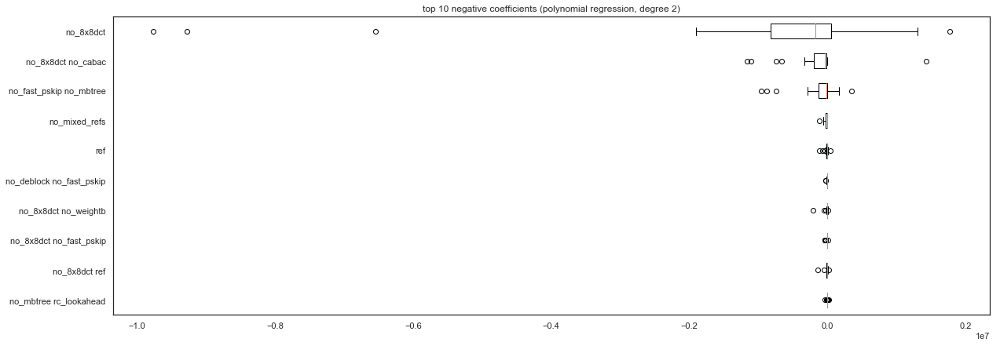

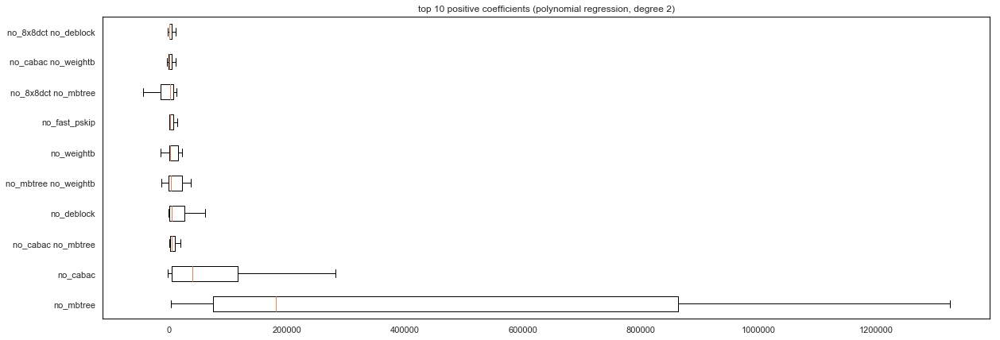

In [39]:
import seaborn as sns
from IPython.html import widgets
cm = sns.diverging_palette(5, 250, as_cmap=True) # sns.light_palette("green", as_cmap=True)# 
def safe_abs(d):
    if(d.dtype != "object"):
        return abs(d)
    else:
        return d

    #apply(safe_abs). 
    
    
#### TODO: parameterize dummies
# it's actually hard to interpret with dummies since the coefficients seem distributed in some low interactions
# also much more verbose since some features are equivalent 

all_coeffs_per_ft = pd.DataFrame(columns=["feature", "coeff"])
for vid in range(0, len(listeVideo)):
    coeff_per_ft, res = linear_polynomial_learning(videoid=vid, perc=0.3, n_degree=2, dummies=False)
    all_coeffs_per_ft  = pd.merge(all_coeffs_per_ft, coeff_per_ft, how="outer", on=['feature'], suffixes=['_' + str(vid - 1), '_' + str(vid)])
    #display(HTML(coeff_per_ft.sort_values(by="coeff").style.render()))
    print(res[LearningError.MRE])
    
    
    # apply(safe_abs).
fts_coeff_proper = all_coeffs_per_ft.drop(['coeff_-1'], axis=1).set_index("feature").sort_values(by=["coeff_" + str(x) for x in range(0, len(listeVideo))], ascending=False) #

#@widgets.interact
#def f(h_neg=(0, 359, 1), h_pos=(0, 359), s=(0., 99.9), l=(0., 99.9)):
#    return fts_coeff_proper.style.background_gradient( cmap=sns.palettes.diverging_palette(h_neg=h_neg, h_pos=h_pos, s=s, l=l,
    #                                        as_cmap=True))
        
        #cmap='viridis', axis=0)
#display(HTML(fts_coeff_proper.style.apply(high_max, axis=0).render()))
html_ftinter_freq = fts_coeff_proper.style.background_gradient(cmap=cm).set_precision(2).render()
display(HTML(html_ftinter_freq))
imgkit.from_string(html_ftinter_freq, 'featureinterfreq-polynomial-' + predDimension + '.png')
#fts_coeff_proper.set_index("feature").transpose()
N_PLOT = len(fts_coeff_proper) # ALL 
N_NEG = 10
N_POS = 10 
meds = fts_coeff_proper.transpose().median().sort_values(ascending=False)   
sorted_fts_coeff_proper = fts_coeff_proper.transpose()[meds.index]#.transpose()

plt.figure(figsize=(20, 7))
plt.boxplot(sorted_fts_coeff_proper.transpose().tail(N_NEG), vert=False) 
plt.yticks(range(1, N_POS+1), fts_coeff_proper.tail(N_NEG).index.values) 
plt.title("top " + str(N_NEG) + " negative coefficients (polynomial regression, degree 2)")
plt.savefig("polyregression-importance-topnegative-" + predDimension + ".pdf")
plt.show()

plt.figure(figsize=(20, 7))
plt.boxplot(sorted_fts_coeff_proper.transpose()[:N_POS], vert=False, showfliers=False) # [:N_PLOT]
plt.yticks(range(1, N_POS+1), fts_coeff_proper[:N_POS].index.values) # [:N_PLOT]
plt.title("top " + str(N_POS) + " positive coefficients (polynomial regression, degree 2)")
plt.savefig("polyregression-importance-toppositive-" + predDimension + ".pdf")
plt.show()
#display(HTML(.render()))



In [40]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC, SVR
from sklearn import metrics



def tune_MLalgo(v1ID, perc=30):

    vSource = listeVideo[v1ID].copy()
    vCleanSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1)

    x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource, vSource[predDimension], 
                                                                                    test_size=perc, random_state=None)



    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start = 100, stop = 200, num = 5)]
    # Number of features to consider at every split
    max_features = ['auto', 'sqrt']
    # Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
    max_depth.append(None)
    # Minimum number of samples required to split a node
    min_samples_split = [2, 5, 10]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1, 2, 4]
    # Method of selecting samples for training each tree
    bootstrap = [True, False]

    # Set the parameters by cross-validation
    tuned_parameters = {'n_estimators': n_estimators,
                   #'max_features': max_features,
                   #'max_depth': max_depth,
                   #'min_samples_split': min_samples_split,
                   'min_samples_leaf': min_samples_leaf,
                   'bootstrap': bootstrap}

    scores = ['r2'] # 'neg_mean_squared_error', 

    for score in scores:
        print("# Tuning hyper-parameters for %s" % score)
        print()

        clf = GridSearchCV(RandomForestRegressor(), tuned_parameters, cv=5,
                           scoring='%s' % score)
        clf.fit(x_target_train, y_target_train)

        print("Best parameters set found on development set:")
        print()
        print(clf.best_params_)
        print()
        #print("Grid scores on development set:")
        #print()
        #means = clf.cv_results_['mean_test_score']
        #stds = clf.cv_results_['std_test_score']
        #for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        #    print("%0.3f (+/-%0.03f) for %r"
        #          % (mean, std * 2, params))
        #print()

        #print("Detailed classification report:")
        #print()
        #print("The model is trained on the full development set.")
        #print("The scores are computed on the full evaluation set.")
        #print()
        y_true, y_pred = y_target_test, clf.predict(x_target_test)
        print(r2_score (y_true, y_pred))
        print("best (MRE, testing set)", mean_relative_error (y_true, y_pred))
        
        worst_test_score = clf.cv_results_['mean_test_score'].argmin()
        worst_params =  clf.cv_results_['params'][worst_test_score]
        print("worst params: ", worst_params)
        rf_worst = RandomForestRegressor() 
        rf_worst.set_params(**worst_params)
        rf_worst.fit(x_target_train, y_target_train)
        y_pred = rf_worst.predict(x_target_test)
        print("worst (MRE, testing set)", mean_relative_error (y_true, y_pred))        


#for vid in range(0, len(listeVideo)):
 #   tune_MLalgo(v1ID=vid, perc=90)

In [41]:
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_validate

def noTransferBetweenVideosLinear2(v1ID, perc, ftsToFocus, learningStrategy, focusSampling=[], repeat_cv=2):
    vSource = listeVideo[v1ID].copy()
    
    vCleanSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1)


    if (len(focusSampling) > 0):
        x_target_train, x_target_test, y_target_train, y_target_test = ftfocus_train_test_split(v1ID, perc, focusSampling)
    else: # focusSamplig == 0 (ie no focus)
        x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource, 
                                                       vSource[predDimension], test_size=perc, random_state=None)
        #x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource[ftsToFocus], 
        #                                               vSource[predDimension], test_size=perc, random_state=None)
  


    # print (x_target_train.shape, "vs", x_target_test.shape)
    n_degree = mkDegree(learningStrategy)
    polynomial_features = PolynomialFeatures(degree=n_degree)
    linear_regression = LinearRegression()
    regr = Pipeline([("polynomial_features", polynomial_features),
                     ("linear_regression", linear_regression)])
    
    
    #regr.fit(x_target_train, y_target_train)
    #y_target_pred = regr.predict(x_target_test)
    #mseMLTarget, r2MLTarget, mreMLTarget, maeMLTarget = evalPrediction(y_target_test, y_target_pred)
    scorer = {  'MSE' : make_scorer(mean_squared_error),
                               'R2' : make_scorer(r2_score),   
                'MRE' : make_scorer(mean_relative_error),                   
                'MAE' : make_scorer(mean_absolute_error), 
                  
                 } 
    scores = cross_validate(regr, x_target_train, y_target_train, cv=repeat_cv, scoring=scorer)   
    mseMLTarget, r2MLTarget, mreMLTarget, maeMLTarget = np.mean(scores['test_MSE']), np.mean(scores['test_R2']), np.mean(scores['test_MRE']), np.mean(scores['test_MAE'])
    return {LearningError.MSE: mseMLTarget, LearningError.R2: r2MLTarget, LearningError.MRE: mreMLTarget, LearningError.MAE: maeMLTarget}


#perc = 30
[noTransferBetweenVideosLinear2(1, 0.9861, allPossibleFts, TransferLearningStrategy.REGLIN_POLY2, [], repeat_cv=10)[LearningError.MRE] for perc in range(96, 100, 1)] 
#for perc in range (1, 99))]



[21.578995689570515,
 1.6762577742181795,
 22.564974992816513,
 32.100382100527725]

In [42]:
make_scorer(evalPrediction)

make_scorer(evalPrediction)

In [43]:
imgs_md = ""

# https://latex.org/forum/viewtopic.php?t=23700 
# \\ContinuedFloat\n
imgs_latex = '\\begin{figure*}\n\\centering\n'
scale_latex = 0.12
filename_latex = "appendix-learningfocus-time-gen.tex"
OVERLEAF = True

if (OVERLEAF):
    img_dir = "JupyterImages/"
else:
    img_dir = ""

#predDimensionLatex = "time" if predDimension == "elapsedtime" else "size"


#### first plots for all videos and all algos 
# paired figure (latex hack)
p = False
for n in Nf:
    rn = n * N
    if p:
        break_latex_fig = "\\\\" # new line
    else:
        break_latex_fig = "" # "\\quad"
    p = not p
        
    imgs_md = imgs_md + '![""](focuseffect_' + str(rn) + '_MRE-elapsedtime.png ' + '"N=' + str(rn) + '") ' 
    imgs_latex = imgs_latex + '\\subfloat[\\label{fig:accuracy-mlalgos-time' + str(rn) + '} N=' + str(rn) + ']{\\includegraphics[scale=' + str(scale_latex) + ']{' + img_dir + 'focuseffect_evo_' + str(rn) + '_MRE-' + predDimension + '.pdf}}' + break_latex_fig + '\n'

imgs_latex = imgs_latex + "\\caption[caption]{\\label{fig:accuracy-mlalgos-" + predDimension + "-matrices}Learning results (" + predDimension + ") of learning algorithms, with and without K2R sampling; N is the size of the training set}"
#imgs_latex = imgs_latex + "\\phantomcaption\n"
imgs_latex = imgs_latex + "\\end{figure*}"



#### second tables with colors for all videos and algos

for n in Nf:
    rn = n * N
    imgs_latex = imgs_latex + '\\begin{figure}\\centering\n'
    imgs_latex = imgs_latex + '\\includegraphics[scale=0.28]{' + img_dir + 'focuseffect_' + str(rn) + '_MRE-elapsedtime.png}' 
    imgs_latex = imgs_latex + '\\caption{\\label{tab:accuracy-mlalgos-matrix-time' + str(rn)+ '} Learning results (' + predDimension + ') of learning algorithms, with and without K2R sampling; N=' + str(rn) + ' is the size of the training set}'
    imgs_latex = imgs_latex + '\\end{figure}'

with open(filename_latex, 'w+') as f:
    f.write(imgs_latex)
    
print(imgs_latex)



\begin{figure*}
\centering
\subfloat[\label{fig:accuracy-mlalgos-time16} N=16]{\includegraphics[scale=0.12]{JupyterImages/focuseffect_evo_16_MRE-size.pdf}}
\subfloat[\label{fig:accuracy-mlalgos-time32} N=32]{\includegraphics[scale=0.12]{JupyterImages/focuseffect_evo_32_MRE-size.pdf}}\\
\subfloat[\label{fig:accuracy-mlalgos-time48} N=48]{\includegraphics[scale=0.12]{JupyterImages/focuseffect_evo_48_MRE-size.pdf}}
\subfloat[\label{fig:accuracy-mlalgos-time64} N=64]{\includegraphics[scale=0.12]{JupyterImages/focuseffect_evo_64_MRE-size.pdf}}\\
\subfloat[\label{fig:accuracy-mlalgos-time80} N=80]{\includegraphics[scale=0.12]{JupyterImages/focuseffect_evo_80_MRE-size.pdf}}
\subfloat[\label{fig:accuracy-mlalgos-time112} N=112]{\includegraphics[scale=0.12]{JupyterImages/focuseffect_evo_112_MRE-size.pdf}}\\
\subfloat[\label{fig:accuracy-mlalgos-time160} N=160]{\includegraphics[scale=0.12]{JupyterImages/focuseffect_evo_160_MRE-size.pdf}}
\subfloat[\label{fig:accuracy-mlalgos-time240} N=240]{\inc

{{imgs_md}}


In [44]:
# by default we plot results with all possible metrics
def computeErrorPlotsForVideo(mreAllReg, Nf, vid, lerrors=LearningError):
    for i in range(len(Nf)):
        # print("For sampling size: %d" % (Nf[i] * N))
        for le in lerrors:
            mErrors = {} 
            for l in LearningStrategy:            
                m = meanByMethodAndError(mreAllReg, Nf, l, le) 
                print(pd.DataFrame(m))
                break
                mMean = np.nanmean(m, axis=3)
                mMeanSample = mMean[i].flatten(order='F')
                mErrors[str(l)] = mMeanSample
            fig, axs = plt.subplots(ncols=1,figsize=(20.7, 15.27))
            #if (le == LearningError.R2 or le == LearningError.MSE):
             #   axs.set(ylim=(0, 1))
            #sns.set()
            abr2 = sns.boxplot(data=pd.DataFrame(mErrors),showfliers=False)
            abr2.set_title("For sampling size: %d (%s error)" % (Nf[i] * N, str(le)))
            plt.show()
#deprecated 
#computeErrorPlotsForVideo(mreAllRegExp, Nf, vid, lerrors=[LearningError.MRE])

In [45]:
def learningResults_perVideoTarget_perSamplingSize(vid_target, Nf, nNf, lstrategy, lerror = LearningError.MRE):
    # repeat N_REPEAT_EXP times
    vid_target_repeated = pd.DataFrame(meanByMethodAndError(mreAllRegExp, Nf, lstrategy, lerror)).loc[nNf].loc[vid_target]
    vid_target_mean = []
    for vsource in range(len(listeVideo)):
        if vsource != vid_target:
            vid_target_mean.append(np.mean(vid_target_repeated[vsource]))
    return vid_target_mean 


# nNf is sampling size 
def learningResults_boxplots_perSamplingSize(nNf, Nf, learning_strategy_tocompare, lerror = LearningError.MRE):
    
    # deprecated
    vids = [] # diff between no_transfer and a learning transf
    transf_scores = []
    notransf_baselines = []
    for vid_target in range(len(listeVideo)):    
        notransf_baseline = learningResults_perVideoTarget_perSamplingSize(vid_target=vid_target, Nf=Nf, nNf = nNf, lstrategy=LearningStrategy.NO_TRANSF)
        notransf_baselines.append(notransf_baseline)
        transf_score = learningResults_perVideoTarget_perSamplingSize(vid_target=vid_target, Nf=Nf, nNf = nNf, lstrategy=learning_strategy_tocompare)
        transf_scores.append(transf_score)
        vids.append(np.array(transf_score) - np.array(notransf_baseline)) # positive means *more* errors for MAE, MRE, and MSE; TODO: for R2 it's the opposite

    #plt.figure()
    #plt.boxplot(vids)
    #plt.xticks(range(1, len(listeVideo) + 1), range(0, len(listeVideo)))
    #plt.title("sampling size=" + str(Nf[nNf] * N) + " learning strategy=" + str(learning_strategy_tocompare) + " learning error=" +  "MRE (fixed, TODO)")
    #plt.show()

    # boxplot per video target (depending on video source)
    # we also display as a reference no_transfer
    plt.figure()
    plt.boxplot(transf_scores)
    plt.xticks(range(1, len(listeVideo) + 1), range(0, len(listeVideo)))
    #xl = 1
    #for notransfer_baseline in notransf_baselines:
    #    plt.annotate("o", (xl, np.mean(notransfer_baseline)), color="red")
    #    xl = xl + 1
    df_notransf = pd.DataFrame([np.mean(vid_baseline_err) for vid_baseline_err in notransf_baselines])
    df_notransf.index = range(1, len(df_notransf) + 1) 
    #df_notransf
    plt.plot(df_notransf)
    # mean(notransf_baselines[vid]
    plt.title("sampling size=" + str(Nf[nNf] * N) + " learning strategy=" + str(learning_strategy_tocompare) + " learning error=" +  str(lerror))
    plt.show()

    # essentially the same
    # video per video, with a grid/subplots
    #nCols = 4
    #plt.figure()
    #fig, ax = plt.subplots(nCols+1, nCols, sharey='row', figsize=(20, 20))
    #for vid in range(0, len(listeVideo)):        
    #    cax2=ax.flatten()[vid] #.twinx()


    #   box = cax2.boxplot(transf_scores[vid], positions=[0.0], labels=[str(learning_strategy_tocompare)])
    #    cax2.axhline(mean(notransf_baselines[vid])) # annotate("x", (0, mean(notransf_baselines[vid])))
    #    cax2.set_title("video " + str(vid))
    #    cax2.set_xticks([1, 2])
    #    cax2.set_xticklabels(["no_transfer", str(learning_strategy_tocompare)])
    #    [t.set_visible(True) for t in cax2.get_xticklabels()]
    #    #cax.xticks([1, 2], ["no_transfer", learning_strategy_tocompare])
    #fig.delaxes(ax[4][1])
    #fig.delaxes(ax[4][2])
    #fig.delaxes(ax[4][3])
    #fig.set_title("MRE (with sampling size = " + str(Nf[nNf] * N) + ")")
    #plt.tight_layout() 
    #plt.show()
# DEPRECATED 
#for n in range(len(Nf)):
   # learningResults_boxplots_perSamplingSize(nNf=n, Nf=Nf, learning_strategy_tocompare = LearningStrategy.RF, lerror = LearningError.MRE)



In [46]:
len(Nf), Nf

(8, [1, 2, 3, 4, 5, 7, 10, 15])

In [47]:
clrs = sns.color_palette('husl', n_colors=10)
COLOR_RF_FOCUS = clrs[0]
COLOR_GB_FOCUS = clrs[1]
COLOR_RF = clrs[2]
COLOR_GB = clrs[3]
COLOR_LR = clrs[4]
COLOR_LR_FOCUS = clrs[5]
COLOR_LRPOLY2_FOCUS = clrs[6]
COLOR_LRPOLY2 = clrs[7]
COLOR_GB_FOCUS_OTHER = clrs[8]
COLOR_GB_FOCUS_AGRESSIVE = clrs[9]

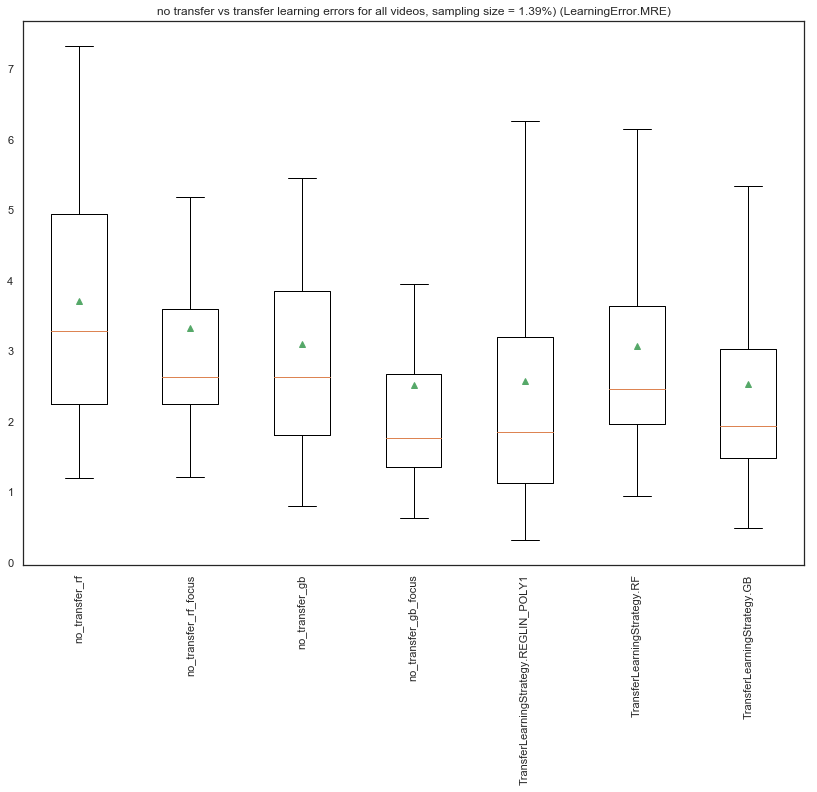

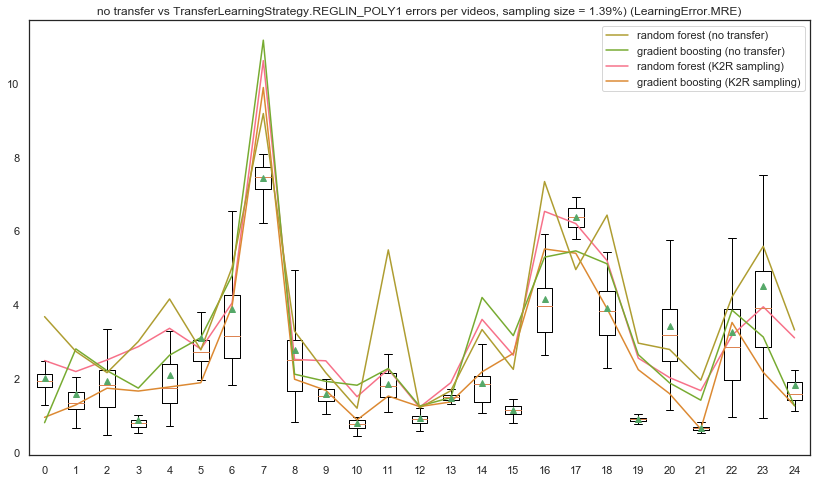

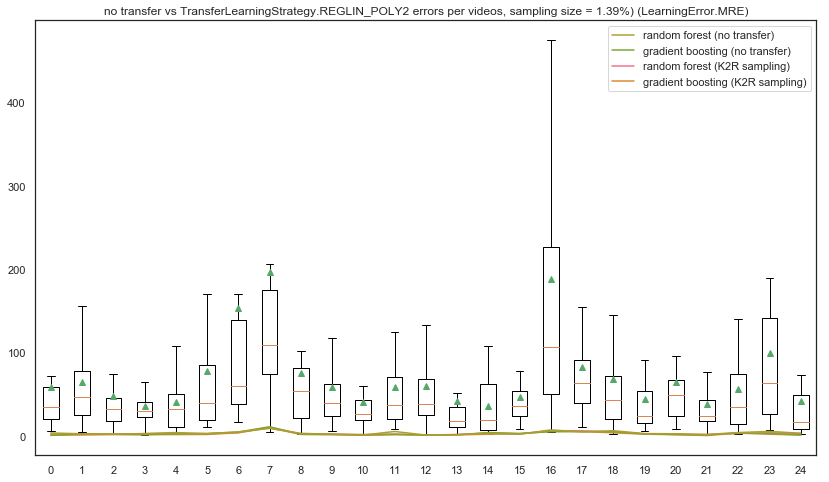

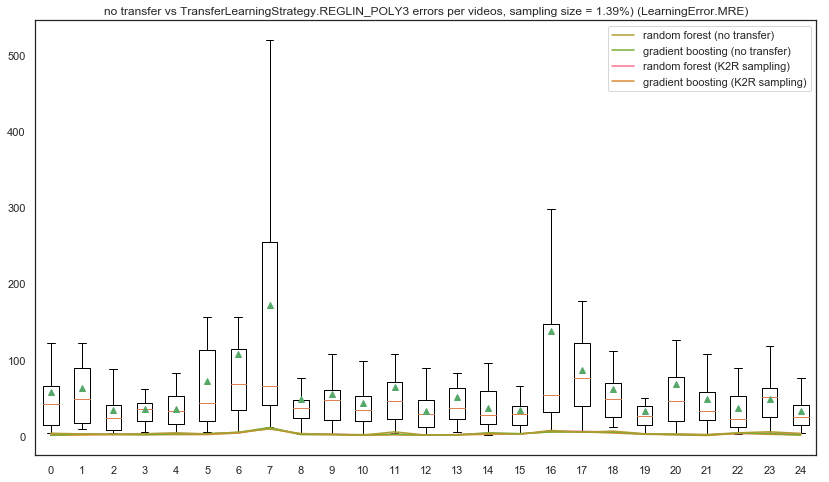

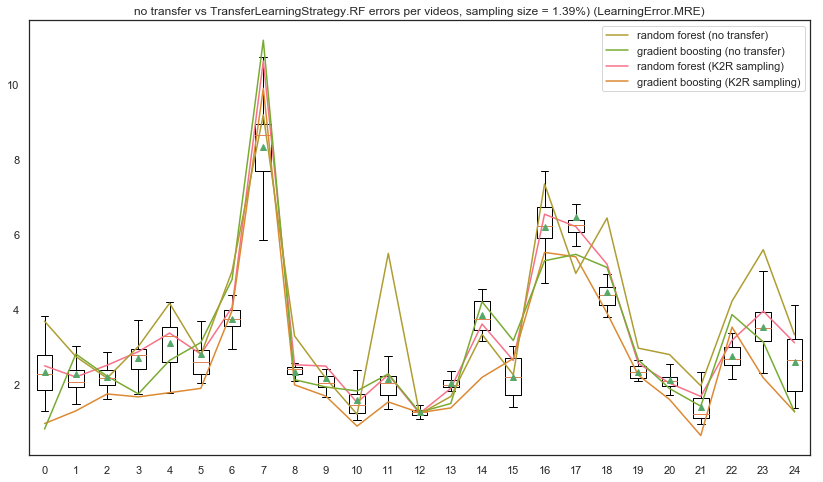

...

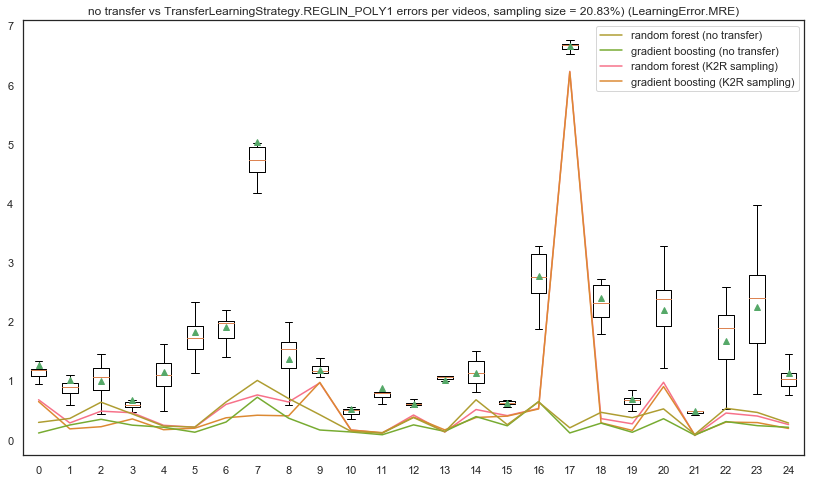

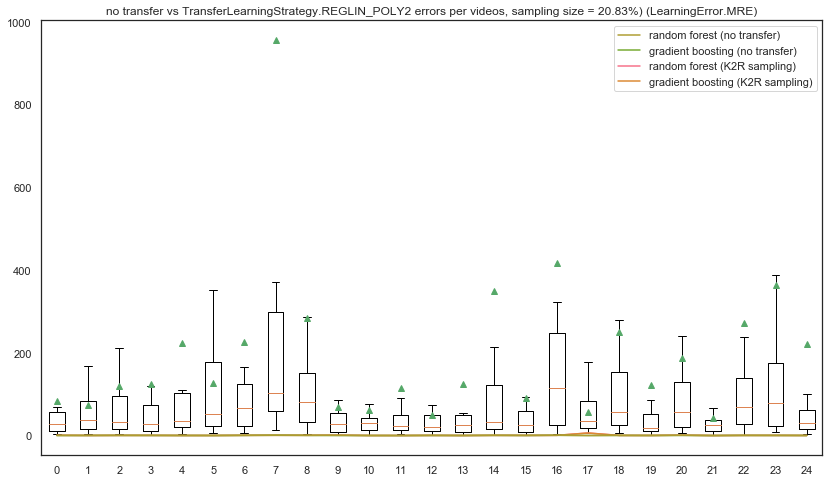

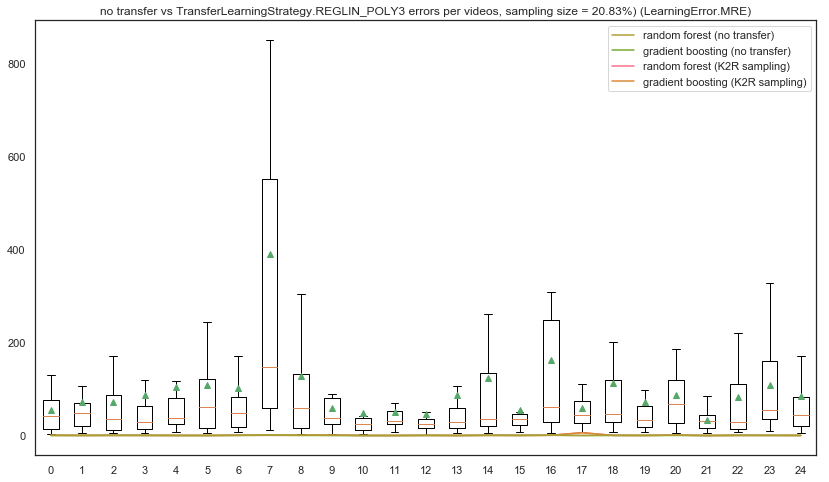

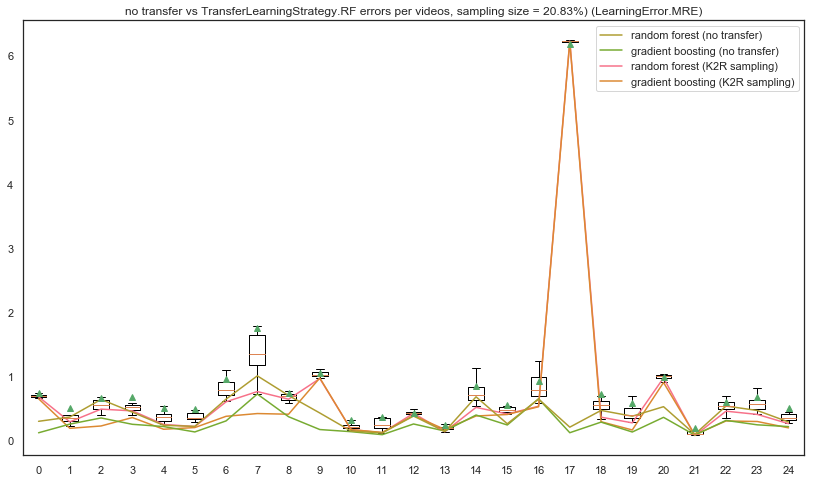

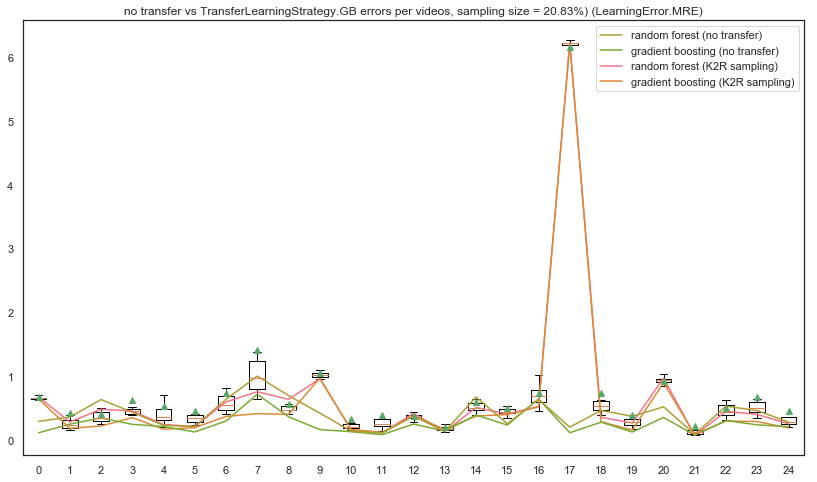

In [49]:
def noTransferBetweenVideosBis(v1ID, perc, regr=None, focusSampling=[]):
    
    vSource = listeVideo[v1ID].copy()
    # vTarget = listeVideo[v2ID]
    
    N_RANDOM_FOREST = 100
    N_BG_ESTIMATORS = 100
    
    #nTotal = len(vSource[predDimension]) # length is equal between vSource and vTarget (1052 in our experiments)
    #tres = round(perc * nTotal)
    
   # ftsToRemove = ['configurationID', 'size', 'elapsedtime', 'systemtime', 'usertime']
    # ftsToRemove.remove(predDimension)
    
#    x_train, x_test, y_train, y_test = train_test_split(vSource, 
 #                                                       vTarget[predDimension], test_size=perc, random_state=0)
    
    vCleanSource = vSource.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1)


    #x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource, 
    #                                                   vSource[predDimension], test_size=perc, random_state=None)
    
    
    if (len(focusSampling) > 0):
        x_target_train, x_target_test, y_target_train, y_target_test = ftfocus_train_test_split(v1ID, perc, focusSampling)
    else: # focusSamplig == 0 (ie no focus)
        x_target_train, x_target_test, y_target_train, y_target_test = train_test_split(vCleanSource, vSource[predDimension], test_size=perc, random_state=None)
  
    
    ######### pure learnning over target (it's the traditional way, without transfer)  ##########
    if (regr is None):
        clfTarget = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)  # GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS)
    else:
        clfTarget = regr
    
    # train sample 
    #x_target_train = vTarget[0:tres] # Cs
    #x_effective_target_train = x_target_train.drop(ftsToRemove, axis=1) # normally we learn over the full parameters but we can try to target specifically ['no_mbtree', 'no_cabac']
    # x_effective_target_train = x_effective_target_train[['no_mbtree', 'no_cabac']] 
    #y_target_train = vTarget[predDimension][0:tres] 
    #clfTarget.fit(x_effective_target_train, y_target_train) 
    clfTarget.fit(x_target_train, y_target_train)
    
    # test sample for evaluating 
   #x_target_test = vTarget[tres+1:nTotal]
   # x_effective_target_test = x_target_test.drop(ftsToRemove, axis=1) # normally we learn over the full parameters but we can try to target specifically ['no_mbtree', 'no_cabac']
    # x_effective_source_test = x_effective_source_test[['no_mbtree', 'no_cabac']]
   # y_target_test = vTarget[predDimension][tres+1:nTotal]
    
   # print("** Evaluation of learning model (for the TARGET, without transfer)**")
    y_target_pred = clfTarget.predict(x_target_test)
    mseMLTarget, r2MLTarget, mreMLTarget, maeMLTarget = evalPrediction(y_target_test, y_target_pred)
    return {LearningError.MSE: mseMLTarget, LearningError.R2: r2MLTarget, LearningError.MRE: mreMLTarget, LearningError.MAE: maeMLTarget}

def transferMLvideosBisBis(v1Source, v2Target, perc, learningStrategy, clfSource="rf", sourcePerc=0.8, focusSampling=[]):
    N_RANDOM_FOREST = 100
    N_BG_ESTIMATORS = 100
    vSource = listeVideo[v1Source].copy()  
    vTarget = listeVideo[v2Target].copy()
    
  
    # 0. merge of data (source + transfer measurements)
    vST = vSource # says 
    vST[mkTargetDimensionName(predDimension)] = vTarget[predDimension] 
    ### at this set we have columns: opt1, opt2,..., optN, predDimensionSource, predDimensionTarget 
    ### predDimension is predDimensionSource
    ### basically all options and the two measures
    
    # 1. we train a regressor over video source 
    ## the regressor is able to predict given opt1, opt2, ..., optN predDimensionSource
    # regressor is fitted over (vST[opt1, opt2, optN], vST[predDimension])
    #### source learning model should have a very high accuracy (perc. can influence training set size)
    ######## regr_source = train_regressor_oversource(clfSource, vST, sourcePerc, focusSampling)
    if (clfSource == "rf"):
        regr_source = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)
    elif (clfSource == "gb"):
        regr_source = GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS)
    else:
        print("Unknown regressor", clfSource)
        return 
       
    x_source_train_full, x_source_test_full, y_source_train_full, y_source_test_full = train_test_split(vST, vST[predDimension], test_size=sourcePerc, random_state=None)
    x_effective_source_train_full = x_source_train_full.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime', mkTargetDimensionName(predDimension)], axis=1)
    regr_source.fit(x_effective_source_train_full, y_source_train_full) # RT
    
    # 2. we train a transfer function (video source => video target)
    # we can do it with focus sampling or not 
    if (len(focusSampling) > 0):
        x_source_train, x_source_test, y_source_train, y_source_test = ftfocus_train_test_split_datavideo(vST, perc, focusSampling)
        x_effective_source_train = x_source_train
        x_effective_source_test = x_source_test
    else:
        x_source_train, x_source_test, y_source_train, y_source_test = train_test_split(vST, vST[mkTargetDimensionName(predDimension)], test_size=perc, random_state=None)
        x_effective_source_train = x_source_train.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1)
        x_effective_source_test = x_source_test.drop(['H264', 'configurationID', 'usertime', 'systemtime', 'size', 'elapsedtime'], axis=1) ## only options
    
  
    
    if (learningStrategy == TransferLearningStrategy.RF or learningStrategy == TransferLearningStrategy.GB):
       # print("random forest for transfer learning")
        if (learningStrategy == TransferLearningStrategy.RF):
            regr_transfer = RandomForestRegressor(n_estimators=N_RANDOM_FOREST)  # linear_model.LinearRegression() # linear_model.BayesianRidge() # linear_model.LinearRegression() # linear_model.Ridge (alpha = .5) 
        else:
            regr_transfer = GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS)
     
    elif (learningStrategy == TransferLearningStrategy.MULIT_RF):
        print("Multi RF is deprecated (see other notebooks if you're interested)")
        return 
    else:
        n_degree = mkDegree(learningStrategy)
        polynomial_features = PolynomialFeatures(degree=n_degree)
        linear_regression = LinearRegression()
        regr_transfer = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    
    #### 3. Training with transfer function
    # two steps process: (1) predict video source with regr_source; (2) then predict video target 
    ### we are training only with video target measurements
    # x_transfer_train (options + predDimension source)
    x_transfer_train = x_effective_source_train.drop([mkTargetDimensionName(predDimension)], axis=1)
    y_train = x_effective_source_train[mkTargetDimensionName(predDimension)] # source
    # source regressor for transferring 
    ### without these two lines, we're working on the raw measures of source (we ignore them!)
    y_train_source = regr_source.predict(x_transfer_train) # as predicted by the source regr
    x_transfer_train[predDimension] = y_train_source # .drop(predDimension, axis=1)
    regr_transfer.fit(x_transfer_train, y_train)

    ### EVALUATION    
    y_pred_source = regr_source.predict(x_effective_source_test.drop(mkTargetDimensionName(predDimension), axis=1))
    x_augmented_source_test = x_effective_source_test.drop(mkTargetDimensionName(predDimension), axis=1)
    x_augmented_source_test[predDimension] = y_pred_source
    y_pred = regr_transfer.predict(x_augmented_source_test)
   
    mseMLT, r2MLT, mreMLT, maeMLT = evalPrediction(x_effective_source_test[mkTargetDimensionName(predDimension)], y_pred)
    
    return {LearningError.MSE: mseMLT, LearningError.R2: r2MLT, LearningError.MRE: mreMLT, LearningError.MAE: maeMLT}

def transferMLvideosBis(v1Source, v2Target, perc, learningStrategy, ftsToFocus=[], clfSource="rf", sourcePerc=None, focusSampling=[]):
    return transferMLvideosBisBis(v1Source,  v2Target, perc, learningStrategy, clfSource, sourcePerc, focusSampling)


def mk_twodimensional_array(nx, ny):
    return [[NaN for j in range(0, ny)] for i in range(0, nx)]

def compute_transferlearning_errors(n_configs_tosample, lkind_error = LearningError.MRE, focus_sampling=[], nb_repeat_experiments = 1):
    if predDimension == "elapsedtime":
        fts_focus = allPossibleFtsTime 
    else:
        fts_focus = allPossibleFtsSize
    # n_per = 0.95 specifically is strange behaviour! 
    # n_configs_tosample = 32
    n_per = ((ntotalconfig - n_configs_tosample) / ntotalconfig)
    
    presource_perc = 0.8 # when None same as n_per for source, a bit rude
   

    lerrors_notransfer = {}
    N_RANDOM_FOREST = 100 
    lerrors_notransfer['no_transfer_rf'] = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=RandomForestRegressor(n_estimators=N_RANDOM_FOREST))[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    lerrors_notransfer['no_transfer_rf_focus'] = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=RandomForestRegressor(n_estimators=N_RANDOM_FOREST), focusSampling=ftfocussampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]

    N_BG_ESTIMATORS = 100
    lerrors_notransfer['no_transfer_gb'] = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS))[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    lerrors_notransfer['no_transfer_gb_focus'] = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS), focusSampling=ftfocussampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    if (predDimension == "elapsedtime"):
        agressive_sampling = ['no_weightb', 'no_fast_pskip']
    elif (predDimension == "size"):
        agressive_sampling = ['no_weightb', 'no_fast_pskip'] # could be 'no_mixed_refs' as well
    #lerrors_notransfer['no_transfer_gb_focus_agressive'] = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS), focusSampling=agressive_sampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]

    
    
    lerrors_strategy_per_pairvideos = {}
    for ls in [TransferLearningStrategy.REGLIN_POLY1, TransferLearningStrategy.REGLIN_POLY2, TransferLearningStrategy.REGLIN_POLY3, TransferLearningStrategy.RF, TransferLearningStrategy.GB]: # TransferLearningStrategy.REGLIN_POLY3, 
        lerrors_per_videopairs = mk_twodimensional_array(len(listeVideo), len(listeVideo))
        for vt in range(len(listeVideo)):
            for vs in range(len(listeVideo)):
                if (vs != vt):
                    # focus sampling has little effect when transferring 
                    lerror_vsvt = np.mean([transferMLvideosBis(v1Source=vs, v2Target=vt, perc=n_per, learningStrategy=ls, ftsToFocus=fts_focus, clfSource="gb", sourcePerc=presource_perc, focusSampling=focus_sampling)[lkind_error] for i in range(0, nb_repeat_experiments)])
                    lerrors_per_videopairs[vt][vs] = lerror_vsvt              
        lerrors_strategy_per_pairvideos[str(ls)] = lerrors_per_videopairs

    return lerrors_notransfer, lerrors_strategy_per_pairvideos

####### for all videos at once
def boxplot_learningerrors_allvideosatonce(lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error):
    lerrors_strategy = lerrors_notransfer.copy()
    for strategy, errors in lerrors_strategy_per_pairvideos.items():
        a_errors = np.array(errors)
        a_errors = a_errors[~np.isnan(a_errors)]
        # poly 2 and poly 3 quickly becomes inefficient 
        
        if (n_configs_tosample >= 48 and ((strategy == str(TransferLearningStrategy.REGLIN_POLY2)) or (strategy == str(TransferLearningStrategy.REGLIN_POLY3)))):
            pass
        elif (predDimension == "size" and (strategy == str(TransferLearningStrategy.REGLIN_POLY2)) or (strategy == str(TransferLearningStrategy.REGLIN_POLY3))):
            pass
        elif (strategy == str(TransferLearningStrategy.REGLIN_POLY3)):
            pass
        else:
            lerrors_strategy[str(strategy)] = np.array(a_errors).flatten()


    plt.figure(figsize=(14, 10))
    plt.boxplot(list(lerrors_strategy.values()), labels=list(lerrors_strategy.keys()), showfliers=False, showmeans=True)
    #plt.violinplot(list(lerrors_strategy.values()), showmeans=True)    
    locs, labels = plt.xticks()
    plt.setp(labels, rotation=90)
    per = ((ntotalconfig - n_configs_tosample) / ntotalconfig)
    plt.title("no transfer vs transfer learning errors for all videos, sampling size = " + str(round((1.0 - per) * 100, 2))  + "%)" + " (" + str(lkind_error) + ")")
    plt.savefig("transfers-allvideos-" + str(n_configs_tosample) + "-" + predDimension + ".pdf")    
    plt.show()
    

    


    
#### per video (much more insightful)
def boxplot_learningerrors_pervideos(lstrategy_toplot, lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error):
    transf_scores = []
    for vid_target in range(len(listeVideo)):    
            lerror_vidtarget = np.array(lerrors_strategy_per_pairvideos[str(lstrategy_toplot)][vid_target])
            transf_score = lerror_vidtarget[~np.isnan(lerror_vidtarget)]
            transf_scores.append(transf_score)

    plt.figure(figsize=(14, 8))
    plt.boxplot(transf_scores, showfliers=False, showmeans=True)
    plt.xticks(range(1, len(listeVideo) + 1), range(0, len(listeVideo)))
    
   

    df_notransf_rf_focus = pd.DataFrame([vid_baseline_err for vid_baseline_err in lerrors_notransfer["no_transfer_rf_focus"]])
    df_notransf_rf_focus.index = range(1, len(df_notransf_rf_focus) + 1) 
    rfp_focus, = plt.plot(df_notransf_rf_focus, color=COLOR_RF_FOCUS)
    
    df_notransf_gb_focus = pd.DataFrame([vid_baseline_err for vid_baseline_err in lerrors_notransfer["no_transfer_gb_focus"]])
    df_notransf_gb_focus.index = range(1, len(df_notransf_gb_focus) + 1) 
    gbp_focus, = plt.plot(df_notransf_gb_focus, color=COLOR_GB_FOCUS)
    
    #df_notransf_gb_focus_agressive = pd.DataFrame([vid_baseline_err for vid_baseline_err in lerrors_notransfer["no_transfer_gb_focus_agressive"]])
    #df_notransf_gb_focus_agressive.index = range(1, len(df_notransf_gb_focus_agressive) + 1) 
    #gbp_focus_agressive, = plt.plot(df_notransf_gb_focus_agressive, color=COLOR_GB_FOCUS_AGRESSIVE)
    
    df_notransf_gb = pd.DataFrame([vid_baseline_err for vid_baseline_err in lerrors_notransfer["no_transfer_gb"]])
    df_notransf_gb.index = range(1, len(df_notransf_gb) + 1) 
    gbp, = plt.plot(df_notransf_gb, color=COLOR_GB)

    df_notransf_rf = pd.DataFrame([vid_baseline_err for vid_baseline_err in lerrors_notransfer["no_transfer_rf"]])
    df_notransf_rf.index = range(1, len(df_notransf_rf) + 1) 
    rfp, = plt.plot(df_notransf_rf, color=COLOR_RF)
    
    
    per = ((ntotalconfig - n_configs_tosample) / ntotalconfig)
    plt.title("no transfer vs " + str(lstrategy_toplot) + " errors per videos, sampling size = " + str(round((1.0 - per) * 100, 2))  + "%)" + " (" + str(lkind_error) + ")")
    plt.legend([rfp, gbp, rfp_focus, gbp_focus], ["random forest (no transfer)", "gradient boosting (no transfer)", "random forest (K2R sampling)", "gradient boosting (K2R sampling)"])
    #plt.legend([rfp, gbp, rfp_focus, gbp_focus, gbp_focus_agressive], ["random forest (no transfer)", "gradient boosting (no transfer)", "random forest (K2R sampling)", "gradient boosting (K2R sampling)", "gradient boosting (K2R sampling, agressive)"])
    plt.savefig("transfer-" + str(lstrategy_toplot.name) + "-" + str(n_configs_tosample) + "-" + predDimension + ".pdf")
    plt.show()

def boxplot_learningerrors(n_configs_tosample, lkind_error = LearningError.MRE, focus_sampling=[]):
    lerrors_notransfer, lerrors_strategy_per_pairvideos = compute_transferlearning_errors(n_configs_tosample=n_configs_tosample, lkind_error=lkind_error, focus_sampling=focus_sampling, nb_repeat_experiments=1) 
    boxplot_learningerrors_allvideosatonce(lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error)
    boxplot_learningerrors_pervideos(TransferLearningStrategy.REGLIN_POLY1, lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error)
    boxplot_learningerrors_pervideos(TransferLearningStrategy.REGLIN_POLY2, lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error)
    boxplot_learningerrors_pervideos(TransferLearningStrategy.REGLIN_POLY3, lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error)   
    boxplot_learningerrors_pervideos(TransferLearningStrategy.RF, lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error)
    boxplot_learningerrors_pervideos(TransferLearningStrategy.GB, lerrors_notransfer, lerrors_strategy_per_pairvideos, n_configs_tosample, lkind_error)
    return lerrors_notransfer, lerrors_strategy_per_pairvideos

lerrors_evolution = {}
for n_sample in Nf:
    lerrors_notransfer, lerrors_strategy_per_pairvideos = boxplot_learningerrors(n_sample * N, lkind_error = LearningError.MRE, focus_sampling=ftfocussampling)
    lerrors_evolution[n_sample] = { 'no_transfer': lerrors_notransfer, 'shift' : lerrors_strategy_per_pairvideos }
    
    
   
 






In [ ]:
#np.nanmean(lerrors_evolution[1]['no_transfer']['no_transfer_gb_focus'])
for k in lerrors_evolution[1]['no_transfer']:
    print(k)
#lerrors_evolution[1]['no_transfer']

<Figure size 640x480 with 0 Axes>

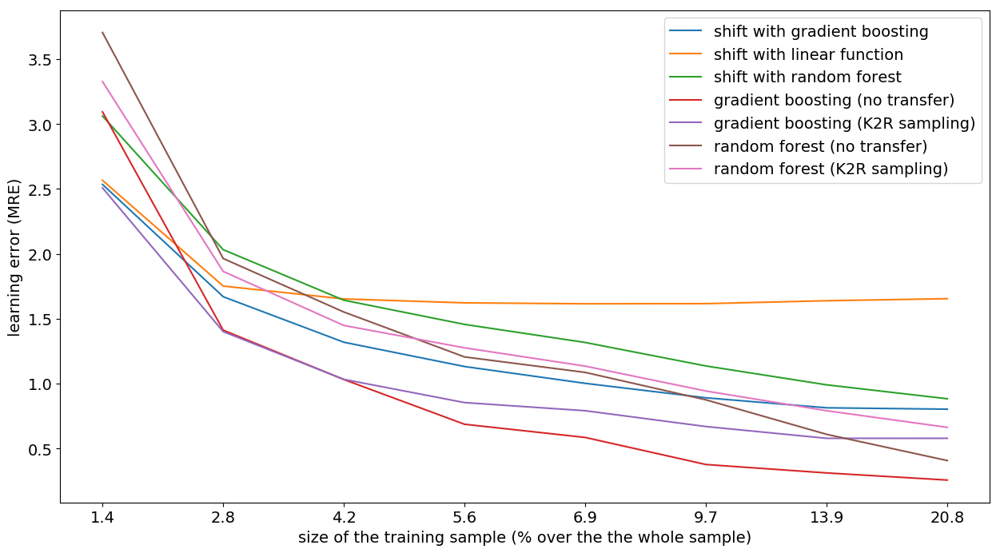

(-0.3780184293951132, -0.5856619238016432)

In [51]:
evo_errors = pd.DataFrame() # 
for n_sample in Nf:       
    
    ### for each shifting strategy, mean of error
    # TransferLearningStrategy.REGLIN_POLY2, TransferLearningStrategy.REGLIN_POLY3, are quickly bad
    shifts = {}
    for sh in [TransferLearningStrategy.REGLIN_POLY1, TransferLearningStrategy.RF, TransferLearningStrategy.GB]:
        shift = np.nanmean(lerrors_evolution[n_sample]['shift'][str(sh)])
        shifts[str(sh)] = shift
         #sh_poly = np.nanmean(lerrors_evolution[n_sample]['shift'][str(TransferLearningStrategy.REGLIN_POLY1)])       
    
    # no transfer error 
    for lstrategy in lerrors_evolution[n_sample]['no_transfer']:
        no_transfer_error = np.nanmean(lerrors_evolution[n_sample]['no_transfer'][lstrategy])
        shifts[lstrategy] = no_transfer_error
        
    shifts['n_sample'] = n_sample * N 
    
    evo_errors = evo_errors.append(shifts, ignore_index=True)

plt.style.use('default')
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
plt.rc('figure', titlesize=16) 
plt.rcParams.update({'font.size': 14})

evo_errors_proper = evo_errors.rename(columns={'no_transfer_gb': 'gradient boosting (no transfer)', 
                                               'no_transfer_gb_focus': 'gradient boosting (K2R sampling)',
                                               #'no_transfer_gb_focus_agressive': 'gradient boosting (K2R sampling, agressive)',
                                               'no_transfer_rf': 'random forest (no transfer)',
                                               'no_transfer_rf_focus': 'random forest (K2R sampling)',
                                               str(TransferLearningStrategy.REGLIN_POLY1) : 'shift with linear function',
                                               str(TransferLearningStrategy.GB): 'shift with gradient boosting',
                                               str(TransferLearningStrategy.RF): 'shift with random forest',                                     
                                              
                                              })

plt.figure()
evo_errors_proper.drop(columns=['n_sample']).plot(figsize=(15, 8))
plt.xticks(evo_errors_proper.index.values, round((evo_errors_proper['n_sample'] / ntotalconfig) * 100, 1))
plt.ylabel("learning error (MRE)")
plt.xlabel("size of the training sample (% over the the whole sample)")
plt.savefig("evolution-errors-" + predDimension + ".pdf")
plt.show()
#round((evo_errors_proper['n_sample'] / ntotalconfig) * 100, 2)
evo_errors_proper['random forest (K2R sampling)'][0] - evo_errors_proper['random forest (no transfer)'][0], evo_errors_proper['gradient boosting (K2R sampling)'].loc[0] - evo_errors_proper['gradient boosting (no transfer)'].loc[0]

In [52]:

source_perc = 0.8
nreap = 1
nper = 0.96
print("Transfer learning")
transf_res = mk_twodimensional_array(len(listeVideo), len(listeVideo))
for vs in range(len(listeVideo)):
     for vt in range(len(listeVideo)):
        if (not vs == vt):
            transf_res[vs][vt] = np.mean([transferMLvideosBisBis(v1Source=vs, v2Target=vt, perc=nper, learningStrategy=TransferLearningStrategy.GB, clfSource="gb", sourcePerc=source_perc, focusSampling=[])[LearningError.MRE] for n in range(nreap)])

print("Transfer learning + focus sampling")
transf_focus_res = mk_twodimensional_array(len(listeVideo), len(listeVideo))
for vs in range(len(listeVideo)):
    for vt in range(len(listeVideo)):
        if (not vs == vt):
            transf_focus_res[vs][vt] = np.mean([transferMLvideosBisBis(v1Source=vs, v2Target=vt, perc=nper, learningStrategy=TransferLearningStrategy.GB, clfSource="gb", sourcePerc=source_perc, focusSampling=ftfocussampling)[LearningError.MRE] for n in range(nreap)])

Transfer learning
Transfer learning + focus sampling


In [ ]:
plt.figure()
pd.DataFrame(transf_res).boxplot()
plt.title("transf")
plt.show()

plt.figure()
pd.DataFrame(transf_focus_res).boxplot()
plt.title("focus transf")
plt.show()

plt.figure()
pd.DataFrame(np.array(transf_focus_res) - np.array(transf_res)).boxplot(showmeans=True)
plt.title("focus transf vs transf (negative means less errors, and focus approach is better)")
plt.show()

In [53]:
ftfocussampling

['no_weightb']

In [82]:
# TODO
# evolution of GB focus wrt sampling size of the training set 
evo_errors = pd.DataFrame()
lkind_error = LearningError.MRE
nb_repeat_experiments = 1
N_BG_ESTIMATORS = 100
N_RANDOM_FOREST = 100
Nfp = Nf[:]

if (predDimension == "elapsedtime"):
    k2r_sampling = ['no_weightb', 'no_fast_pskip'] # no_deblock
elif (predDimension == "size"):
    k2r_sampling = ['no_fast_pskip'] # ['no_weightb'] #, 'no_mixed_refs'] # 'no_fast_pskip'] 
    
#Nfp.remove(3)
for n_sample in Nfp:
    n_config_sample = n_sample * N # number of configurations to sample
    n_per = ((ntotalconfig - n_config_sample) / ntotalconfig) # percentage of the training sample out of whole dataset
    lerror_gb_focus = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS), focusSampling=ftfocussampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    lerror_gb = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS), focusSampling=[])[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    lerror_rf_focus = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=RandomForestRegressor(n_estimators=N_RANDOM_FOREST), focusSampling=ftfocussampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    lerror_rf = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=RandomForestRegressor(n_estimators=N_RANDOM_FOREST), focusSampling=[])[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    
    lerror_gb_focus_mxref = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=GradientBoostingRegressor(n_estimators=N_BG_ESTIMATORS), focusSampling=k2r_sampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
   
    lerror_lr = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=LinearRegression(), focusSampling=[])[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
    lerror_lr_focus = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=LinearRegression(), focusSampling=ftfocussampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
  
    regr2_focus = Pipeline([("polynomial_features", PolynomialFeatures(degree=2)),
                     ("linear_regression", LinearRegression())])
    lerror_lrpoly2_focus = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=regr2_focus, focusSampling=ftfocussampling)[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
  

    regr2 = Pipeline([("polynomial_features", PolynomialFeatures(degree=2)),
                     ("linear_regression", LinearRegression())])
    lerror_lrpoly2 = [np.mean([noTransferBetweenVideosBis(vid, n_per, regr=regr2, focusSampling=[])[lkind_error] for i in range(0, nb_repeat_experiments)]) for vid in range(len(listeVideo))]
  
    evo_errors = evo_errors.append({'nsamples' : n_config_sample,
                        'errors_gb_focus' : lerror_gb_focus,
                        'error_gb_focus_mean' : np.mean(lerror_gb_focus),
                        'errors_gb' : lerror_gb,
                        'error_gb_mean' : np.mean(lerror_gb),
                        'errors_rf' : lerror_rf,
                        'error_rf_mean' : np.mean(lerror_rf),
                        'errors_rf_focus' : lerror_rf_focus,
                        'error_rf_focus_mean' : np.mean(lerror_rf_focus),
                        'error_gb_focus_mxref' : np.mean(lerror_gb_focus_mxref),
                        'error_lr' :           np.mean(lerror_lr),
                        'error_lr_focus' :           np.mean(lerror_lr_focus),
                        'error_lrpoly2_focus' :           np.mean(lerror_lrpoly2_focus),
                        'error_lrpoly2' :           np.mean(lerror_lrpoly2)
                                       }, ignore_index=True)



In [83]:
Nf

[1, 2, 3, 4, 5, 7, 10, 15]

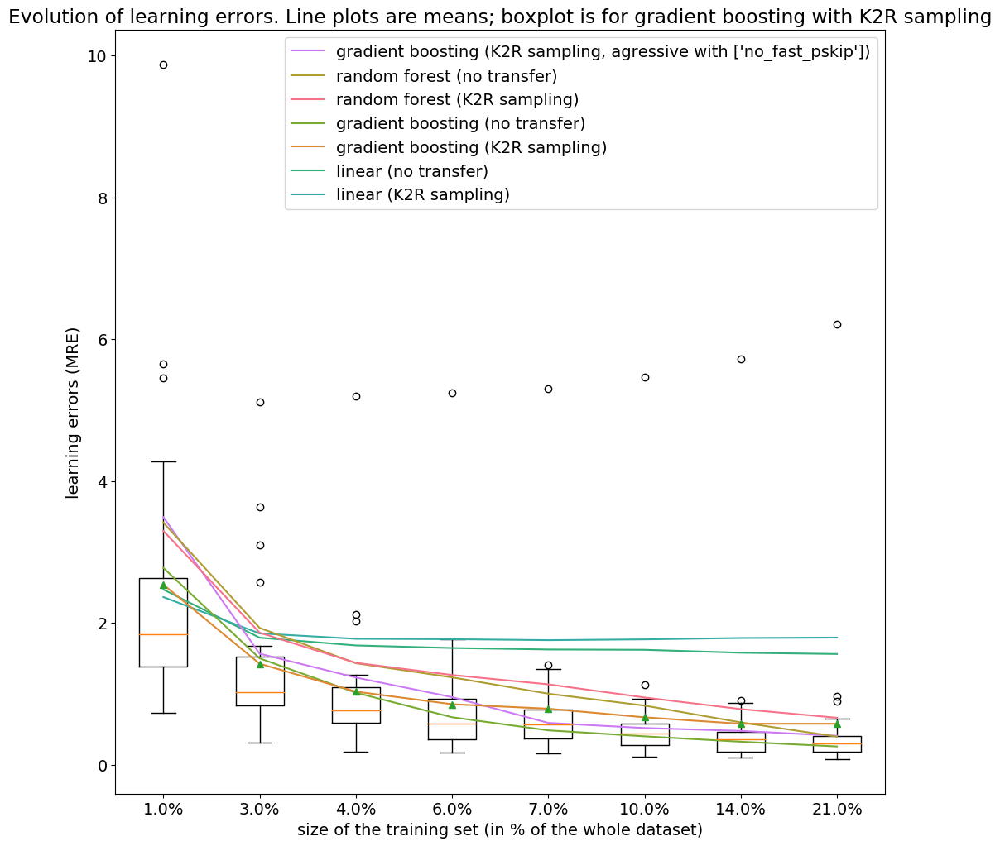

In [84]:

# TODO: change colors and legends
plt.figure(figsize=(12, 12))
plt.boxplot(evo_errors['errors_gb_focus'], showmeans=True) # showmeans=True
#plt.xticks(range(1, len(Nf) + 1), [N * n for n in Nf])
plt.xticks(range(1, len(Nf) + 1), [str(round((1 - (ntotalconfig - (N * n )) / ntotalconfig) * 100, 0)) + "%" for n in Nf])


#df_lrpoly2_mean = evo_errors['error_lrpoly2']
#df_lrpoly2_mean.index = range(1, len(df_lrpoly2_mean) + 1) 
#lrpoly2p, = plt.plot(df_lrpoly2_mean, color=COLOR_LRPOLY2)

#df_lrpoly2_focus_mean = evo_errors['error_lrpoly2_focus']
#df_lrpoly2_focus_mean.index = range(1, len(df_lrpoly2_focus_mean) + 1) 
#lrpoly2p_focus, = plt.plot(df_lrpoly2_focus_mean, color=COLOR_LRPOLY2_FOCUS)

df_lr_mean = evo_errors['error_lr']
df_lr_mean.index = range(1, len(df_lr_mean) + 1) 
lrp, = plt.plot(df_lr_mean, color=COLOR_LR)

df_lr_focus_mean = evo_errors['error_lr_focus']
df_lr_focus_mean.index = range(1, len(df_lr_focus_mean) + 1) 
lrp_focus, = plt.plot(df_lr_focus_mean, color=COLOR_LR_FOCUS)


df_gb_mean_focus_mxref = evo_errors['error_gb_focus_mxref']
df_gb_mean_focus_mxref.index = range(1, len(df_gb_mean_focus_mxref) + 1) 
gbp_focus_mxref, = plt.plot(df_gb_mean_focus_mxref, color=COLOR_GB_FOCUS_OTHER)

df_rf_mean = evo_errors['error_rf_mean']
df_rf_mean.index = range(1, len(df_rf_mean) + 1) 
rfp, = plt.plot(df_rf_mean, color=COLOR_RF)

df_rf_focus_mean = evo_errors['error_rf_focus_mean']
df_rf_focus_mean.index = range(1, len(df_rf_focus_mean) + 1) 
rfp_focus, = plt.plot(df_rf_focus_mean, color=COLOR_RF_FOCUS)

df_gb_mean = evo_errors['error_gb_mean']
df_gb_mean.index = range(1, len(df_gb_mean) + 1) 
gbp, = plt.plot(df_gb_mean, color=COLOR_GB)

df_gb_mean_focus = evo_errors['error_gb_focus_mean']
df_gb_mean_focus.index = range(1, len(df_gb_mean_focus) + 1) 
gbp_focus, = plt.plot(df_gb_mean_focus, color=COLOR_GB_FOCUS)


# lrpoly2p_focus, 
#plt.legend([rfp, rfp_focus, gbp, gbp_focus, lrp, lrp_focus, lrpoly2p_focus, lrpoly2p], ["random forest (no transfer)", "random forest (focused sampling)", "gradient boosting (no transfer)", "gradient boosting (focused sampling)", "linear (no transfer)", "linear (focused sampling)", "poly_2 (focused sampling)", "poly_2 (no transfer)"])
# , "reg poly 2 (no transfer)"
# lrpoly2p, lrpoly2p_focus
# "linear poly2 (no transfer)", "linear poly2 (K2R sampling)"
plt.legend([gbp_focus_mxref, rfp, rfp_focus, gbp, gbp_focus, lrp, lrp_focus], ["gradient boosting (K2R sampling, agressive with " + str(k2r_sampling) + ")", "random forest (no transfer)", "random forest (K2R sampling)", "gradient boosting (no transfer)", "gradient boosting (K2R sampling)", "linear (no transfer)", "linear (K2R sampling)"])
plt.title("Evolution of learning errors. Line plots are means; boxplot is for gradient boosting with K2R sampling")
plt.xlabel("size of the training set (in % of the whole dataset)")
plt.ylabel("learning errors (" + str(lkind_error.name) + ")")
# "
plt.savefig("evolution-learningerrors-" + predDimension + ".pdf")
plt.show()
#evo_gb_focus


In [57]:
#plt.boxplot(listeVideo[13][predDimension])

In [58]:
mean_relative_error(pd.DataFrame([0.2]), pd.DataFrame([0.6])), mean_relative_error(pd.DataFrame([0.6]), pd.DataFrame([0.2]))

(0    200.0
 dtype: float64, 0    66.666667
 dtype: float64)

In [59]:
import scipy 
distance_videos_perfeatureimportance = mk_twodimensional_array(len(listeVideo), len(listeVideo))
for vs in range(len(listeVideo)):
    for vt in range(len(listeVideo)):
        if (vs == vt):
            distance_videos_perfeatureimportance[vs][vt] = np.nan
        else:
            distance_videos_perfeatureimportance[vs][vt] = scipy.spatial.distance.euclidean(fts_coeff_proper['coeff_' + str(vs)], fts_coeff_proper['coeff_' + str(vt)])

pd.DataFrame(distance_videos_perfeatureimportance).style.background_gradient(cmap=sns.diverging_palette(5, 250, as_cmap=True)).highlight_min()
#distance_videos_perfeatureimportance

/usr/local/lib/python3.7/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,nan,1.13677e+07,1.0518e+06,1.54326e+06,1.72953e+06,7.80955e+06,842240,742455,1.2241e+06,1.39206e+06,1.41775e+06,2.09653e+06,1.23658e+06,6.60961e+06,1.00527e+06,1.25534e+06,521011,1.08523e+07,1.44247e+06,4.62183e+06,1.22794e+06,1.3817e+06,1.16989e+06,1.25097e+06,4.29158e+06
1,1.13677e+07,nan,1.05212e+07,9.9109e+06,9.65728e+06,4.03504e+06,1.07194e+07,1.19653e+07,1.04109e+07,1.01962e+07,1.01447e+07,9.45865e+06,1.03818e+07,9.45313e+06,1.13284e+07,1.0362e+07,1.09309e+07,1.41505e+06,1.01251e+07,9.11331e+06,1.04089e+07,1.01956e+07,1.04225e+07,1.03552e+07,7.944e+06
2,1.0518e+06,1.05212e+07,nan,619938,1.06139e+06,6.87426e+06,268094,1.73362e+06,181129,354273,394085,1.09711e+06,189225,6.6331e+06,1.74537e+06,207146,927233,1e+07,415128,4.62866e+06,185683,350757,120665,204702,3.91591e+06
3,1.54326e+06,9.9109e+06,619938,nan,571029,6.29348e+06,823188,2.21838e+06,554155,371989,313959,577946,521353,6.30554e+06,1.99765e+06,505107,1.24378e+06,9.39874e+06,307798,4.27089e+06,553938,361593,538823,493395,3.41202e+06
4,1.72953e+06,9.65728e+06,1.06139e+06,571029,nan,6.14355e+06,1.18475e+06,2.34426e+06,1.06271e+06,914470,863786,865532,1.0311e+06,5.89487e+06,1.89838e+06,1.01965e+06,1.30074e+06,9.16257e+06,859152,3.74629e+06,1.06414e+06,905374,1.02214e+06,1.0059e+06,2.93898e+06
5,7.80955e+06,4.03504e+06,6.87426e+06,6.29348e+06,6.14355e+06,nan,7.0911e+06,8.43515e+06,6.74423e+06,6.53373e+06,6.49197e+06,5.78902e+06,6.71807e+06,8.06894e+06,7.9638e+06,6.69687e+06,7.42616e+06,3.67973e+06,6.46819e+06,6.87022e+06,6.7417e+06,6.54009e+06,6.76756e+06,6.69424e+06,5.38605e+06
6,842240,1.07194e+07,268094,823188,1.18475e+06,7.0911e+06,nan,1.49798e+06,429050,600409,634298,1.32533e+06,441084,6.64178e+06,1.55721e+06,459700,762861,1.02009e+07,655630,4.62892e+06,433153,594328,378468,458493,4.00755e+06
7,742455,1.19653e+07,1.73362e+06,2.21838e+06,2.34426e+06,8.43515e+06,1.49798e+06,nan,1.90499e+06,2.0759e+06,2.10416e+06,2.7725e+06,1.9187e+06,6.84913e+06,986868,1.93724e+06,1.0956e+06,1.14657e+07,2.12656e+06,4.82953e+06,1.90887e+06,2.06824e+06,1.85351e+06,1.93567e+06,4.75786e+06
8,1.2241e+06,1.04109e+07,181129,554155,1.06271e+06,6.74423e+06,429050,1.90499e+06,nan,216686,269916,962600,33052.1,6.67693e+06,1.91696e+06,51363.4,1.101e+06,9.88663e+06,288202,4.69342e+06,5277.57,219066,76652.8,62099.8,3.9145e+06
9,1.39206e+06,1.01962e+07,354273,371989,914470,6.53373e+06,600409,2.0759e+06,216686,nan,71261.8,750941,188404,6.58057e+06,2.01219e+06,168836,1.2066e+06,9.67283e+06,80811.1,4.59133e+06,214869,47611.1,239071,163386,3.75714e+06


In [60]:
lerrors_notransfer, lerrors_strategy_per_pairvideos = compute_transferlearning_errors(n_configs_tosample=32, focus_sampling=ftfocussampling, lkind_error=LearningError.MRE)

corr Pearson 0.09771184098673631
corr KL 0.43363270569668577
corr ft importances 0.3079481111469147


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,1,0.89457,1.16478,1.02904,1.1084,1.1061,1.1817,0.927463,1.15527,1.28604,0.917264,0.939763,1.17519,1.11164,1.12394,1.16797,1.14012,3.83943,1.12632,1.10334,1.13064,0.976891,1.15197,1.14451,1.03923
1,0.919733,1,1.02104,0.666304,0.798967,0.791985,1.05744,1.05914,1.07916,1.26869,0.630052,0.790259,1.01113,0.963874,1.05524,0.994816,0.996473,4.1816,0.922685,0.978066,1.0867,0.803068,0.970993,0.942606,0.746385
2,1.32987,1.22778,1,1.24243,0.779847,1.00508,0.895143,1.32976,0.547887,1.53437,1.30111,1.29823,1.25727,1.28702,0.862356,1.20525,0.961708,2.00523,0.998667,1.20824,0.552777,1.27764,0.469665,0.565758,1.00472
3,0.707486,0.422501,0.657267,1,0.572237,0.575992,0.69751,0.787376,0.666386,0.84688,0.514805,0.523539,0.651271,0.664041,0.635257,0.601265,0.638154,2.09878,0.557092,0.543977,0.664983,0.576588,0.639205,0.591398,0.483102
4,1.42952,1.10343,0.979095,1.16615,1,0.772688,1.15359,1.5676,0.935677,1.51174,1.2955,1.31404,1.39422,1.39091,1.00583,1.26562,1.05056,3.8867,1.03824,1.22818,0.981183,1.3466,0.544993,0.645175,0.784819
5,1.97173,1.46917,1.64114,1.77639,1.20833,1,1.82073,2.27864,1.63353,2.41929,1.8249,1.8165,2.022,1.94853,1.73462,1.96263,1.48633,5.50492,1.61019,1.82988,1.84732,1.90605,1.29681,1.41457,1.48703
6,2.27261,2.20934,1.52356,2.17401,1.75341,2.0496,1,1.91979,1.55205,2.38499,2.19254,2.18715,2.15688,2.13239,1.92746,2.10659,1.94379,2.45651,2.04152,2.10557,1.61819,2.16596,1.65681,1.84246,2.07741
7,4.65284,5.10216,5.31666,5.49664,5.93241,5.51285,4.81259,1,5.42537,5.7854,5.18604,5.26949,5.77244,5.67749,3.85651,5.5558,4.89443,10.851,5.0908,4.95831,5.39284,5.40043,5.63728,5.58561,5.45724
8,1.8397,1.71978,0.94451,1.73223,1.12182,1.3515,1.15699,1.86014,1,2.04073,1.72235,1.75372,1.75978,1.7548,1.31033,1.68844,1.33892,3.03946,1.41468,1.63658,0.939713,1.6974,0.720753,0.937551,1.45484
9,1.36555,1.16177,1.14535,1.29359,1.10998,1.12291,1.21934,1.29435,1.19595,1,1.23354,1.06284,1.01181,1.21659,1.12657,0.966224,1.1225,1.63585,1.00645,1.26318,1.19479,1.23497,1.17171,1.2573,1.21285


corr Pearson source 0.20624934950785306
corr KL source 0.309980215253691


,best_video_source_KLcorrelated_error,best_video_source_error,best_video_source_perftimpdistance,bestid_video_source,mean_video_source_learningerror,nontransfer_error_gb_focus,pearson_correlation_source,winning_gb,winning_gb_focus,winning_rf,winning_rf_focus,withbestvideosource_ownlearning_error,withbestvideosource_pearsoncorrelated_error,withbestvideosource_transfer_error
videotarget,,,,,,,,,,,,,,
0.0,0.44487,0.453187,0.478894,1,0.463902,0.661227,-0.765373,False,False,False,False,0.315664,0.266236,0.233342
1.0,0.336173,-0.16338,3.45863,10,0.251559,0.722971,0.983678,True,True,True,True,0.0800975,0.067288,-0.0929186
2.0,-0.669143,0.830086,-1.20456,22,-0.467477,1.67422,0.561602,True,True,True,True,-0.396583,-0.811865,-1.20456
3.0,-0.228875,0.0981633,-0.459159,1,-0.379546,1.01625,0.895589,True,True,True,True,-0.439663,-0.444014,-0.59375
4.0,0.732634,1.66934,0.33119,22,0.324911,0.834963,0.852842,True,True,True,True,0.511636,0.33119,-0.28997
5.0,1.76438,0.748992,4.99066,4,1.30435,0.514269,0.816816,True,False,True,False,1.39178,1.30223,0.694064
6.0,-0.529519,-0.522942,-1.05557,2,-0.487635,2.57912,0.869997,True,True,True,True,-0.413167,-1.02707,-1.05557
7.0,2.24497,-1.02636,1.38495,14,2.14502,3.26788,0.794836,False,False,True,False,2.13255,1.38495,0.588629
8.0,-0.0869802,1.06583,-0.498766,22,0.224029,1.43848,0.122579,True,True,True,True,0.258921,-0.498766,-0.717726


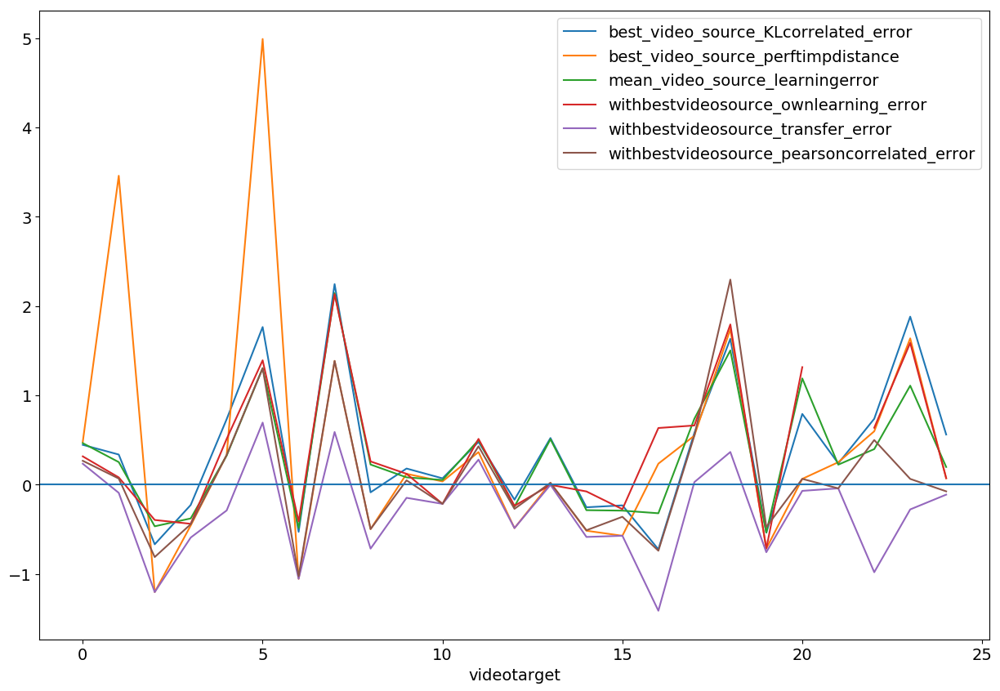

In [61]:
lstrategy_toanalyze = TransferLearningStrategy.REGLIN_POLY1
transf_scores = []
transf_scores_bestsource = []
when_transfer_wins = pd.DataFrame()
for vid_target in range(len(listeVideo)):    
        lerror_vidtarget = np.array(lerrors_strategy_per_pairvideos[str(lstrategy_toanalyze)][vid_target])
        bestid_video_source = np.nanargmin(lerror_vidtarget) # [~np.isnan(lerror_vidtarget)])
        best_video_source_error = lerror_vidtarget[bestid_video_source]
        
        # we seek highest correlation being positive or negative (size case)
        # what if we choose the source with the highest correlation? here Pearson
        bestid_video_source_pearsoncorrelated = np.nanargmax(np.abs(corrPearson[vid_target])) 
        best_video_source_pearsoncorrelated_error = lerror_vidtarget[bestid_video_source_pearsoncorrelated]
        
        # we seek highest correlation being positive or negative (size case)
        # what if we choose the source with the highest correlation? here KL
        bestid_video_source_KLcorrelated = np.nanargmax(np.abs(divKL[vid_target])) 
        best_video_source_KLcorrelated_error = lerror_vidtarget[bestid_video_source_KLcorrelated]
        
        # what if we choose a random video source
        # we would get the mean error
        mean_video_source_learningerror = np.nanmedian(lerror_vidtarget)
        
        
      
        nontransfer_error_gb = lerrors_notransfer['no_transfer_gb'][vid_target]
        nontransfer_error_gb_focus = lerrors_notransfer['no_transfer_gb_focus'][vid_target]
        nontransfer_error_rf = lerrors_notransfer['no_transfer_rf'][vid_target]
        nontransfer_error_rf_focus = lerrors_notransfer['no_transfer_rf_focus'][vid_target]
        winning_gb = best_video_source_error < nontransfer_error_gb
        winning_gb_focus = best_video_source_error < nontransfer_error_gb_focus
        winning_rf = best_video_source_error < nontransfer_error_rf
        winning_rf_focus = best_video_source_error < nontransfer_error_rf_focus
        delta_gb = nontransfer_error_gb - best_video_source_error
        delta_rf = nontransfer_error_rf - best_video_source_error
        pearson_correlation_source = corrPearson[vid_target][bestid_video_source]
        
        # what if we choose the source with the less error? 
        # TODO: shouldn't be itself ie source = target ;) 
        bestid_video_source_learningerror = np.nanargmin(lerrors_notransfer['no_transfer_gb_focus']) 
        best_video_source_learningerror = lerror_vidtarget[bestid_video_source_learningerror]
        
        # what if we choose the source with the best "distance" (closer)
        #### 
        bestid_perdistance_videos = np.nanargmin(distance_videos_perfeatureimportance[vid_target])
        best_video_source_perftimpdistance = lerror_vidtarget[bestid_perdistance_videos]
        
        
        transf_scores.append(lerror_vidtarget)
        
        lerror_vidsource = lerrors_notransfer['no_transfer_gb_focus'] # [bestid_video_source]
        transf_scores_bestsource.append(lerror_vidsource)
        
        when_transfer_wins = when_transfer_wins.append({
            'videotarget': vid_target,
            'winning_gb_focus' : winning_gb_focus,
            'winning_gb' : winning_gb,
            'winning_rf': winning_rf,
            'winning_rf_focus' : winning_gb_focus,
            'best_video_source_error': lerrors_notransfer['no_transfer_rf_focus'][bestid_video_source] - nontransfer_error_gb_focus,
            'withbestvideosource_transfer_error': best_video_source_error - nontransfer_error_gb_focus ,
            'nontransfer_error_gb_focus': nontransfer_error_gb_focus,
            'withbestvideosource_pearsoncorrelated_error': best_video_source_pearsoncorrelated_error - nontransfer_error_gb_focus,
            'withbestvideosource_ownlearning_error': best_video_source_learningerror - nontransfer_error_gb_focus,
            'mean_video_source_learningerror': mean_video_source_learningerror - nontransfer_error_gb_focus,
            'best_video_source_perftimpdistance' : best_video_source_perftimpdistance - nontransfer_error_gb_focus,
            'best_video_source_KLcorrelated_error': best_video_source_KLcorrelated_error - nontransfer_error_gb_focus,
            #'delta_gb': delta_gb,
            #'delta_rf': delta_rf, 
            'pearson_correlation_source' : pearson_correlation_source, 
            'bestid_video_source' : bestid_video_source
        }, ignore_index=True)
        #transf_score = lerror_vidtarget[~np.isnan(lerror_vidtarget)]
        #transf_scores.append(transf_score)
        
#if (corrMethod == "pearson"):                   
# is there a relationships between transfer scores (among pairs of videos) and correlations? 
if (predDimension == "elapsedtime"):
    corrL = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(corrPearson).fillna(0.0).values.flatten())[0, 1]
else: # negative correlations
    corrL = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(corrPearson).fillna(0.0).abs().values.flatten())[0, 1]
print("corr Pearson", corrL)

if (predDimension == "elapsedtime"):
    corrKL = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(divKL).fillna(0.0).values.flatten())[0, 1]
else: # negative correlations f
    corrKL = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(divKL).fillna(0.0).abs().values.flatten())[0, 1]
print("corr KL", corrKL)


corrImp = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(distance_videos_perfeatureimportance).fillna(0.0).values.flatten())[0, 1]
print("corr ft importances", corrImp)




transf_scores_bestsource_withnan = np.array(transf_scores_bestsource[:])
for i in range(len(listeVideo)): 
    for j in range(len(listeVideo)): 
        if i == j:
            transf_scores_bestsource_withnan[i][j] = NaN 

            
# no correlation between source => target and target => source with polynomial linear regression of degree 2 (for simple linear regression it's correlated)
display(HTML(pd.DataFrame(transf_scores).fillna(1.0).style.background_gradient(cmap=sns.diverging_palette(5, 250, as_cmap=True), axis=1).highlight_min(axis=1).render()))
#display(HTML(pd.DataFrame(corrPearson).fillna(1.0).style.background_gradient(cmap=sns.diverging_palette(5, 250, as_cmap=True), axis=1).highlight_min(axis=1).render()))

#print (transf_scores_bestsource)

# basically: is there a relationship between the quality of a video source and ...
if (predDimension == "elapsedtime"):
    corrL_source = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(corrPearson * transf_scores_bestsource_withnan).fillna(0.0).values.flatten())[0, 1]
else: # negative correlation
    corrL_source = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(corrPearson * transf_scores_bestsource_withnan).fillna(0.0).abs().values.flatten())[0, 1]
print("corr Pearson source", corrL_source)

if (predDimension == "elapsedtime"):
    corrKL_source = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(divKL / transf_scores_bestsource_withnan).fillna(0.0).values.flatten())[0, 1]
else: # negative correlation
    corrKL_source = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(divKL / transf_scores_bestsource_withnan).fillna(0.0).abs().values.flatten())[0, 1]
print("corr KL source", corrKL_source)

when_transfer_wins[['winning_rf', 'winning_gb', 'winning_gb_focus', 'winning_rf_focus']] = when_transfer_wins[['winning_rf', 'winning_gb', 'winning_gb_focus', 'winning_rf_focus']].astype(bool)
when_transfer_wins.set_index('videotarget', inplace=True)


def color_false_red(val):
    color = 'green' if val else 'red'
    return 'color: %s' % color

display(HTML(when_transfer_wins.style.applymap(color_false_red, subset=['winning_gb', 'winning_rf', 'winning_rf_focus', 'winning_gb_focus']).render()))
#elif (corrMethod == "spearman"):
#    corrL = stats.spearmanr(mMeanSample, pd.DataFrame(corrSpearman), nan_policy="omit").correlation

#pd.DataFrame(transf_scores).fillna(1.0)#, pd.DataFrame(corrPearson).shape
#pd.DataFrame(transf_scores).loc[9]


#plt.figure()
#when_transfer_wins[['mean_video_source_learningerror', 'withbestvideosource_ownlearning_error', 'withbestvideosource_transfer_error', 'nontransfer_error_gb_focus', 'withbestvideosource_pearsoncorrelated_error']].plot(figsize=(15, 15))
when_transfer_wins[['best_video_source_KLcorrelated_error', 'best_video_source_perftimpdistance', 'mean_video_source_learningerror', 'withbestvideosource_ownlearning_error', 'withbestvideosource_transfer_error', 'withbestvideosource_pearsoncorrelated_error']].plot(figsize=(15, 10))
plt.axhline()
plt.show()


In [62]:
#ler = np.array(lerrors_strategy_per_pairvideos[str(TransferLearningStrategy.REGLIN_POLY1)][10])
#ler[~np.isnan(ler)]
#pd.DataFrame(transf_scores)
#pd.DataFrame(transf_scores_bestsource)


In [63]:
#if predDimension == "elapsedtime":
# strange case of 8 
#v8res = [np.mean([transferMLvideosBis(v1Source=vs, v2Target=8, perc=0.6, learningStrategy=TransferLearningStrategy.REGLIN_POLY1, ftsToFocus=allPossibleFtsTime, clfSource="gb", sourcePerc=0.3, focusSampling=[])[LearningError.MRE] for i in range(0, 10)]) for vs in range(len(listeVideo))]
#pd.DataFrame(v8res, columns=["error"]).sort_values(by="error")

In [64]:
#corrPearson[8]

In [65]:
np.corrcoef(pd.DataFrame(corrPearson).fillna(0.0).values.flatten(), pd.DataFrame(corrPearson).fillna(0.0).values.flatten())[0, 1]

0.9999999999999998

In [66]:
corrC = np.corrcoef(pd.DataFrame(transf_scores).fillna(0.0).values.flatten(), pd.DataFrame(transf_scores_bestsource_withnan).fillna(0.0).values.flatten())[0, 1]
print("corrC", corrC)

corrC 0.18779859001204752


In [67]:
print(plt.style.available)

['seaborn-dark', 'seaborn-darkgrid', 'seaborn-ticks', 'fivethirtyeight', 'seaborn-whitegrid', 'classic', '_classic_test', 'fast', 'seaborn-talk', 'seaborn-dark-palette', 'seaborn-bright', 'seaborn-pastel', 'grayscale', 'seaborn-notebook', 'ggplot', 'seaborn-colorblind', 'seaborn-muted', 'seaborn', 'Solarize_Light2', 'seaborn-paper', 'bmh', 'tableau-colorblind10', 'seaborn-white', 'dark_background', 'seaborn-poster', 'seaborn-deep']


In [68]:
#plt.figure()
#plt.plot()
#plt.show()

In [69]:
corr_transf = pd.DataFrame()
corr_transf["transfer"] = pd.DataFrame(transf_scores).fillna(0.0).values.flatten()
corr_transf["source_quality"] = pd.DataFrame(transf_scores_bestsource_withnan).fillna(0.0).values.flatten()
corr_transf["pearson"] = pd.DataFrame(corrPearson).fillna(0.0).values.flatten()
corr_transf["KL"] = pd.DataFrame(divKL).fillna(0.0).values.flatten()
corr_transf

polynomial_features = PolynomialFeatures(degree=2)
l_regression = LinearRegression()
regr_corr = Pipeline([("polynomial_features", polynomial_features),
                 ("linear_regression", l_regression)])

X, X_test, y, y_test = train_test_split(corr_transf[["source_quality", "KL"]], corr_transf["transfer"], test_size = 0.1)

regr_corr.fit(X, y)
regr_corr.named_steps['linear_regression'].coef_

ypred = regr_corr.predict(X_test)
r2_score(y_test, ypred)


#pd.concat([, ])
#, columns=["transf_scores", "notransf"])


0.05440025547245375

In [70]:
import scipy 
scipy.spatial.distance.euclidean([0, 1, 2], [0, 1, 3])

1.0

In [71]:
import math
n = 3**16000
int(math.log10(n))+1

7634

feature,no_mbtree,no_cabac,no_8x8dct,no_cabac no_mbtree,no_deblock,no_8x8dct no_cabac,no_8x8dct no_mbtree,ref,no_mixed_refs ref,no_cabac no_deblock
coeff_0,1,2,4,3,5,11,9,17,19,20
coeff_1,1,2,3,4,6,13,5,11,8,10
coeff_2,1,2,3,7,4,6,5,8,10,11
coeff_3,1,2,3,5,4,12,6,11,13,19
coeff_4,2,1,3,5,4,6,17,31,16,33
coeff_5,1,3,2,5,7,6,4,9,18,20
coeff_6,1,2,7,8,4,12,5,32,26,9
coeff_7,1,2,5,3,4,17,7,13,27,8
coeff_8,1,2,3,9,6,7,4,33,15,8
coeff_9,1,2,3,6,26,7,17,8,9,28


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


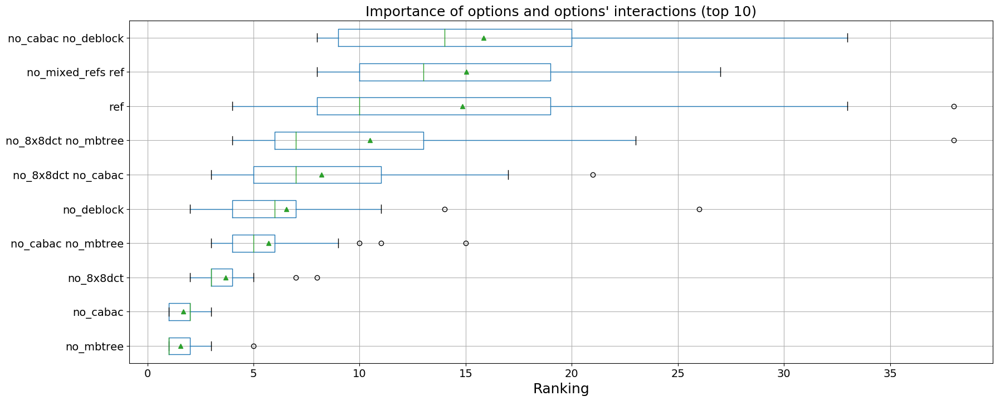

feature,no_mbtree,no_cabac,no_8x8dct,no_cabac no_mbtree,no_deblock,no_8x8dct no_cabac,no_8x8dct no_mbtree,ref,no_mixed_refs ref,no_cabac no_deblock
coeff_0,1.1e+06,4.5e+05,-4.3e+04,1.7e+05,3.9e+04,-8.7e+03,1.2e+04,-4e+03,2.8e+03,2.6e+03
coeff_1,-9.8e+06,3.2e+06,-1.2e+06,-8.8e+05,2.9e+05,-4.4e+04,3.8e+05,-4.7e+04,7.3e+04,5.4e+04
coeff_2,1.7e+05,9.5e+04,-3.8e+04,9e+03,2.2e+04,9.7e+03,-1.4e+04,-7.6e+03,4.2e+03,4.2e+03
coeff_3,-3.8e+05,3.6e+05,-1.4e+05,-4.6e+04,4.7e+04,-5.4e+03,3.6e+04,-8.6e+03,4.9e+03,2.4e+03
coeff_4,-4.8e+05,8.5e+05,-3.4e+05,-1.3e+05,1.5e+05,8.3e+04,5.5e+03,-9.8e+02,5.6e+03,-6.5e+02
coeff_5,-6.6e+06,8.6e+05,-1.1e+06,-2.9e+05,6.4e+04,2e+05,4.5e+05,-5.8e+04,9.6e+03,8.1e+03
coeff_6,3.9e+05,1.4e+05,-3.3e+04,3.3e+04,9.4e+04,1.3e+04,-6.8e+04,-1e+03,1.8e+03,2.6e+04
coeff_7,1.8e+06,5.3e+05,-1.9e+05,3.5e+05,2.8e+05,-1.5e+04,-9.2e+04,-2e+04,3.7e+03,6.1e+04
coeff_8,2e+04,4.6e+03,-2.2e+03,3.9e+02,1.2e+03,8.2e+02,-1.7e+03,-58,2e+02,5.2e+02
coeff_9,-1.8e+05,7.4e+04,-2.9e+04,-8.7e+03,-2.4e+02,6.6e+03,-6.3e+02,-4.6e+03,2.1e+03,2.2e+02


Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


True

In [72]:


top_rank = 10
fts_coeff_rank = fts_coeff_proper.abs().rank(ascending=False).sort_values(by=["coeff_" + str(x) for x in range(0, len(listeVideo))], ascending=True)
meds = fts_coeff_rank.mean(axis=1).sort_values(ascending=True)
fts_coeff_rank = fts_coeff_rank.transpose()[meds.index]

fts_coeff_rank_html = fts_coeff_rank.transpose()[:top_rank].transpose().style.background_gradient(cmap=cm, axis=0).render()
display(HTML(fts_coeff_rank_html))
imgkit.from_string(fts_coeff_rank_html, "top-influentialoptions-coeffpoly-rank-" + predDimension + ".png")


#font = {#family' : 'normal',
       # 'weight' : 'bold',
#        'size'   : 22}

#plt.rc('font', **font)

plt.figure(figsize=(20, 8))
fts_coeff_rank.transpose()[:top_rank].transpose().boxplot(showmeans=True, vert=False)
plt.title("Importance of options and options' interactions (top " + str(top_rank) + ")", fontsize=18)
plt.xlabel("Ranking", fontsize=18)
plt.savefig("boxplot-top-influentialoptions-coeffpoly-" + predDimension + ".pdf")
plt.show()


#fts_coeff_bestrank = fts_coeff_proper[fts_coeff_proper["feature"] == fts_coeff_rank] 
# pd.merge(fts_coeff_rank, fts_coeff_proper, on='feature', how='right')
#fts_coeff_bestrank
# top 10
fts_coeff_topN = fts_coeff_proper.transpose()[fts_coeff_rank.columns].transpose()
fts_coeff_topN_html = fts_coeff_topN[:top_rank].transpose().style.background_gradient(cmap=cm, axis=1).set_precision(2).render()
display(HTML(fts_coeff_topN_html))
imgkit.from_string(fts_coeff_topN_html, "top-influentialoptions-coeffpoly-raw-" + predDimension + ".png")
#.sort_values(by=["coeff_" + str(x) for x in range(0, len(listeVideo))], ascending=True)
#display(HTML(fts_coeff_bestrank.style.background_gradient(cmap=cm, axis=1).render()))

In [ ]:
#meds = fts_coeff_rank.mean(axis=0).sort_values(ascending=True)
#meds.index
#fts_coeff_rank[meds.index]
